In [1]:
import pandas as pd
import os 
import numpy as np
import umap
from matplotlib import pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as sch
#import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import fcluster
import random
import seaborn as sns
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D


In [2]:
os.listdir('results/')

['ensembl_code_list_body.csv',
 'gene_info',
 'mean_detection_pvalues5.csv',
 'M_values5.csv',
 'differential_methylation_withAnnotation5.csv',
 'MDSplotTop1000.png',
 'QC.png',
 'Heatmap(Top 5000) - IDH Mut, legend bottomright.png',
 'Heatmap(Top 10000) - IDH Mut, legend topleft.png',
 'ensembl_code_list_topPromoter10000.csv',
 'unmeth_intensities5.csv',
 'differential_methylation5.csv',
 'pathways',
 'meth_intensities5.csv']

In [3]:
mval=pd.read_csv('results/M_values5.csv', index_col=0)
mval.head()

,GSM3537968,GSM3537969,GSM3537970,GSM3537971,GSM3537972,GSM3537973,IDH p.Arg172Ala,GSM5707156,GSM5707172,GSM5707201,...,GSM3537947,GSM3537948,GSM3537949,GSM3537950,GSM3537951,GSM3537952,GSM5707130,GSM5707131,GSM5707132,GSM5707133
cg13869341,2.094343,1.352773,2.176738,2.479487,2.019058,2.029423,2.224811,1.545423,1.926940,1.554733,...,2.944070,3.559256,3.266896,2.762960,2.985702,3.163080,1.961945,1.259652,2.416014,1.630500
cg14008030,1.724090,0.975134,1.884303,1.741629,1.748579,2.015442,1.963439,1.690829,1.057615,1.070699,...,2.115100,1.926820,3.191568,2.123904,1.691074,3.269546,0.255075,0.975109,1.200136,1.268410
cg12045430,-2.245221,-1.256909,-1.843263,-1.804910,-1.871842,-1.667656,-1.324801,-2.152887,-2.164495,-2.409740,...,-4.839720,-3.740309,-4.307977,-3.471824,-3.957245,-2.731081,-2.452285,-2.475544,-1.928930,-1.924690
cg20826792,-2.124968,-1.965901,-1.938798,-1.864414,-2.064263,-1.991285,-1.056423,-2.115142,-2.070738,-2.063348,...,-3.378165,-3.197950,-3.353037,-3.628645,-3.602627,-3.227303,-2.017259,-1.858250,-1.423798,-1.797407
cg20253340,-0.426459,-0.851713,-0.474914,0.011687,0.698776,0.210171,0.617847,0.347943,0.289064,0.073463,...,-0.806956,1.017213,0.185433,0.650614,0.374721,0.587424,-0.354919,0.218361,-1.215729,-0.941037


In [4]:
mval.std(axis=1).values

array([0.56191866, 0.6342802 , 0.76163784, ..., 0.93245484, 0.92558264,
       0.80227027])

In [5]:
diff_pd=pd.DataFrame(mval.std(axis=1), columns=['STD'])
diff_pd.head()

,STD
cg13869341,0.561919
cg14008030,0.634280
cg12045430,0.761638
cg20826792,0.531667
cg20253340,0.747396


## Combine with info data:
<br>
<br>

In [6]:
meth_data=mval.T.copy()
meth_data.reset_index(inplace=True)
meth_data.rename(columns={"index": "geo_accession"}, inplace=True)
meth_data.head()

,geo_accession,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg24335620,cg22802167,cg17308840,...,cg06701842,cg09007244,cg27124406,cg19565306,cg22012975,cg22531257,cg06996138,cg16817496,cg07660283,cg09226288
0,GSM3537968,2.094343,1.724090,-2.245221,-2.124968,-0.426459,1.744719,1.478431,2.456237,-0.487200,...,-2.755846,-2.653503,-2.869020,-4.928417,-5.255113,-4.961358,-4.716255,-0.941111,2.167816,1.194955
1,GSM3537969,1.352773,0.975134,-1.256909,-1.965901,-0.851713,-0.417677,1.279339,1.938492,-3.081218,...,-3.487740,-4.853651,-3.582131,-4.692154,-4.000757,-5.467776,-5.137156,-1.599483,0.189873,0.619513
2,GSM3537970,2.176738,1.884303,-1.843263,-1.938798,-0.474914,1.879357,1.705545,2.621491,0.480385,...,-3.268739,-4.696990,-3.539929,-5.629817,-5.996531,-6.503815,-5.411712,-2.591803,1.942474,1.211467
3,GSM3537971,2.479487,1.741629,-1.804910,-1.864414,0.011687,0.252497,2.545620,2.381288,-1.349316,...,-3.083295,-2.284368,-2.758313,-4.732458,-5.701970,-5.255911,-4.678554,-1.109713,0.139117,1.011608
4,GSM3537972,2.019058,1.748579,-1.871842,-2.064263,0.698776,2.634146,2.627436,1.974633,-0.633305,...,-2.291206,-2.399868,-2.743011,-4.991417,-5.284756,-4.968368,-4.045761,-2.470818,2.564656,0.940583


In [7]:
meth_data.columns

Index(['geo_accession', 'cg13869341', 'cg14008030', 'cg12045430', 'cg20826792',
       'cg20253340', 'cg21870274', 'cg24335620', 'cg22802167', 'cg17308840',
       ...
       'cg06701842', 'cg09007244', 'cg27124406', 'cg19565306', 'cg22012975',
       'cg22531257', 'cg06996138', 'cg16817496', 'cg07660283', 'cg09226288'],
      dtype='object', length=370463)

In [8]:
infos=pd.read_csv('all_probes_info.csv', index_col=0)
infos2=infos[['geo_accession', 'Sample_Group']]
#infos2.replace('IDH p.Arg172Ala', 'p.Arg172Ala', inplace=True)
print(infos2['geo_accession'].values)
infos2.head()

['GSM3537898' 'GSM3537899' 'GSM3537900' 'GSM3537901' 'GSM3537902'
 'GSM3537903' 'GSM3537904' 'GSM3537905' 'GSM3537906' 'GSM3537907'
 'GSM3537908' 'GSM3537909' 'GSM3537910' 'GSM3537911' 'GSM3537912'
 'GSM3537913' 'GSM3537914' 'GSM3537915' 'GSM3537916' 'GSM3537917'
 'GSM3537918' 'GSM3537919' 'GSM3537920' 'GSM3537921' 'GSM3537922'
 'GSM3537923' 'GSM3537924' 'GSM3537925' 'GSM3537926' 'GSM3537927'
 'GSM3537928' 'GSM3537929' 'GSM3537930' 'GSM3537931' 'GSM3537932'
 'GSM3537933' 'GSM3537934' 'GSM3537935' 'GSM3537936' 'GSM3537937'
 'GSM3537938' 'GSM3537939' 'GSM3537940' 'GSM3537941' 'GSM3537942'
 'GSM3537943' 'GSM3537944' 'GSM3537945' 'GSM3537946' 'GSM3537947'
 'GSM3537948' 'GSM3537949' 'GSM3537950' 'GSM3537951' 'GSM3537952'
 'GSM3537968' 'GSM3537969' 'GSM3537970' 'GSM3537971' 'GSM3537972'
 'GSM3537973' 'IDH p.Arg172Ala' 'GSM5707130' 'GSM5707131' 'GSM5707132'
 'GSM5707133' 'GSM5707156' 'GSM5707172' 'GSM5707201' 'GSM5707248'
 'GSM5707250' 'GSM5707251' 'GSM5707281' 'GSM5707291' 'GSM5707297'
 'GSM

,geo_accession,Sample_Group
0,GSM3537898,IDH Mutant AML
1,GSM3537899,IDH Mutant AML
2,GSM3537900,IDH Mutant AML
3,GSM3537901,IDH Mutant AML
4,GSM3537902,IDH Mutant AML


In [9]:
result = meth_data.merge(infos2, on='geo_accession')
result.set_index('geo_accession', inplace=True)
result.head()

,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg24335620,cg22802167,cg17308840,cg17866181,...,cg09007244,cg27124406,cg19565306,cg22012975,cg22531257,cg06996138,cg16817496,cg07660283,cg09226288,Sample_Group
geo_accession,,,,,,,,,,,,,,,,,,,,,
GSM3537968,2.094343,1.724090,-2.245221,-2.124968,-0.426459,1.744719,1.478431,2.456237,-0.487200,3.386532,...,-2.653503,-2.869020,-4.928417,-5.255113,-4.961358,-4.716255,-0.941111,2.167816,1.194955,IDH Mutant Astrocytoma
GSM3537969,1.352773,0.975134,-1.256909,-1.965901,-0.851713,-0.417677,1.279339,1.938492,-3.081218,3.303877,...,-4.853651,-3.582131,-4.692154,-4.000757,-5.467776,-5.137156,-1.599483,0.189873,0.619513,IDH Mutant Astrocytoma
GSM3537970,2.176738,1.884303,-1.843263,-1.938798,-0.474914,1.879357,1.705545,2.621491,0.480385,2.777403,...,-4.696990,-3.539929,-5.629817,-5.996531,-6.503815,-5.411712,-2.591803,1.942474,1.211467,IDH Mutant Astrocytoma
GSM3537971,2.479487,1.741629,-1.804910,-1.864414,0.011687,0.252497,2.545620,2.381288,-1.349316,3.633878,...,-2.284368,-2.758313,-4.732458,-5.701970,-5.255911,-4.678554,-1.109713,0.139117,1.011608,IDH Mutant Astrocytoma
GSM3537972,2.019058,1.748579,-1.871842,-2.064263,0.698776,2.634146,2.627436,1.974633,-0.633305,3.554897,...,-2.399868,-2.743011,-4.991417,-5.284756,-4.968368,-4.045761,-2.470818,2.564656,0.940583,IDH Mutant Astrocytoma


In [10]:
np.unique(result['Sample_Group'])

array(['IDH Mutant AML', 'IDH Mutant Astrocytoma',
       'IDH Mutant Cholangiocarcinoma', 'IDH Mutant SNUC',
       'IDH p.Arg172Ala', 'Normal Sinonasal tissues',
       'SMARCB1 Mutant SNUC', 'SNUC', 'Squamous cell carcinoma'],
      dtype=object)

In [11]:
mval3=result.copy()

In [12]:
lst_val_sites=[x for x in list(mval3.columns) if x not in ['geo_accession', 'Sample_Group']]
lst_val_sites

['cg13869341',
 'cg14008030',
 'cg12045430',
 'cg20826792',
 'cg20253340',
 'cg21870274',
 'cg24335620',
 'cg22802167',
 'cg17308840',
 'cg17866181',
 'cg24159721',
 'cg15174812',
 'cg00034556',
 'cg15394630',
 'cg03344490',
 'cg17501828',
 'cg23917638',
 'cg18024856',
 'cg18761878',
 'cg08858441',
 'cg03348902',
 'cg01070250',
 'cg21996134',
 'cg07264491',
 'cg15560884',
 'cg10037654',
 'cg14057946',
 'cg11422233',
 'cg16047670',
 'cg18263059',
 'cg01014490',
 'cg04231937',
 'cg04496485',
 'cg17505339',
 'cg09989996',
 'cg01068023',
 'cg08167039',
 'cg20677962',
 'cg24699430',
 'cg22394869',
 'cg02550592',
 'cg19411932',
 'cg08939496',
 'cg01793617',
 'cg05662829',
 'cg22714517',
 'cg15903280',
 'cg12285627',
 'cg05898754',
 'cg03128332',
 'cg15994267',
 'cg16619049',
 'cg23100540',
 'cg05475702',
 'cg18147296',
 'cg05597748',
 'cg00111697',
 'cg24373735',
 'cg13938959',
 'cg12445832',
 'cg23999112',
 'cg11527153',
 'cg27573606',
 'cg04195702',
 'cg08128007',
 'cg23733394',
 'cg133718

## Load differentially methylated probes infos:
<br>
<br>

In [13]:
#tt=pd.read_csv("results/differential_methylation5.csv", index_col=0)
#tt.head()
diff_pd.sort_values(by='STD', ascending=False)

,STD
cg09282336,4.116913
cg19593285,4.069861
cg07277190,3.885194
cg09642777,3.868868
cg22984571,3.715267
...,...
cg06335633,0.200358
cg16416152,0.199860
cg13617824,0.196747
cg11781535,0.189393


In [14]:
diff_pd.sort_values(by='STD', ascending=False).index[0:5]

Index(['cg09282336', 'cg19593285', 'cg07277190', 'cg09642777', 'cg22984571'], dtype='object')

In [15]:
lst_5000=diff_pd.sort_values(by='STD', ascending=False).index[0: 10000]
lst_10000=diff_pd.sort_values(by='STD', ascending=False).index[0: 20000]

In [16]:
np.unique(mval3['Sample_Group'])

array(['IDH Mutant AML', 'IDH Mutant Astrocytoma',
       'IDH Mutant Cholangiocarcinoma', 'IDH Mutant SNUC',
       'IDH p.Arg172Ala', 'Normal Sinonasal tissues',
       'SMARCB1 Mutant SNUC', 'SNUC', 'Squamous cell carcinoma'],
      dtype=object)

In [17]:
mval4=mval3[lst_5000]
mval4['Sample_Group']=mval3['Sample_Group']

mval4_2=mval3[lst_10000]
mval4_2['Sample_Group']=mval3['Sample_Group']
mval4.head()

/var/folders/wr/slqbt43x7z1dnhrx57vk6gt80000gn/T/ipykernel_38667/1562226120.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mval4['Sample_Group']=mval3['Sample_Group']
/var/folders/wr/slqbt43x7z1dnhrx57vk6gt80000gn/T/ipykernel_38667/1562226120.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mval4_2['Sample_Group']=mval3['Sample_Group']


,cg09282336,cg19593285,cg07277190,cg09642777,cg22984571,cg23879118,cg19919881,cg11288801,cg02851212,cg24954895,...,cg27642428,cg18689504,cg11244340,cg22191510,cg09453870,cg09865698,cg14710465,cg23244910,cg19501909,Sample_Group
geo_accession,,,,,,,,,,,,,,,,,,,,,
GSM3537968,3.758466,3.272035,1.347423,1.907706,-0.144223,1.353194,0.387806,0.276891,1.760674,0.983724,...,0.321587,-3.078519,-4.315413,-2.526161,-1.933231,-2.507919,0.478791,-0.619927,1.827613,IDH Mutant Astrocytoma
GSM3537969,3.176251,3.154733,0.745221,2.046879,0.695011,1.876698,0.283143,1.182550,0.267177,1.231868,...,-1.834853,-3.282821,-4.399175,-3.581878,0.178118,0.339236,0.481673,0.154844,1.083243,IDH Mutant Astrocytoma
GSM3537970,3.151947,2.367457,1.492267,1.855892,0.578471,1.166599,0.572296,0.489431,1.002792,0.507541,...,-0.258460,-2.555239,-3.998831,-3.608462,-2.241876,-3.056222,1.812908,0.045777,2.724232,IDH Mutant Astrocytoma
GSM3537971,1.663984,2.029226,0.094484,1.411862,1.282710,0.612709,-0.481180,2.094335,-0.358701,2.613811,...,-0.996931,-3.369302,-0.106352,-3.363167,0.291237,-0.971469,-2.028484,0.001524,1.825202,IDH Mutant Astrocytoma
GSM3537972,2.637712,2.710842,0.766249,1.633732,1.604968,0.927806,0.086926,1.700575,0.455850,0.492806,...,1.270651,-2.598418,-3.372264,-3.060837,-2.521439,-3.278419,2.718852,-2.154386,1.448382,IDH Mutant Astrocytoma


In [18]:
#remove_cat=['SNUC', 'Adenocarcinoma', 'IDH Mutant Breast Cancer sample', 'Intermediate-grade adenocarcinoma', 'IDH Mutant Oligodendroglioma sample']
remove_cat=['Adenocarcinoma', 'IDH Mutant Breast Cancer sample', 'Intermediate-grade adenocarcinoma', 'IDH Mutant Oligodendroglioma sample']

keep_col=[x for x in np.unique(mval4['Sample_Group'].values) if x not in remove_cat]

mval5=mval4.loc[mval4['Sample_Group'].isin(keep_col)]
mval5.index.name=None
mval5.head()

mval5_2=mval4_2.loc[mval4_2['Sample_Group'].isin(keep_col)]
mval5_2.index.name=None
mval5_2.head()

,cg09282336,cg19593285,cg07277190,cg09642777,cg22984571,cg23879118,cg19919881,cg11288801,cg02851212,cg24954895,...,cg22455450,cg19301897,cg16755251,cg15351186,cg04282138,cg06388363,cg05630800,cg16676492,cg02869963,Sample_Group
GSM3537968,3.758466,3.272035,1.347423,1.907706,-0.144223,1.353194,0.387806,0.276891,1.760674,0.983724,...,-0.755221,0.802009,5.519630,-1.620494,-2.817483,-2.066187,-1.621068,-0.535946,-2.618639,IDH Mutant Astrocytoma
GSM3537969,3.176251,3.154733,0.745221,2.046879,0.695011,1.876698,0.283143,1.182550,0.267177,1.231868,...,-1.072146,0.658507,2.471521,-3.346529,-3.697035,-2.025653,-3.661136,0.673656,-5.342022,IDH Mutant Astrocytoma
GSM3537970,3.151947,2.367457,1.492267,1.855892,0.578471,1.166599,0.572296,0.489431,1.002792,0.507541,...,-0.578345,1.182036,4.634584,-2.976892,-2.162327,-1.152575,-2.043355,-0.383190,-2.696288,IDH Mutant Astrocytoma
GSM3537971,1.663984,2.029226,0.094484,1.411862,1.282710,0.612709,-0.481180,2.094335,-0.358701,2.613811,...,-2.732749,-2.709605,3.942637,-4.039868,-0.331474,-2.280750,-3.490641,-0.926264,-4.305819,IDH Mutant Astrocytoma
GSM3537972,2.637712,2.710842,0.766249,1.633732,1.604968,0.927806,0.086926,1.700575,0.455850,0.492806,...,0.425098,1.509648,4.694041,-0.031701,-1.574081,-2.417434,-0.615743,-0.493200,-3.550358,IDH Mutant Astrocytoma


In [23]:
#mval5.replace({'IDH Mutant AML sample': 'IDH Mutant AML'}, 
#              {'IDH Mutant Astrocytoma sample': 'IDH Mutant AstrocgeneIDytoma'}, inplace=True)
mval5.replace({'Sample_Group' : { 'IDH Mutant AML sample' : 'IDH Mutant AML', 
                                 'IDH Mutant Astrocytoma sample' : 'IDH Mutant Astrocytoma',
                                'IDH Mutant Cholangiocarcinoma sample' : 'IDH Mutant Cholangiocarcinoma',
                                'IDH Mutant SNUC sample' : 'IDH Mutant SNUC',
                                'IDH p.Arg172Ala' : 'IDH Mutant SNUC R172A', 'SNUC': 'SNUC IDH WT'}}, inplace=True)

mval5_2.replace({'Sample_Group' : { 'IDH Mutant AML sample' : 'IDH Mutant AML', 
                                 'IDH Mutant Astrocytoma sample' : 'IDH Mutant Astrocytoma',
                                'IDH Mutant Cholangiocarcinoma sample' : 'IDH Mutant Cholangiocarcinoma',
                                'IDH Mutant SNUC sample' : 'IDH Mutant SNUC',
                                'IDH p.Arg172Ala' : 'IDH Mutant SNUC R172A', 'SNUC': 'SNUC IDH WT'}}, inplace=True)

print(np.unique(mval5['Sample_Group'].values))
print(np.unique(mval5_2['Sample_Group'].values))

['IDH Mutant AML' 'IDH Mutant Astrocytoma' 'IDH Mutant Cholangiocarcinoma'
 'IDH Mutant SNUC' 'IDH Mutant SNUC R172A' 'Normal Sinonasal tissues'
 'SMARCB1 Mutant SNUC' 'SNUC IDH WT' 'Squamous cell carcinoma']
['IDH Mutant AML' 'IDH Mutant Astrocytoma' 'IDH Mutant Cholangiocarcinoma'
 'IDH Mutant SNUC' 'IDH Mutant SNUC R172A' 'Normal Sinonasal tissues'
 'SMARCB1 Mutant SNUC' 'SNUC IDH WT' 'Squamous cell carcinoma']


/Users/simonburgermeister/anaconda3/envs/simenv/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/simonburgermeister/anaconda3/envs/simenv/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 2e+06x2e+06 with 0 Axes>

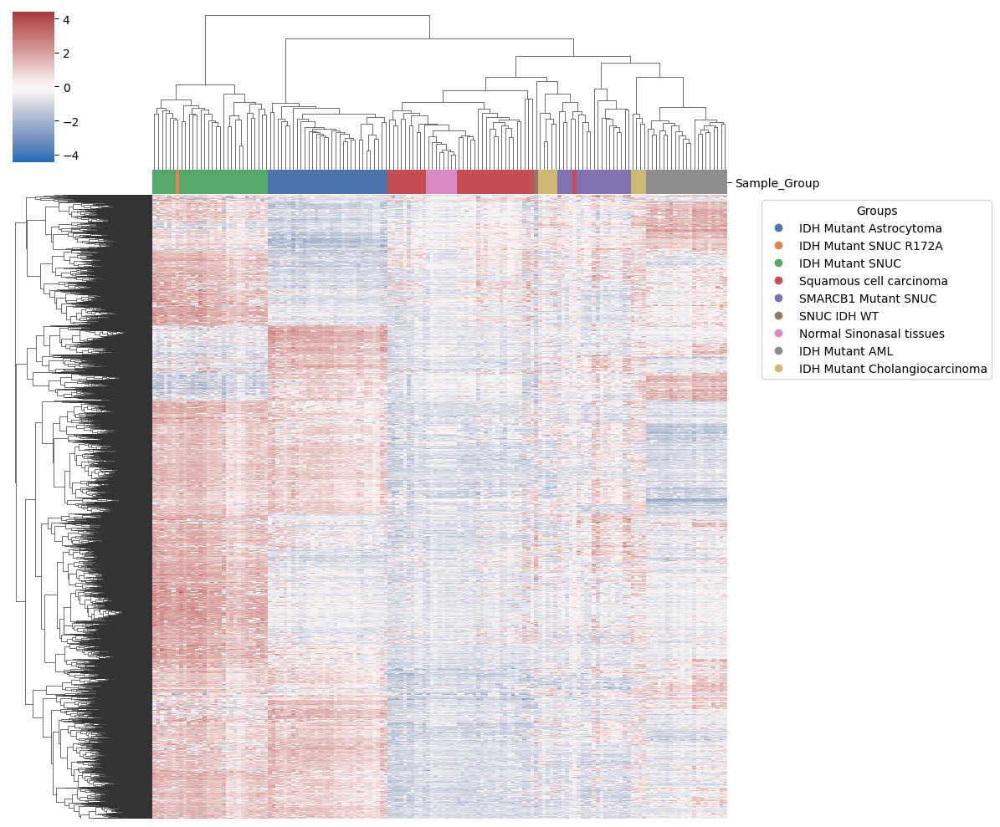

In [25]:
cat = mval5['Sample_Group']
lut = dict(zip(
    cat.unique(), 
    sns.color_palette('deep', cat.unique().size)
))

col_colors = cat.map(lut)
def get_bbox(grid):
    cbar_spacing = 0.05
    cbar_size = 0.025
    
    heat = grid.ax_heatmap.get_position()
    dend = grid.ax_col_dendrogram.get_position()
    y0 = dend.y0
    y1 = dend.y1
    x0 = heat.x1
    x1 = heat.x1 + cbar_size
    return [[x0, y0], [x1, y1]]
plt.figure(figsize=(20, 20), dpi=100000)
grid = sns.clustermap(
    data=mval5.sort_values('Sample_Group').drop(columns='Sample_Group').T,
    cmap="vlag",
    method='complete',
    metric='euclidean',
    z_score=0,
    xticklabels=False,
    col_colors=col_colors,
    yticklabels=False)
#ax.set_xlabel('')
ax = grid.fig.axes[-2]
handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in lut.items()]
ax.legend(title='Groups', handles=handles,  bbox_to_anchor=(1.05, 1), loc='upper left')

plt.savefig("figures/heatmap_clustering.png", bbox_inches='tight')
plt.show()

In [26]:
np.shape(mval5_2)

(149, 20001)

In [27]:
np.shape(mval5)

(149, 10001)

/Users/simonburgermeister/anaconda3/envs/simenv/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/simonburgermeister/anaconda3/envs/simenv/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 200000x200000 with 0 Axes>

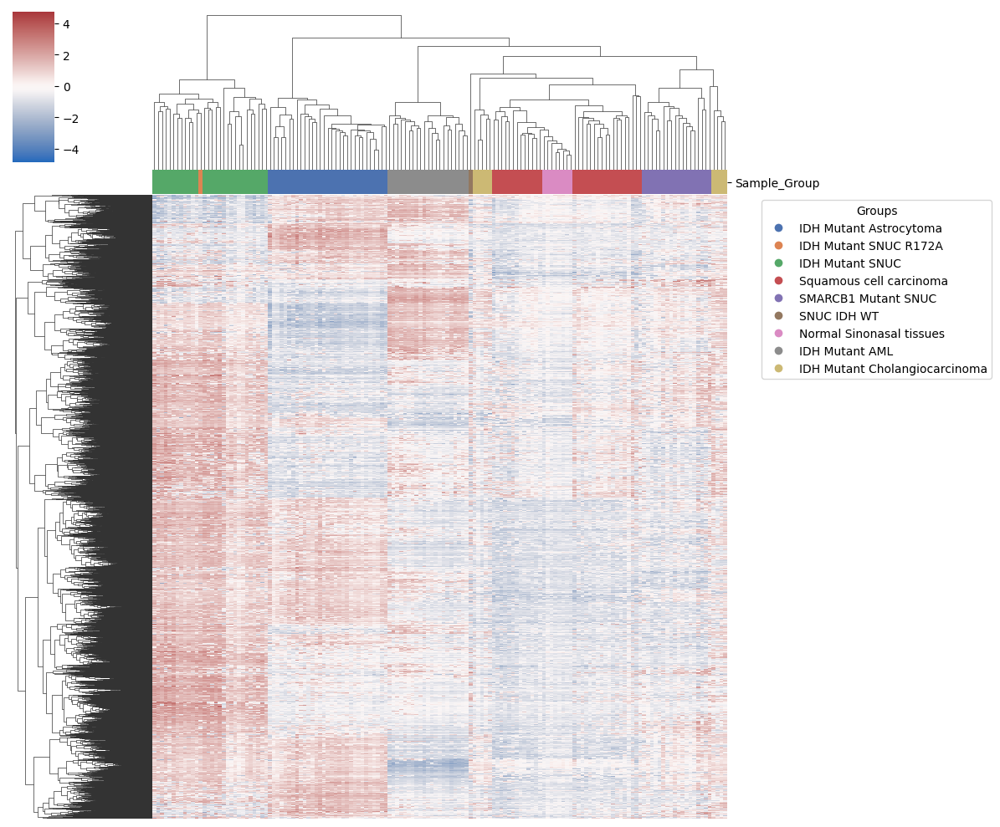

In [28]:
cat = mval5_2['Sample_Group']
lut = dict(zip(
    cat.unique(), 
    sns.color_palette('deep', cat.unique().size)
))

col_colors = cat.map(lut)
def get_bbox(grid):
    cbar_spacing = 0.05
    cbar_size = 0.025
    
    heat = grid.ax_heatmap.get_position()
    dend = grid.ax_col_dendrogram.get_position()
    y0 = dend.y0
    y1 = dend.y1
    x0 = heat.x1
    x1 = heat.x1 + cbar_size
    return [[x0, y0], [x1, y1]]
plt.figure(figsize=(20, 20), dpi=10000)
grid = sns.clustermap(
    data=mval5_2.sort_values('Sample_Group').drop(columns='Sample_Group').T,
    cmap="vlag",
    method='complete',
    metric='euclidean',
    z_score=0,
    xticklabels=False,
    col_colors=col_colors,
    yticklabels=False)
#ax.set_xlabel('')
ax = grid.fig.axes[-2]
handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in lut.items()]
ax.legend(title='Groups', handles=handles,  bbox_to_anchor=(1.05, 1), loc='upper left')

plt.savefig("figures/heatmap_clustering2.png", bbox_inches='tight')
plt.show()

## Umap:
<br>
<br>

In [44]:
mval5_2.loc[mval5_2['Sample_Group']=='SNUC']

,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg24335620,cg22802167,cg17308840,cg17866181,...,cg09007244,cg27124406,cg19565306,cg22012975,cg22531257,cg06996138,cg16817496,cg07660283,cg09226288,Sample_Group
geo_accession,,,,,,,,,,,,,,,,,,,,,
GSM5707359,2.512408,1.391021,-2.019679,-2.246824,-0.267987,0.1041,1.615784,2.214656,-1.865291,3.714561,...,-4.991656,-3.38688,-4.42694,-5.910229,-5.784209,-5.793732,-1.9015,1.997224,0.307736,SNUC


In [34]:
mval5_2=mval3.copy()

remove_cat=['Adenocarcinoma', 'IDH Mutant Breast Cancer sample', 'Intermediate-grade adenocarcinoma', 'IDH Mutant Oligodendroglioma sample']
keep_col=[x for x in np.unique(mval5_2['Sample_Group'].values) if x not in remove_cat]

ex_transposed=mval5_2.loc[mval5_2['Sample_Group'].isin(keep_col)]

ex_transposed.replace({'Sample_Group' : { 'IDH Mutant AML sample' : 'IDH Mutant AML', 
                                 'IDH Mutant Astrocytoma sample' : 'IDH Mutant Astrocytoma',
                                'IDH Mutant Cholangiocarcinoma sample' : 'IDH Mutant Cholangiocarcinoma',
                                'IDH Mutant SNUC sample' : 'IDH Mutant SNUC',
                                'IDH p.Arg172Ala' : 'IDH Mutant SNUC R172A', 'SNUC': 'SNUC IDH WT'}}, inplace=True)



/Users/simonburgermeister/anaconda3/envs/simenv/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


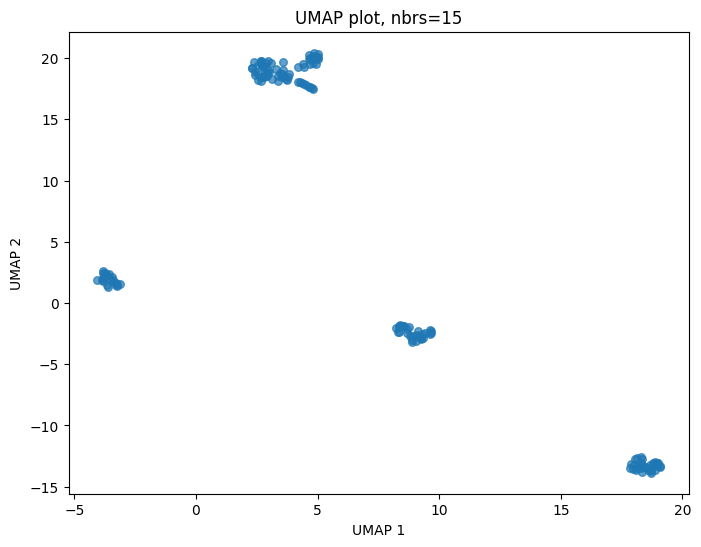

In [35]:

# Create UMAP embedding
n_neighbors = 15
ump = umap.UMAP(n_neighbors=n_neighbors, random_state=123)
ump_result = ump.fit_transform(ex_transposed[lst_5000])

# Convert the result back to a DataFrame
ump_df = pd.DataFrame(ump_result, columns=['UMAP_1', 'UMAP_2'])
ump_df['Sample_Group']=ex_transposed['Sample_Group'].values

# Plot the UMAP
plt.figure(figsize=(8, 6))
plt.scatter(ump_df['UMAP_1'], ump_df['UMAP_2'], s=30, alpha=0.7)
#plt.title("UMAP plot")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

# Add labels without overlaps (you may need to install adjustText package)
#from adjustText import adjust_text
#texts = [plt.text(ump_df.loc[i, 'UMAP_1'], ump_df.loc[i, 'UMAP_2'], i, fontsize=8) for i in ump_df.index]
#adjust_text(texts, force_points=0.1, force_text=0.1, expand_points=(1.5, 1.2), expand_text=(1.5, 1.2),
#            arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))

plt.show()

In [36]:
ump_df.head(10)

,UMAP_1,UMAP_2,Sample_Group
0,18.728884,-13.594458,IDH Mutant Astrocytoma
1,18.578035,-13.663372,IDH Mutant Astrocytoma
2,18.699268,-13.863199,IDH Mutant Astrocytoma
3,18.283789,-12.614695,IDH Mutant Astrocytoma
4,18.972281,-13.283155,IDH Mutant Astrocytoma
5,19.090012,-13.365045,IDH Mutant Astrocytoma
6,9.184724,-2.712182,IDH Mutant SNUC R172A
7,8.539773,-1.904926,IDH Mutant SNUC
8,2.681055,18.127945,Squamous cell carcinoma
9,2.300649,19.225004,Squamous cell carcinoma


In [41]:
len(ump_df.loc[ump_df['Sample_Group']=='SNUC IDH WT'])

1

In [38]:
rowxc=ump_df.loc[ump_df['Sample_Group']=='IDH Mutant SNUC R172A']
rowxc.index=[len(ump_df)]
len(ump_df)
frames = [ump_df, rowxc]
ump_df2 = pd.concat(frames)


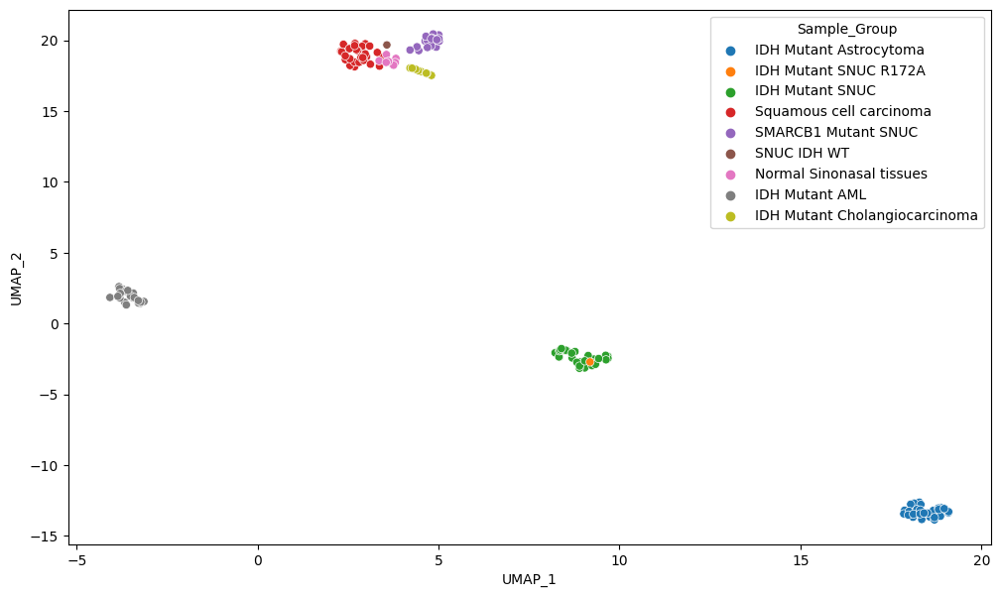

In [39]:
fig, ax = plt.subplots(figsize=(12, 7))
sns.scatterplot(data=ump_df2, x="UMAP_1", y="UMAP_2", hue="Sample_Group")
plt.savefig("figures/UMAP.png", bbox_inches='tight')

In [22]:
np.shape(mval3)

(149, 370463)

## PCA with all remaining probes:
<br>
<br>

In [40]:
mval5_2=mval3.copy()
print(mval5_2.shape)
print(np.unique(mval5_2['Sample_Group'].values))

remove_cat=['SNUC', 'Adenocarcinoma', 'IDH Mutant Breast Cancer sample', 'Intermediate-grade adenocarcinoma', 'IDH Mutant Oligodendroglioma sample']
keep_col=[x for x in np.unique(mval5_2['Sample_Group'].values) if x not in remove_cat]

mval5_3=mval5_2.loc[mval5_2['Sample_Group'].isin(keep_col)]
mval5_3.index.name=None
mval5_3.head()


(149, 370463)
['IDH Mutant AML' 'IDH Mutant Astrocytoma' 'IDH Mutant Cholangiocarcinoma'
 'IDH Mutant SNUC' 'IDH p.Arg172Ala' 'Normal Sinonasal tissues'
 'SMARCB1 Mutant SNUC' 'SNUC' 'Squamous cell carcinoma']


,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg24335620,cg22802167,cg17308840,cg17866181,...,cg09007244,cg27124406,cg19565306,cg22012975,cg22531257,cg06996138,cg16817496,cg07660283,cg09226288,Sample_Group
GSM3537968,2.094343,1.724090,-2.245221,-2.124968,-0.426459,1.744719,1.478431,2.456237,-0.487200,3.386532,...,-2.653503,-2.869020,-4.928417,-5.255113,-4.961358,-4.716255,-0.941111,2.167816,1.194955,IDH Mutant Astrocytoma
GSM3537969,1.352773,0.975134,-1.256909,-1.965901,-0.851713,-0.417677,1.279339,1.938492,-3.081218,3.303877,...,-4.853651,-3.582131,-4.692154,-4.000757,-5.467776,-5.137156,-1.599483,0.189873,0.619513,IDH Mutant Astrocytoma
GSM3537970,2.176738,1.884303,-1.843263,-1.938798,-0.474914,1.879357,1.705545,2.621491,0.480385,2.777403,...,-4.696990,-3.539929,-5.629817,-5.996531,-6.503815,-5.411712,-2.591803,1.942474,1.211467,IDH Mutant Astrocytoma
GSM3537971,2.479487,1.741629,-1.804910,-1.864414,0.011687,0.252497,2.545620,2.381288,-1.349316,3.633878,...,-2.284368,-2.758313,-4.732458,-5.701970,-5.255911,-4.678554,-1.109713,0.139117,1.011608,IDH Mutant Astrocytoma
GSM3537972,2.019058,1.748579,-1.871842,-2.064263,0.698776,2.634146,2.627436,1.974633,-0.633305,3.554897,...,-2.399868,-2.743011,-4.991417,-5.284756,-4.968368,-4.045761,-2.470818,2.564656,0.940583,IDH Mutant Astrocytoma


In [23]:
mval5_3.to_csv('/home/simon/Desktop/bioinfo/methylation/region&pathways_stat/data/M_values.csv')

In [24]:
colxx=[x for x in list(mval5_3.columns) if x != 'Sample_Group']


In [25]:
from sklearn.decomposition import PCA

num_comp=10

pca = PCA(n_components=num_comp)
#pca.fit(mval5_3[colxx].values)

In [26]:
lst_col_pca_df=['Principal component '+str(i) for i in range(1, num_comp+1)]
print(len(lst_col_pca_df))

10


In [27]:
principalComponents = pca.fit_transform(mval5_3[colxx].values)
principalDf = pd.DataFrame(data = principalComponents
             , columns = lst_col_pca_df)

In [ ]:
print(pca.explained_variance_ratio_)
print(np.sum(pca.explained_variance_ratio_))

In [29]:
principalDf['sample group'] = mval5_3['Sample_Group'].values

In [30]:
snuc_pca=principalDf.loc[principalDf['sample group']=='IDH Mutant SNUC']
chuv_sample_pca=principalDf.loc[principalDf['sample group']=='IDH p.Arg172Ala']
center=[np.mean(snuc_pca['Principal component 1']), np.mean(snuc_pca['Principal component 2'])]
std_SNUC=[np.std(snuc_pca['Principal component 1']), np.std(snuc_pca['Principal component 2'])]

In [31]:
snuc_pca[lst_col_pca_df].mean().values

array([-210.24850828,  466.65497004, -180.39240662,  -19.30209867,
        -20.8037903 ,  -35.7306215 ,  -23.65384943,  -26.71516827,
         10.4649107 ,   -1.76915733])

In [32]:
dist = np.linalg.norm(snuc_pca[lst_col_pca_df].mean().values - chuv_sample_pca[lst_col_pca_df].values)
print(np.linalg.norm(snuc_pca[lst_col_pca_df].std().values))
print(dist)

362.42517285688456
263.7755057410136


In [ ]:
principalDf

In [ ]:
principalDf.columns

In [36]:
import math
pi=math.pi

u=center[0]     #x-position of the center
v=center[1]   #y-position of the center
a=std_SNUC[0]*2    #radius on the x-axis
b=std_SNUC[1]*2
a2=std_SNUC[0]    
b2=std_SNUC[1]#radius on the y-axis
t = np.linspace(0, 2*pi, 100)

fig, ax = plt.subplots(figsize=(12, 7), dpi=1000)
sns.scatterplot(data=principalDf, x='Principal component 1', y='Principal component 2', hue="sample group", ax=ax)
#Drawing_uncolored_circle = plt.Circle( (center[0],  center[1]),200 , fill = False )
plt.plot( u+a*np.cos(t) , v+b*np.sin(t), 'k', linewidth=0.5)
plt.plot( u+a2*np.cos(t) , v+b2*np.sin(t), 'k', linewidth=0.5)
#ax.add_artist( Drawing_uncolored_circle )
plt.xlabel('Principal component 1 (explained variance: 21%)')
plt.ylabel('Principal component 2 (explained variance: 16%)')
plt.savefig("figures/pca.png", bbox_inches='tight')

#plt.show()

## Gene level Analysis:
<br>
<br>

In [36]:
np.unique(mval3['Sample_Group'])

array(['IDH Mutant AML', 'IDH Mutant Astrocytoma',
       'IDH Mutant Cholangiocarcinoma', 'IDH Mutant SNUC',
       'IDH p.Arg172Ala', 'Normal Sinonasal tissues',
       'SMARCB1 Mutant SNUC', 'SNUC', 'Squamous cell carcinoma'],
      dtype=object)

In [37]:
lst_sinonas=['IDH Mutant SNUC',
       'Normal sinunasal tissue', 'SMARCB1 Mutant SNUC',
       'Squamous cell carcinoma', 'IDH p.Arg172Ala']

In [38]:
mval6=mval3.loc[mval3['Sample_Group'].isin(lst_sinonas)]
mval6.head()

,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg24335620,cg22802167,cg17308840,cg17866181,...,cg09007244,cg27124406,cg19565306,cg22012975,cg22531257,cg06996138,cg16817496,cg07660283,cg09226288,Sample_Group
geo_accession,,,,,,,,,,,,,,,,,,,,,
IDH p.Arg172Ala,2.224811,1.963439,-1.324801,-1.056423,0.617847,-1.182909,1.928833,2.598120,-0.859596,3.064542,...,-4.542338,-3.275924,-3.997795,-5.876931,-5.499966,-5.317979,-1.771415,2.129647,1.013961,IDH p.Arg172Ala
GSM5707156,1.545423,1.690829,-2.152887,-2.115142,0.347943,-0.049167,1.623873,1.635236,-1.504209,3.182513,...,-4.775937,-3.406537,-4.343341,-5.313324,-5.380807,-5.082322,-0.526318,2.597687,0.935204,IDH Mutant SNUC
GSM5707172,1.926940,1.057615,-2.164495,-2.070738,0.289064,-0.710222,1.227491,2.195618,0.156057,3.029472,...,-5.436020,-3.645294,-6.417907,-5.526651,-6.099088,-6.009526,-2.250580,0.567399,-1.061752,Squamous cell carcinoma
GSM5707201,1.554733,1.070699,-2.409740,-2.063348,0.073463,-0.378384,1.634726,2.514451,-0.858375,3.087034,...,-4.795122,-3.070236,-4.985041,-5.728237,-6.489599,-6.686630,-1.556745,1.424000,-0.571739,Squamous cell carcinoma
GSM5707248,2.136007,0.627833,-1.518957,-1.466152,0.116444,0.444085,1.445478,2.974143,-1.145513,3.513193,...,-5.200712,-3.316511,-4.613676,-5.597826,-6.367983,-5.469353,-2.332832,1.139765,0.790557,SMARCB1 Mutant SNUC


In [39]:
dict_r={'IDH Mutant SNUC sample': 'IDH Mutant SNUC', 
        'Normal sinunasal tissue': 'Other sinonasal',
        'SMARCB1 Mutant SNUC': 'Other sinonasal',
        'Squamous cell carcinoma': 'Other sinonasal'}

mval6['Sample_Group'].replace(dict_r, inplace=True)
mval6.head()

/tmp/ipykernel_70812/4179843346.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mval6['Sample_Group'].replace(dict_r, inplace=True)


,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg24335620,cg22802167,cg17308840,cg17866181,...,cg09007244,cg27124406,cg19565306,cg22012975,cg22531257,cg06996138,cg16817496,cg07660283,cg09226288,Sample_Group
geo_accession,,,,,,,,,,,,,,,,,,,,,
IDH p.Arg172Ala,2.224811,1.963439,-1.324801,-1.056423,0.617847,-1.182909,1.928833,2.598120,-0.859596,3.064542,...,-4.542338,-3.275924,-3.997795,-5.876931,-5.499966,-5.317979,-1.771415,2.129647,1.013961,IDH p.Arg172Ala
GSM5707156,1.545423,1.690829,-2.152887,-2.115142,0.347943,-0.049167,1.623873,1.635236,-1.504209,3.182513,...,-4.775937,-3.406537,-4.343341,-5.313324,-5.380807,-5.082322,-0.526318,2.597687,0.935204,IDH Mutant SNUC
GSM5707172,1.926940,1.057615,-2.164495,-2.070738,0.289064,-0.710222,1.227491,2.195618,0.156057,3.029472,...,-5.436020,-3.645294,-6.417907,-5.526651,-6.099088,-6.009526,-2.250580,0.567399,-1.061752,Other sinonasal
GSM5707201,1.554733,1.070699,-2.409740,-2.063348,0.073463,-0.378384,1.634726,2.514451,-0.858375,3.087034,...,-4.795122,-3.070236,-4.985041,-5.728237,-6.489599,-6.686630,-1.556745,1.424000,-0.571739,Other sinonasal
GSM5707248,2.136007,0.627833,-1.518957,-1.466152,0.116444,0.444085,1.445478,2.974143,-1.145513,3.513193,...,-5.200712,-3.316511,-4.613676,-5.597826,-6.367983,-5.469353,-2.332832,1.139765,0.790557,Other sinonasal


In [40]:
np.unique(mval6['Sample_Group'])

array(['IDH Mutant SNUC', 'IDH p.Arg172Ala', 'Other sinonasal'],
      dtype=object)

In [44]:
idhwt=mval6.loc[mval6['Sample_Group']=='Other sinonasal']
idhmut=mval6.loc[mval6['Sample_Group']=='IDH Mutant SNUC']
idh_new=mval6.loc[mval6['Sample_Group']=='IDH p.Arg172Ala']
idh_new.head()

,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg24335620,cg22802167,cg17308840,cg17866181,...,cg09007244,cg27124406,cg19565306,cg22012975,cg22531257,cg06996138,cg16817496,cg07660283,cg09226288,Sample_Group
geo_accession,,,,,,,,,,,,,,,,,,,,,
IDH p.Arg172Ala,2.224811,1.963439,-1.324801,-1.056423,0.617847,-1.182909,1.928833,2.59812,-0.859596,3.064542,...,-4.542338,-3.275924,-3.997795,-5.876931,-5.499966,-5.317979,-1.771415,2.129647,1.013961,IDH p.Arg172Ala


In [42]:
lst_val_sites=[x for x in list(mval6.columns) if x not in ['geo_accession', 'Sample_Group', 'Cluster']]
print(len(lst_val_sites))

370462


In [43]:
lst_results=[]

#lst_val_sites2=lst_val_sites[0:4]
import scipy.stats as stats
for el in lst_val_sites:
    stts=stats.f_oneway(idhwt[el].values, idhmut[el].values)
    print(stts)
    mediandiff_mut_wt=np.median(idhmut[el].values)-np.median(idhwt[el].values)
    lst_results.append([el, stts.statistic, stts.pvalue, mediandiff_mut_wt])
    

df_stat=pd.DataFrame(lst_results, columns=['region', 'statistic', 'P', 'IDHmt-IDHWT (median)'])


F_onewayResult(statistic=0.5306923142578481, pvalue=0.4685547281538329)
F_onewayResult(statistic=53.637557532671686, pvalue=2.1444313122603617e-10)
F_onewayResult(statistic=40.015223142202196, pvalue=1.5870291933300092e-08)
F_onewayResult(statistic=40.84234906303455, pvalue=1.2040265375508146e-08)
F_onewayResult(statistic=8.415750394049729, pvalue=0.004863004396243929)
F_onewayResult(statistic=17.781014943404784, pvalue=6.768509877301409e-05)
F_onewayResult(statistic=9.072492744351164, pvalue=0.0035225371195797997)
F_onewayResult(statistic=4.333281694757221, pvalue=0.040741253643437274)
F_onewayResult(statistic=0.26782162612241617, pvalue=0.6062998811311651)
F_onewayResult(statistic=0.20072346570947686, pvalue=0.6554120954368546)
F_onewayResult(statistic=3.449262163289846, pvalue=0.0671542811914403)
F_onewayResult(statistic=4.006261089577795, pvalue=0.048901028641197684)
F_onewayResult(statistic=0.08148769105865114, pvalue=0.7760679170486134)
F_onewayResult(statistic=7.8993874339804595

F_onewayResult(statistic=35.48229895072753, pvalue=7.4916086345974e-08)
F_onewayResult(statistic=37.76506238040086, pvalue=3.4006781393426946e-08)
F_onewayResult(statistic=923.2420025116282, pvalue=2.8857301957725364e-44)
F_onewayResult(statistic=1057.5878335905968, pvalue=2.379001184429872e-46)
F_onewayResult(statistic=1245.8935318123629, pvalue=6.887693911983796e-49)
F_onewayResult(statistic=912.6646556742656, pvalue=4.32578885102428e-44)
F_onewayResult(statistic=246.43191133431728, pvalue=1.4690822152771584e-25)
F_onewayResult(statistic=3.1878831823994647, pvalue=0.07817551987028845)
F_onewayResult(statistic=8.966517333797547, pvalue=0.003709608936364323)
F_onewayResult(statistic=68.23576022065376, pvalue=3.4896338677335363e-12)
F_onewayResult(statistic=8.659186331860235, pvalue=0.004312924601242033)
F_onewayResult(statistic=9.501844376132846, pvalue=0.0028594932620511202)
F_onewayResult(statistic=1.066870947138255, pvalue=0.30492899657987416)
F_onewayResult(statistic=6.425216349918

F_onewayResult(statistic=1.0820446323436208, pvalue=0.3015385765912575)
F_onewayResult(statistic=26.343937275889555, pvalue=2.130725121747539e-06)
F_onewayResult(statistic=2.477965265399666, pvalue=0.11960549284379832)
F_onewayResult(statistic=2.0294766851949033, pvalue=0.15836719775067093)
F_onewayResult(statistic=6.775207244469843, pvalue=0.011109067610417822)
F_onewayResult(statistic=11.528326935308698, pvalue=0.0010924890275658217)
F_onewayResult(statistic=31.8210009957038, pvalue=2.7596846217633917e-07)
F_onewayResult(statistic=46.89209945659756, pvalue=1.697127362830567e-09)
F_onewayResult(statistic=33.077790511459845, pvalue=1.7545091295446248e-07)
F_onewayResult(statistic=1.9928456121359894, pvalue=0.16212481871860465)
F_onewayResult(statistic=2.268567263525992, pvalue=0.13616718155263402)
F_onewayResult(statistic=0.2844235080745986, pvalue=0.5953726714760896)
F_onewayResult(statistic=0.01386993271271189, pvalue=0.9065600626477706)
F_onewayResult(statistic=55.826734490311, pval

F_onewayResult(statistic=1.0647162415609832, pvalue=0.3054144891551871)
F_onewayResult(statistic=2.5093228034493, pvalue=0.11732718894290498)
F_onewayResult(statistic=0.0008391911668061273, pvalue=0.9769654137324149)
F_onewayResult(statistic=0.3969351019984247, pvalue=0.5305660632988503)
F_onewayResult(statistic=5.2843242692903445, pvalue=0.024267703524861243)
F_onewayResult(statistic=39.23114209539802, pvalue=2.0660179031315137e-08)
F_onewayResult(statistic=73.78912156307496, pvalue=8.146166365443831e-13)
F_onewayResult(statistic=0.018209660246550716, pvalue=0.893013554464976)
F_onewayResult(statistic=3.5791589757002478, pvalue=0.06231812261954689)
F_onewayResult(statistic=0.7296156100470882, pvalue=0.39569225648491824)
F_onewayResult(statistic=0.8435787904652571, pvalue=0.3612810047608799)
F_onewayResult(statistic=6.178936110145928, pvalue=0.015124624608743262)
F_onewayResult(statistic=0.02417846061330739, pvalue=0.8768439461577124)
F_onewayResult(statistic=22.221443269328326, pvalue

F_onewayResult(statistic=0.7034904145934398, pvalue=0.40424372019759336)
F_onewayResult(statistic=0.3117711770026993, pvalue=0.5782366860862842)
F_onewayResult(statistic=22.835301750034628, pvalue=8.425573479979167e-06)
F_onewayResult(statistic=0.026350705640189834, pvalue=0.8714775962515084)
F_onewayResult(statistic=4.9756051450676635, pvalue=0.028657442595439075)
F_onewayResult(statistic=3.423367168985558, pvalue=0.06816643078442143)
F_onewayResult(statistic=0.8843734755505374, pvalue=0.34998607830988937)
F_onewayResult(statistic=0.24425483324817215, pvalue=0.6225753023612839)
F_onewayResult(statistic=0.789597287250762, pvalue=0.377025747315495)
F_onewayResult(statistic=6.407437421094636, pvalue=0.013430095339810353)
F_onewayResult(statistic=0.03713242666849115, pvalue=0.8477096844322525)
F_onewayResult(statistic=3.50750630622268, pvalue=0.06493706628708178)
F_onewayResult(statistic=3.705891328375283, pvalue=0.0579626790898793)
F_onewayResult(statistic=0.06636854837392187, pvalue=0.7

F_onewayResult(statistic=0.002557390047405094, pvalue=0.9598003310759987)
F_onewayResult(statistic=14.556450068142631, pvalue=0.0002751814277224956)
F_onewayResult(statistic=16.25464846911055, pvalue=0.00013045192879515357)
F_onewayResult(statistic=2.224373624247232, pvalue=0.13998700131407713)
F_onewayResult(statistic=0.14394772370011352, pvalue=0.7054456026371101)
F_onewayResult(statistic=0.06887726025308737, pvalue=0.7936886435349123)
F_onewayResult(statistic=20.28764807153512, pvalue=2.3695216746711632e-05)
F_onewayResult(statistic=2.0322328602987803, pvalue=0.15808857456908737)
F_onewayResult(statistic=65.49224421368477, pvalue=7.314920302813485e-12)
F_onewayResult(statistic=0.8895146870149065, pvalue=0.34859741197207306)
F_onewayResult(statistic=0.2541700253750421, pvalue=0.6156124817910515)
F_onewayResult(statistic=2.2017512773086914, pvalue=0.1419896220343199)
F_onewayResult(statistic=6.2227570122225835, pvalue=0.01478301145887033)
F_onewayResult(statistic=0.002090964497907805,

F_onewayResult(statistic=10.355087282763842, pvalue=0.001898845914526232)
F_onewayResult(statistic=1.6251750820444182, pvalue=0.20625543400600546)
F_onewayResult(statistic=1.0236363920787923, pvalue=0.3148683074015633)
F_onewayResult(statistic=0.04012751391199022, pvalue=0.8417665440020567)
F_onewayResult(statistic=1.5926279726653305, pvalue=0.2108102899951499)
F_onewayResult(statistic=5.151657769244499, pvalue=0.026059605314869883)
F_onewayResult(statistic=5.376083181250016, pvalue=0.02310508530334007)
F_onewayResult(statistic=0.522120602348685, pvalue=0.47215620942914516)
F_onewayResult(statistic=2.0453895921101464, pvalue=0.1567663458320355)
F_onewayResult(statistic=24.67515422940968, pvalue=4.0696335108625495e-06)
F_onewayResult(statistic=51.01729037948345, pvalue=4.72460062608936e-10)
F_onewayResult(statistic=58.64518416521036, pvalue=4.9579699151529374e-11)
F_onewayResult(statistic=2.8828857048641217, pvalue=0.09361671425133512)
F_onewayResult(statistic=81.9619762925504, pvalue=1

F_onewayResult(statistic=78.45580164079568, pvalue=2.5021327085649507e-13)
F_onewayResult(statistic=4.851985664236626, pvalue=0.030645430457200817)
F_onewayResult(statistic=12.752432751420784, pvalue=0.0006207731777661567)
F_onewayResult(statistic=184.45782667749725, pvalue=5.077551336535327e-22)
F_onewayResult(statistic=53.24987175166029, pvalue=2.407750066113586e-10)
F_onewayResult(statistic=0.0024692928214153425, pvalue=0.9604982126991763)
F_onewayResult(statistic=2.5636968342854844, pvalue=0.11349142970568882)
F_onewayResult(statistic=2.896214167328256, pvalue=0.0928755380624765)
F_onewayResult(statistic=1.4674272325584838, pvalue=0.22950523658734776)
F_onewayResult(statistic=4.743201044408482, pvalue=0.032516540623062765)
F_onewayResult(statistic=26.797069035880863, pvalue=1.791055200228202e-06)
F_onewayResult(statistic=4.93652792320927, pvalue=0.02927059436350159)
F_onewayResult(statistic=0.023292985550406483, pvalue=0.8791021058754592)
F_onewayResult(statistic=1.2875958128165859

F_onewayResult(statistic=13.607003853337359, pvalue=0.00042107739034727106)
F_onewayResult(statistic=0.018790373470781975, pvalue=0.8913316508167387)
F_onewayResult(statistic=10.86650889438656, pvalue=0.0014901736780234976)
F_onewayResult(statistic=50.25859430481877, pvalue=5.9576471452822e-10)
F_onewayResult(statistic=1.9834754704065929, pvalue=0.16310255621807898)
F_onewayResult(statistic=0.32074378371005996, pvalue=0.5728296448574807)
F_onewayResult(statistic=8.382800860625157, pvalue=0.004942895411833289)
F_onewayResult(statistic=11.029409943856157, pvalue=0.0013800972188748972)
F_onewayResult(statistic=56.381774647490715, pvalue=9.54291039433316e-11)
F_onewayResult(statistic=51.696131760595236, pvalue=3.8440245042167883e-10)
F_onewayResult(statistic=3.5543029752936817, pvalue=0.06321336864679769)
F_onewayResult(statistic=15.180751817567176, pvalue=0.00020870702821419417)
F_onewayResult(statistic=18.632559647997766, pvalue=4.720644667418483e-05)
F_onewayResult(statistic=1.752868125

F_onewayResult(statistic=26.733341969427467, pvalue=1.835240771485776e-06)
F_onewayResult(statistic=26.586551239451257, pvalue=1.941336072651219e-06)
F_onewayResult(statistic=31.364161406717372, pvalue=3.258222363144841e-07)
F_onewayResult(statistic=3.6336109439236393, pvalue=0.06040469837976143)
F_onewayResult(statistic=35.918817286004575, pvalue=6.432855781769197e-08)
F_onewayResult(statistic=19.985136173280516, pvalue=2.684792535218726e-05)
F_onewayResult(statistic=2.311993287067939, pvalue=0.13252904421810763)
F_onewayResult(statistic=0.28110112186707825, pvalue=0.5975260958017361)
F_onewayResult(statistic=4.32540957996779, pvalue=0.04091950289153258)
F_onewayResult(statistic=2.5616153869009146, pvalue=0.11363564225066114)
F_onewayResult(statistic=4.635646642892697, pvalue=0.03448674341166084)
F_onewayResult(statistic=0.36129333839967015, pvalue=0.5495774068638231)
F_onewayResult(statistic=0.042855668188914106, pvalue=0.8365509362407859)
F_onewayResult(statistic=1.1902288217493764,

F_onewayResult(statistic=2.4360191774934736e-05, pvalue=0.9960749059502026)
F_onewayResult(statistic=13.062159628566999, pvalue=0.0005389877314909092)
F_onewayResult(statistic=4.592084718581729, pvalue=0.0353206490634854)
F_onewayResult(statistic=9.911260051257456, pvalue=0.002347588580766276)
F_onewayResult(statistic=3.2369697423695714, pvalue=0.07596329922989895)
F_onewayResult(statistic=0.32979127671917363, pvalue=0.5674779050770435)
F_onewayResult(statistic=0.5386388464693864, pvalue=0.46525555247422534)
F_onewayResult(statistic=0.9086861792877328, pvalue=0.3434853074927433)
F_onewayResult(statistic=0.20924343069846293, pvalue=0.6486660324726776)
F_onewayResult(statistic=1.618349986876592, pvalue=0.2072007039598493)
F_onewayResult(statistic=1.6526092059443485, pvalue=0.20250762123794483)
F_onewayResult(statistic=0.12737733264739753, pvalue=0.7221560148591167)
F_onewayResult(statistic=0.0017902018614116063, pvalue=0.9663619170418724)
F_onewayResult(statistic=21.762080751763257, pval

F_onewayResult(statistic=115.02363109858074, pvalue=7.182165781817415e-17)
F_onewayResult(statistic=1.4042054183574353, pvalue=0.23971297682763207)
F_onewayResult(statistic=21.792526651933045, pvalue=1.2815900563763006e-05)
F_onewayResult(statistic=1.6239271459057971, pvalue=0.2064278847557611)
F_onewayResult(statistic=18.140841891300315, pvalue=5.809715516432304e-05)
F_onewayResult(statistic=5.550700497298374, pvalue=0.02105253807432927)
F_onewayResult(statistic=70.80590916984305, pvalue=1.7673199296191455e-12)
F_onewayResult(statistic=16.950589734961003, pvalue=9.656052074648674e-05)
F_onewayResult(statistic=1.062142967058609, pvalue=0.3059956226490349)
F_onewayResult(statistic=6.125210304397957, pvalue=0.015554834568585894)
F_onewayResult(statistic=0.930292807838882, pvalue=0.3378459249476756)
F_onewayResult(statistic=80.52562925708176, pvalue=1.499652448661987e-13)
F_onewayResult(statistic=89.43494449073704, pvalue=1.787036041054098e-14)
F_onewayResult(statistic=13.413170032196627,

F_onewayResult(statistic=6.039131764466879, pvalue=0.016271198265181225)
F_onewayResult(statistic=8.846028009443891, pvalue=0.003934926621999589)
F_onewayResult(statistic=84.95524927917012, pvalue=5.130194559521558e-14)
F_onewayResult(statistic=84.0770508445941, pvalue=6.330580299026716e-14)
F_onewayResult(statistic=90.7440573058822, pvalue=1.3203101414597879e-14)
F_onewayResult(statistic=47.027260556813324, pvalue=1.6263385471813857e-09)
F_onewayResult(statistic=58.24492187317883, pvalue=5.5619999098647806e-11)
F_onewayResult(statistic=0.3082092396496726, pvalue=0.580411567128166)
F_onewayResult(statistic=0.1211048897124787, pvalue=0.728801274730261)
F_onewayResult(statistic=9.399900308583737, pvalue=0.003004168849455069)
F_onewayResult(statistic=2.5604992787853282, pvalue=0.11371305627103895)
F_onewayResult(statistic=98.71559426215842, pvalue=2.1988835624885853e-15)
F_onewayResult(statistic=1.4193749805008933, pvalue=0.23721364975399822)
F_onewayResult(statistic=43.723530546443676, p

F_onewayResult(statistic=0.04655152605963826, pvalue=0.8297543767361905)
F_onewayResult(statistic=0.05834038192313743, pvalue=0.8097890316326536)
F_onewayResult(statistic=4.269402850598726, pvalue=0.0422120769800383)
F_onewayResult(statistic=0.029896595699152654, pvalue=0.8631847240974584)
F_onewayResult(statistic=0.2157934644125282, pvalue=0.6435920155258746)
F_onewayResult(statistic=2.8157508097795647, pvalue=0.09745116629140202)
F_onewayResult(statistic=0.6647948911425481, pvalue=0.41742016417730854)
F_onewayResult(statistic=2.716160589669329, pvalue=0.10346509319853983)
F_onewayResult(statistic=1.7921728325495303, pvalue=0.1846524671801717)
F_onewayResult(statistic=0.0039410059040194635, pvalue=0.9501085514260007)
F_onewayResult(statistic=12.371791383226498, pvalue=0.0007391738634553144)
F_onewayResult(statistic=2.1806587183275266, pvalue=0.14388640771707262)
F_onewayResult(statistic=6.408834250453171, pvalue=0.013420373826958012)
F_onewayResult(statistic=0.10945542174979624, pvalu

F_onewayResult(statistic=0.010028707779272417, pvalue=0.9204941537515641)
F_onewayResult(statistic=17.846548831001353, pvalue=6.582454473334495e-05)
F_onewayResult(statistic=23.000414804418593, pvalue=7.887912114989353e-06)
F_onewayResult(statistic=0.8217418310003061, pvalue=0.36753652986380725)
F_onewayResult(statistic=37.74781971415194, pvalue=3.420807896189579e-08)
F_onewayResult(statistic=0.5097031191641332, pvalue=0.4774542984505672)
F_onewayResult(statistic=13.279587624276859, pvalue=0.000488297766429831)
F_onewayResult(statistic=13.936895584588719, pvalue=0.00036297367978585906)
F_onewayResult(statistic=0.5152839596380954, pvalue=0.4750611654800685)
F_onewayResult(statistic=33.4430980786563, pvalue=1.539721030764434e-07)
F_onewayResult(statistic=9.995858140438054, pvalue=0.0022542522221756585)
F_onewayResult(statistic=0.18624709689123436, pvalue=0.667280451438327)
F_onewayResult(statistic=2.3930719648777985, pvalue=0.12602816529864805)
F_onewayResult(statistic=1.7714203159506923

F_onewayResult(statistic=0.2773038552467176, pvalue=0.6000074157877848)
F_onewayResult(statistic=101.99349354889627, pvalue=1.0777633439246348e-15)
F_onewayResult(statistic=77.88355088133541, pvalue=2.8861146460674153e-13)
F_onewayResult(statistic=8.792100429605448, pvalue=0.0040403458845233095)
F_onewayResult(statistic=8.564441717974965, pvalue=0.004518875177230394)
F_onewayResult(statistic=31.69744339303871, pvalue=2.886240580531669e-07)
F_onewayResult(statistic=82.49917331980404, pvalue=9.263902925438862e-14)
F_onewayResult(statistic=0.04102447743797331, pvalue=0.8400319254058048)
F_onewayResult(statistic=4.707240897946399, pvalue=0.0331615528876612)
F_onewayResult(statistic=2.9194323564521105, pvalue=0.0915998878570222)
F_onewayResult(statistic=0.2830009425408067, pvalue=0.5962927257475763)
F_onewayResult(statistic=0.6292324845300163, pvalue=0.43010653025729295)
F_onewayResult(statistic=0.78192824045979, pvalue=0.37934098543867156)
F_onewayResult(statistic=0.0038655924988635413, pv

F_onewayResult(statistic=3.301226006809951, pvalue=0.0731704982180313)
F_onewayResult(statistic=1.2667897110785358, pvalue=0.2639116062213583)
F_onewayResult(statistic=0.0737438934240484, pvalue=0.7866979824340232)
F_onewayResult(statistic=1.2899854056739024, pvalue=0.2596196362783919)
F_onewayResult(statistic=17.278879487698372, pvalue=8.386757596930166e-05)
F_onewayResult(statistic=4.541535084154495, pvalue=0.0363154157571554)
F_onewayResult(statistic=40.218779451920184, pvalue=1.4824542813525687e-08)
F_onewayResult(statistic=1.0232401009796854, pvalue=0.3149613767374759)
F_onewayResult(statistic=7.502102475210297, pvalue=0.007674155833671561)
F_onewayResult(statistic=0.44126808653661287, pvalue=0.5085214759934036)
F_onewayResult(statistic=6.3506199887723, pvalue=0.013831873105568054)
F_onewayResult(statistic=1.9491153798464185, pvalue=0.16674702270678968)
F_onewayResult(statistic=0.14451243289315804, pvalue=0.7048959637038479)
F_onewayResult(statistic=8.29738333698561, pvalue=0.0051

F_onewayResult(statistic=0.49819091741611987, pvalue=0.48245410205355765)
F_onewayResult(statistic=1.9995460066307837, pvalue=0.161429830464049)
F_onewayResult(statistic=0.15922842688882508, pvalue=0.6909869194296623)
F_onewayResult(statistic=3.157210469107116, pvalue=0.07959372252305627)
F_onewayResult(statistic=11.207194153626684, pvalue=0.0012695347898661364)
F_onewayResult(statistic=52.8408894889441, pvalue=2.721724931907144e-10)
F_onewayResult(statistic=74.56685244331997, pvalue=6.674084301828149e-13)
F_onewayResult(statistic=37.01304701604835, pvalue=4.402934445471242e-08)
F_onewayResult(statistic=53.447831604117226, pvalue=2.2693842671134498e-10)
F_onewayResult(statistic=58.560293450049905, pvalue=5.080190014469637e-11)
F_onewayResult(statistic=60.958078031001534, pvalue=2.569080283824911e-11)
F_onewayResult(statistic=61.17160976167504, pvalue=2.4191848394961023e-11)
F_onewayResult(statistic=70.17352732786006, pvalue=2.0869790302624624e-12)
F_onewayResult(statistic=50.3294351007

F_onewayResult(statistic=0.290433805770995, pvalue=0.5915178576678572)
F_onewayResult(statistic=2.7208221852534473, pvalue=0.10317454360161417)
F_onewayResult(statistic=15.45921424598592, pvalue=0.0001846380826373271)
F_onewayResult(statistic=25.08390763834921, pvalue=3.469249298594898e-06)
F_onewayResult(statistic=0.026478664109937655, pvalue=0.8711686963189886)
F_onewayResult(statistic=2.0713960994962104, pvalue=0.1541901666942128)
F_onewayResult(statistic=6.27837620587614, pvalue=0.01436108178928221)
F_onewayResult(statistic=5.031311000261324, pvalue=0.02780688541890507)
F_onewayResult(statistic=3.5992838480417357, pvalue=0.06160337596877513)
F_onewayResult(statistic=49.36610958890692, pvalue=7.840722093137838e-10)
F_onewayResult(statistic=104.09323385120243, pvalue=6.873546538285745e-16)
F_onewayResult(statistic=66.56601819941224, pvalue=5.465737272460961e-12)
F_onewayResult(statistic=28.168640698513634, pvalue=1.0643185439509892e-06)
F_onewayResult(statistic=9.761690039384847, pva

F_onewayResult(statistic=36.816909798248815, pvalue=4.711195354114332e-08)
F_onewayResult(statistic=37.13575404267537, pvalue=4.220693100189672e-08)
F_onewayResult(statistic=53.08722338923499, pvalue=2.527903909029766e-10)
F_onewayResult(statistic=46.61208468011007, pvalue=1.854028351389689e-09)
F_onewayResult(statistic=10.81569897415808, pvalue=0.001526339869421759)
F_onewayResult(statistic=2.841959181950175, pvalue=0.0959338889997748)
F_onewayResult(statistic=6.116055935864393, pvalue=0.01562941457065584)
F_onewayResult(statistic=6.038767852682629, pvalue=0.016274299585804012)
F_onewayResult(statistic=1.4441984121047227, pvalue=0.23319253980742594)
F_onewayResult(statistic=48.46895773041548, pvalue=1.0355226693194957e-09)
F_onewayResult(statistic=41.578453214770704, pvalue=9.432844617879437e-09)
F_onewayResult(statistic=37.61654129731414, pvalue=3.578138272347346e-08)
F_onewayResult(statistic=33.62412790628296, pvalue=1.4434886694941827e-07)
F_onewayResult(statistic=43.32451157611771

F_onewayResult(statistic=0.0006389981681346277, pvalue=0.9798991487223359)
F_onewayResult(statistic=5.845046764182228, pvalue=0.018017137721722892)
F_onewayResult(statistic=13.221014740284675, pvalue=0.0005014478830091719)
F_onewayResult(statistic=27.075287572230202, pvalue=1.6105975722852334e-06)
F_onewayResult(statistic=0.2896151268230853, pvalue=0.592039884361336)
F_onewayResult(statistic=5.805922550015949, pvalue=0.018392441530957218)
F_onewayResult(statistic=2.3764097338168155, pvalue=0.1273340550815656)
F_onewayResult(statistic=5.812727677762174, pvalue=0.018326574157753194)
F_onewayResult(statistic=18.36080111175476, pvalue=5.2936567560872834e-05)
F_onewayResult(statistic=16.552883712750468, pvalue=0.00011463319917082602)
F_onewayResult(statistic=18.697985024180372, pvalue=4.5924979873341805e-05)
F_onewayResult(statistic=12.011669907393097, pvalue=0.0008727727877609303)
F_onewayResult(statistic=0.5649840895412458, pvalue=0.45458046022199217)
F_onewayResult(statistic=0.0098419721

F_onewayResult(statistic=97.42933976505546, pvalue=2.9196944640919697e-15)
F_onewayResult(statistic=4.17214930238775, pvalue=0.04456191076241126)
F_onewayResult(statistic=3.5017290277485684, pvalue=0.06515338916254985)
F_onewayResult(statistic=6.798948827984167, pvalue=0.010974507030116926)
F_onewayResult(statistic=3.799618435656437, pvalue=0.05495416092827393)
F_onewayResult(statistic=18.823418049160555, pvalue=4.3567440974542273e-05)
F_onewayResult(statistic=3.278703769998342, pvalue=0.07413637833629491)
F_onewayResult(statistic=29.979736254561843, pvalue=5.415127012435123e-07)
F_onewayResult(statistic=113.40450010200338, pvalue=9.952070703078793e-17)
F_onewayResult(statistic=21.004375808826723, pvalue=1.7657573970943013e-05)
F_onewayResult(statistic=19.048786742003916, pvalue=3.963989788691998e-05)
F_onewayResult(statistic=32.40717962250102, pvalue=2.232575397947106e-07)
F_onewayResult(statistic=3.201505081745449, pvalue=0.07755460779929887)
F_onewayResult(statistic=19.3835889369133

F_onewayResult(statistic=36.97310322888219, pvalue=4.4639867647547724e-08)
F_onewayResult(statistic=1.3462227052024276, pvalue=0.24957141331350877)
F_onewayResult(statistic=12.603732528588166, pvalue=0.0006645007383014525)
F_onewayResult(statistic=3.266363157014586, pvalue=0.07467152811504672)
F_onewayResult(statistic=1.4964920463264675, pvalue=0.22499140416250973)
F_onewayResult(statistic=2.686653843601748, pvalue=0.10532552294854657)
F_onewayResult(statistic=26.40676600531495, pvalue=2.0799264604220266e-06)
F_onewayResult(statistic=12.49929861651031, pvalue=0.0006971068022771501)
F_onewayResult(statistic=44.794978480657534, pvalue=3.3081167516264684e-09)
F_onewayResult(statistic=46.274056168904714, pvalue=2.0634661028995825e-09)
F_onewayResult(statistic=137.0475145703714, pvalue=1.1007325170504997e-18)
F_onewayResult(statistic=97.47931068255454, pvalue=2.887595108567611e-15)
F_onewayResult(statistic=71.14854758191544, pvalue=1.6155757694048973e-12)
F_onewayResult(statistic=51.7423889

F_onewayResult(statistic=11.918255103654161, pvalue=0.0009113542059777562)
F_onewayResult(statistic=2.6773212590810105, pvalue=0.10592170556414798)
F_onewayResult(statistic=44.924658168480065, pvalue=3.173243015286856e-09)
F_onewayResult(statistic=9.225812879614567, pvalue=0.0032690914606345964)
F_onewayResult(statistic=2.097391623458357, pvalue=0.15166378959859952)
F_onewayResult(statistic=3.897888755857686, pvalue=0.05198033115552218)
F_onewayResult(statistic=0.366125054761848, pvalue=0.5469265754473844)
F_onewayResult(statistic=3.0930107078765863, pvalue=0.08265455300850538)
F_onewayResult(statistic=0.18887867817372386, pvalue=0.6650830264953956)
F_onewayResult(statistic=9.632075624898782, pvalue=0.002685140524384864)
F_onewayResult(statistic=3.8942911375589313, pvalue=0.0520860793008022)
F_onewayResult(statistic=0.6824462448236996, pvalue=0.4113315249591396)
F_onewayResult(statistic=4.3557627243539505, pvalue=0.040236781681547595)
F_onewayResult(statistic=0.19964009062509047, pvalu

F_onewayResult(statistic=0.7376753464119564, pvalue=0.3931074337447156)
F_onewayResult(statistic=0.6870835755325344, pvalue=0.4097539022357384)
F_onewayResult(statistic=0.10764630126308378, pvalue=0.7437420675099158)
F_onewayResult(statistic=3.1006611610524635, pvalue=0.08228309681417953)
F_onewayResult(statistic=4.22781583172332, pvalue=0.04320019107241332)
F_onewayResult(statistic=16.870822356572965, pvalue=9.993371141962728e-05)
F_onewayResult(statistic=2.452382448730197, pvalue=0.12150121154031017)
F_onewayResult(statistic=4.218106150860509, pvalue=0.04343445338638247)
F_onewayResult(statistic=45.147346065944426, pvalue=2.954663040311098e-09)
F_onewayResult(statistic=10.822486051888959, pvalue=0.0015214566571233597)
F_onewayResult(statistic=29.89090445443591, pvalue=5.595941126019857e-07)
F_onewayResult(statistic=1.8662015041427777, pvalue=0.1759395498569822)
F_onewayResult(statistic=2.578308080041177, pvalue=0.11248485825193942)
F_onewayResult(statistic=1.8671043217623293, pvalue=

F_onewayResult(statistic=1.404568017916688, pvalue=0.23965285749836096)
F_onewayResult(statistic=0.30520511771631, pvalue=0.5822586975224728)
F_onewayResult(statistic=3.5403925655651265, pvalue=0.06372048167127678)
F_onewayResult(statistic=0.016226552133120072, pvalue=0.8989733306326837)
F_onewayResult(statistic=2.6884930008093373, pvalue=0.10520847692916634)
F_onewayResult(statistic=0.10776893449505194, pvalue=0.7436013697735133)
F_onewayResult(statistic=1.027146497098792, pvalue=0.31404554448741434)
F_onewayResult(statistic=4.492103500643196, pvalue=0.03731720221121311)
F_onewayResult(statistic=3.2931188968077554, pvalue=0.07351658026749538)
F_onewayResult(statistic=36.03761545709557, pvalue=6.172248345213494e-08)
F_onewayResult(statistic=9.087768672307988, pvalue=0.0034963924123962236)
F_onewayResult(statistic=0.3859998425386737, pvalue=0.5362686666683825)
F_onewayResult(statistic=0.9454494541736872, pvalue=0.3339648966246783)
F_onewayResult(statistic=0.5279076628912096, pvalue=0.46

F_onewayResult(statistic=10.058982133796796, pvalue=0.002187124389450018)
F_onewayResult(statistic=0.48951917338056083, pvalue=0.4862779033780691)
F_onewayResult(statistic=1.291232206837535, pvalue=0.2593914309964947)
F_onewayResult(statistic=3.1891288812730463, pvalue=0.07811851243390129)
F_onewayResult(statistic=22.703340240800394, pvalue=8.882327513778519e-06)
F_onewayResult(statistic=5.468102859129256, pvalue=0.021998264366160872)
F_onewayResult(statistic=22.658390011191123, pvalue=9.043668534587167e-06)
F_onewayResult(statistic=80.9237299240652, pvalue=1.3601147317672408e-13)
F_onewayResult(statistic=35.09992547923924, pvalue=8.565804905865411e-08)
F_onewayResult(statistic=39.57919948366183, pvalue=1.837312649088693e-08)
F_onewayResult(statistic=36.823515975318244, pvalue=4.7004600154087166e-08)
F_onewayResult(statistic=34.73087365570822, pvalue=9.753016548656432e-08)
F_onewayResult(statistic=29.596199913143412, pvalue=6.241527782896044e-07)
F_onewayResult(statistic=33.53306465135

F_onewayResult(statistic=0.27386011492757034, pvalue=0.6022765984467293)
F_onewayResult(statistic=0.2412335275171589, pvalue=0.6247319766741841)
F_onewayResult(statistic=46.33878852921928, pvalue=2.0215561396983024e-09)
F_onewayResult(statistic=2.1078709851842867, pvalue=0.15065887015569018)
F_onewayResult(statistic=1.9392839446375223, pvalue=0.16780719426819124)
F_onewayResult(statistic=16.7142877369092, pvalue=0.00010691107953627152)
F_onewayResult(statistic=22.053915286275995, pvalue=1.1531322742307704e-05)
F_onewayResult(statistic=64.6264223557237, pvalue=9.26792748351191e-12)
F_onewayResult(statistic=9.146546198017585, pvalue=0.0033976634945894683)
F_onewayResult(statistic=51.49855392269921, pvalue=4.0813786958445943e-10)
F_onewayResult(statistic=53.22929112156405, pvalue=2.4226237485490697e-10)
F_onewayResult(statistic=4.161884119142164, pvalue=0.044818019466870036)
F_onewayResult(statistic=5.754256450883353, pvalue=0.018900749964012576)
F_onewayResult(statistic=3.755392335483881

F_onewayResult(statistic=0.3365965820916755, pvalue=0.5635165496671832)
F_onewayResult(statistic=0.007868493372944815, pvalue=0.929550067049149)
F_onewayResult(statistic=1.2375461626340367, pvalue=0.2694509723565316)
F_onewayResult(statistic=2.7703370203446127, pvalue=0.10014387646446808)
F_onewayResult(statistic=0.7144243937419191, pvalue=0.40063208217098567)
F_onewayResult(statistic=8.458041742674547, pvalue=0.004762431264415272)
F_onewayResult(statistic=4.454137209062646, pvalue=0.03810669868132146)
F_onewayResult(statistic=0.014302849404280473, pvalue=0.9051199378508563)
F_onewayResult(statistic=0.1577958677194169, pvalue=0.6923073846844445)
F_onewayResult(statistic=32.57703961618517, pvalue=2.100064513732552e-07)
F_onewayResult(statistic=15.131087229078489, pvalue=0.00021332926645059588)
F_onewayResult(statistic=13.117394419583466, pvalue=0.0005256158976452285)
F_onewayResult(statistic=91.78763056639437, pvalue=1.039044918943716e-14)
F_onewayResult(statistic=35.01326622095582, pva

F_onewayResult(statistic=0.5083276877141933, pvalue=0.4780471457377966)
F_onewayResult(statistic=36.54124664124221, pvalue=5.182374544928136e-08)
F_onewayResult(statistic=34.628260716936104, pvalue=1.0112268285391157e-07)
F_onewayResult(statistic=25.179355442934362, pvalue=3.3426773142129054e-06)
F_onewayResult(statistic=111.5366595063691, pvalue=1.455003951950184e-16)
F_onewayResult(statistic=102.5794336689474, pvalue=9.50118742036954e-16)
F_onewayResult(statistic=2.6578997744623374, pvalue=0.10717451568901488)
F_onewayResult(statistic=0.08427625558781467, pvalue=0.7723745373443629)
F_onewayResult(statistic=0.16551005998851415, pvalue=0.685276854251464)
F_onewayResult(statistic=3.9836021173957743, pvalue=0.049528203955549216)
F_onewayResult(statistic=2.2170923729449057, pvalue=0.14062802019465578)
F_onewayResult(statistic=8.822816287297945, pvalue=0.003979946018958703)
F_onewayResult(statistic=2.061216307899182, pvalue=0.15519269771437877)
F_onewayResult(statistic=0.29758519143397, pv

F_onewayResult(statistic=86.96020414669063, pvalue=3.1883213634246094e-14)
F_onewayResult(statistic=65.76411394464516, pvalue=6.7931668744661495e-12)
F_onewayResult(statistic=67.44057576601857, pvalue=4.31808878272872e-12)
F_onewayResult(statistic=65.54442947714857, pvalue=7.211671352128629e-12)
F_onewayResult(statistic=76.77561779614867, pvalue=3.81093411810357e-13)
F_onewayResult(statistic=23.47555646175598, pvalue=6.5291841569433065e-06)
F_onewayResult(statistic=65.60067676826614, pvalue=7.1020598842985175e-12)
F_onewayResult(statistic=62.78134303451259, pvalue=1.5423642763552086e-11)
F_onewayResult(statistic=4.410141254647878, pvalue=0.03904400997982228)
F_onewayResult(statistic=0.855687411290094, pvalue=0.3578762993358702)
F_onewayResult(statistic=53.347396341262176, pvalue=2.3385333494607505e-10)
F_onewayResult(statistic=40.58218226006888, pvalue=1.3130088509531807e-08)
F_onewayResult(statistic=57.30264361650545, pvalue=7.300933393792111e-11)
F_onewayResult(statistic=85.527487920

F_onewayResult(statistic=60.07458861485048, pvalue=3.2980053375240956e-11)
F_onewayResult(statistic=35.93964755577746, pvalue=6.386355987062153e-08)
F_onewayResult(statistic=0.007691070893250849, pvalue=0.9303467802830027)
F_onewayResult(statistic=42.87509454838149, pvalue=6.160767287494568e-09)
F_onewayResult(statistic=1.4193964057176436, pvalue=0.2372101425133548)
F_onewayResult(statistic=3.1947146842404632, pvalue=0.07786344759307293)
F_onewayResult(statistic=4.889964115326727, pvalue=0.03001950093582338)
F_onewayResult(statistic=0.4741895436844698, pvalue=0.4931628267354765)
F_onewayResult(statistic=0.31044616638135053, pvalue=0.5790438087363574)
F_onewayResult(statistic=0.08986396243803797, pvalue=0.765168523733254)
F_onewayResult(statistic=7.207131304405544, pvalue=0.008910039851874847)
F_onewayResult(statistic=0.4404922041967371, pvalue=0.5088933551396142)
F_onewayResult(statistic=0.00029481450348165764, pvalue=0.986345861455608)
F_onewayResult(statistic=1.866973099999396, pvalu

F_onewayResult(statistic=66.8038921275727, pvalue=5.125596675662038e-12)
F_onewayResult(statistic=69.67322401183849, pvalue=2.3815980712415385e-12)
F_onewayResult(statistic=0.4866406381758965, pvalue=0.4875583805469925)
F_onewayResult(statistic=3.6449789907248005, pvalue=0.06001333707597654)
F_onewayResult(statistic=45.21382389843073, pvalue=2.89245559170079e-09)
F_onewayResult(statistic=57.319806064791685, pvalue=7.26471776569348e-11)
F_onewayResult(statistic=62.93742512601889, pvalue=1.476921292964351e-11)
F_onewayResult(statistic=47.95762691098017, pvalue=1.2145629515701841e-09)
F_onewayResult(statistic=51.19587640616726, pvalue=4.474564919746091e-10)
F_onewayResult(statistic=45.22593255700369, pvalue=2.8812703989594205e-09)
F_onewayResult(statistic=35.53216387314372, pvalue=7.362105359748881e-08)
F_onewayResult(statistic=34.46713025590804, pvalue=1.070406589843793e-07)
F_onewayResult(statistic=50.144393724584134, pvalue=6.170047741354889e-10)
F_onewayResult(statistic=0.376086385863

F_onewayResult(statistic=3.5531047133995357, pvalue=0.06325687877771663)
F_onewayResult(statistic=0.8599195579099513, pvalue=0.3566968333454257)
F_onewayResult(statistic=13.713299774883952, pvalue=0.00040137313696143764)
F_onewayResult(statistic=3.987378245869198, pvalue=0.04942308544629899)
F_onewayResult(statistic=0.5901664044317333, pvalue=0.44473529677685353)
F_onewayResult(statistic=5.744723565905715, pvalue=0.018996148244014972)
F_onewayResult(statistic=12.843427024206074, pvalue=0.0005954933406538695)
F_onewayResult(statistic=27.261652161318278, pvalue=1.500272152335013e-06)
F_onewayResult(statistic=17.806470515299385, pvalue=6.695604008377484e-05)
F_onewayResult(statistic=13.013000461140246, pvalue=0.000551184561665882)
F_onewayResult(statistic=2.659343291291458, pvalue=0.10708083185230836)
F_onewayResult(statistic=0.39234468383018034, pvalue=0.5329463967449886)
F_onewayResult(statistic=0.01716437185460289, pvalue=0.896111313048705)
F_onewayResult(statistic=0.34852280975630423,

F_onewayResult(statistic=0.2485515370916786, pvalue=0.6195366811808718)
F_onewayResult(statistic=67.8475057301981, pvalue=3.871539102951485e-12)
F_onewayResult(statistic=2.4153020839880597, pvalue=0.12430944059480432)
F_onewayResult(statistic=62.84352336092917, pvalue=1.5159433088347537e-11)
F_onewayResult(statistic=50.327285858983345, pvalue=5.833519365678344e-10)
F_onewayResult(statistic=182.06625131066468, pvalue=7.22256108138409e-22)
F_onewayResult(statistic=58.83317624105729, pvalue=4.697940752878777e-11)
F_onewayResult(statistic=39.670415695234325, pvalue=1.781792920553197e-08)
F_onewayResult(statistic=0.02655045142526355, pvalue=0.8709957326763538)
F_onewayResult(statistic=0.06375939662979829, pvalue=0.8013314714049984)
F_onewayResult(statistic=0.4560207348949499, pvalue=0.5015390407100011)
F_onewayResult(statistic=0.008743437047341313, pvalue=0.9257473772350024)
F_onewayResult(statistic=2.5661805006303866, pvalue=0.11331961839035587)
F_onewayResult(statistic=4.487026164628673, 

F_onewayResult(statistic=10.978060880263975, pvalue=0.0014138546940587497)
F_onewayResult(statistic=86.59903944167188, pvalue=3.472010048183936e-14)
F_onewayResult(statistic=11.062478814935778, pvalue=0.0013588006914220518)
F_onewayResult(statistic=0.9817122491091639, pvalue=0.32492055497074623)
F_onewayResult(statistic=0.015904681864020023, pvalue=0.8999749092380347)
F_onewayResult(statistic=2.723348958053354, pvalue=0.10301743447553811)
F_onewayResult(statistic=0.057491008573281994, pvalue=0.8111518820104054)
F_onewayResult(statistic=1.4311180775045464, pvalue=0.2353008702581453)
F_onewayResult(statistic=0.17760584485859407, pvalue=0.6746284347663545)
F_onewayResult(statistic=4.1791847084929605, pvalue=0.04438729155520728)
F_onewayResult(statistic=3.8625238853934656, pvalue=0.05302999552135509)
F_onewayResult(statistic=0.07326305125149209, pvalue=0.7873774480193974)
F_onewayResult(statistic=0.29500565965834624, pvalue=0.5886200071985164)
F_onewayResult(statistic=5.7559162395252255, p

F_onewayResult(statistic=9.776965413713425, pvalue=0.0025040852353199867)
F_onewayResult(statistic=56.588936812626365, pvalue=8.983467780432431e-11)
F_onewayResult(statistic=7.565341036962368, pvalue=0.007433374590331692)
F_onewayResult(statistic=40.79173092965145, pvalue=1.2244771886161826e-08)
F_onewayResult(statistic=22.146476425751878, pvalue=1.1108875222736434e-05)
F_onewayResult(statistic=6.372890420766856, pvalue=0.013672904094906816)
F_onewayResult(statistic=9.091209392753154e-09, pvalue=0.9999241732610861)
F_onewayResult(statistic=0.0026745129189033124, pvalue=0.9588909202425175)
F_onewayResult(statistic=0.4778649316931822, pvalue=0.49149723543527046)
F_onewayResult(statistic=0.21364137158749583, pvalue=0.6452486941551077)
F_onewayResult(statistic=3.6079552439534286, pvalue=0.06129815697713455)
F_onewayResult(statistic=0.05724853029085536, pvalue=0.8115428995251456)
F_onewayResult(statistic=26.828027889536656, pvalue=1.7699860217591488e-06)
F_onewayResult(statistic=17.86244316

F_onewayResult(statistic=191.74782325999624, pvalue=1.7691010156357917e-22)
F_onewayResult(statistic=143.2327360054388, pvalue=3.6824794786471097e-19)
F_onewayResult(statistic=147.3259668934339, pvalue=1.8148182711131224e-19)
F_onewayResult(statistic=1.0200962355773695, pvalue=0.315701010358608)
F_onewayResult(statistic=19.86775292620481, pvalue=2.8184878919425663e-05)
F_onewayResult(statistic=0.45211188933181745, pvalue=0.5033729269514462)
F_onewayResult(statistic=2.5838198852086265, pvalue=0.11210775502615804)
F_onewayResult(statistic=12.350067326032363, pvalue=0.0007465989514267178)
F_onewayResult(statistic=4.671776798915135, pvalue=0.033811055942767364)
F_onewayResult(statistic=17.053818903809567, pvalue=9.236868847002285e-05)
F_onewayResult(statistic=19.406707634835026, pvalue=3.413594584183958e-05)
F_onewayResult(statistic=23.550329278203446, pvalue=6.338397077649504e-06)
F_onewayResult(statistic=7.1283339436472435, pvalue=0.009274287712571938)
F_onewayResult(statistic=13.6823682

F_onewayResult(statistic=21.108101257256642, pvalue=1.6925369954980555e-05)
F_onewayResult(statistic=14.335006574199529, pvalue=0.0003037212967421602)
F_onewayResult(statistic=3.960536962321049, pvalue=0.05017554148272588)
F_onewayResult(statistic=0.003622201712090175, pvalue=0.952166489657177)
F_onewayResult(statistic=1.9839573904323415, pvalue=0.1630521030140611)
F_onewayResult(statistic=0.28217158794586933, pvalue=0.5968304893968089)
F_onewayResult(statistic=2.167760277758297, pvalue=0.14506062520829982)
F_onewayResult(statistic=0.4185148509015012, pvalue=0.51962817895292)
F_onewayResult(statistic=1.6122762440492762, pvalue=0.20804629034377586)
F_onewayResult(statistic=0.2898142202812027, pvalue=0.5919128456959508)
F_onewayResult(statistic=3.7516942945318608, pvalue=0.05647075894157056)
F_onewayResult(statistic=173.37857442704745, pvalue=2.6723761191292744e-21)
F_onewayResult(statistic=122.61626368761794, pvalue=1.6136337054497012e-17)
F_onewayResult(statistic=5.461324102349014, pva

F_onewayResult(statistic=0.027971879031112635, pvalue=0.867619167488721)
F_onewayResult(statistic=0.2070774644412309, pvalue=0.650365066841837)
F_onewayResult(statistic=10.278109856892401, pvalue=0.001969770362079259)
F_onewayResult(statistic=35.55129878307079, pvalue=7.313023202503213e-08)
F_onewayResult(statistic=0.09176551529806304, pvalue=0.7627721731555259)
F_onewayResult(statistic=132.48991333007348, pvalue=2.51826642421904e-18)
F_onewayResult(statistic=1.8130600021791647, pvalue=0.18214369090099986)
F_onewayResult(statistic=0.7268828797025192, pvalue=0.39657428630764713)
F_onewayResult(statistic=0.058587317128152364, pvalue=0.8093947888933918)
F_onewayResult(statistic=4.805311966476422, pvalue=0.031433770820664265)
F_onewayResult(statistic=1.0963025969305171, pvalue=0.29839753838044514)
F_onewayResult(statistic=0.24130156465885608, pvalue=0.6246832258167871)
F_onewayResult(statistic=0.7465361014878964, pvalue=0.39029392664099205)
F_onewayResult(statistic=2.0077261243382343, pval

F_onewayResult(statistic=0.8162693155152012, pvalue=0.36912802473307516)
F_onewayResult(statistic=1.3835362007643532, pvalue=0.2431709563417074)
F_onewayResult(statistic=6.932799796169626, pvalue=0.010247209363985326)
F_onewayResult(statistic=1.3994689352025433, pvalue=0.2405000018933436)
F_onewayResult(statistic=29.865899182750386, pvalue=5.647949750106208e-07)
F_onewayResult(statistic=6.590980059599041, pvalue=0.012213949439172235)
F_onewayResult(statistic=1.2202339588614128, pvalue=0.2727997390261808)
F_onewayResult(statistic=5.341761202027887, pvalue=0.02353289050427259)
F_onewayResult(statistic=4.927856611272908, pvalue=0.029408537431976932)
F_onewayResult(statistic=3.896944148461897, pvalue=0.052008074409908484)
F_onewayResult(statistic=4.205954105092122, pvalue=0.04372956646219683)
F_onewayResult(statistic=17.904126347788814, pvalue=6.423340149007397e-05)
F_onewayResult(statistic=14.55883464053333, pvalue=0.00027488964928677317)
F_onewayResult(statistic=8.16465981303392, pvalue=

F_onewayResult(statistic=0.45772484177689615, pvalue=0.5007431236331742)
F_onewayResult(statistic=7.60065875738777, pvalue=0.007302353176571203)
F_onewayResult(statistic=0.1440242174068927, pvalue=0.7053710780557304)
F_onewayResult(statistic=1.376889589538011, pvalue=0.24429602991086177)
F_onewayResult(statistic=5.034172035806508, pvalue=0.02776393224016774)
F_onewayResult(statistic=1.1770379524320391, pvalue=0.2813893682970031)
F_onewayResult(statistic=1.2986396748130329, pvalue=0.25804080088667675)
F_onewayResult(statistic=0.031597897174599626, pvalue=0.8593859895364574)
F_onewayResult(statistic=5.002207299645033, pvalue=0.02824786095769782)
F_onewayResult(statistic=7.414612318908103, pvalue=0.008020808480081118)
F_onewayResult(statistic=0.9935868474807467, pvalue=0.3220304382974082)
F_onewayResult(statistic=2.516404719590836, pvalue=0.11681943873280698)
F_onewayResult(statistic=0.5417964500325141, pvalue=0.46395500702683057)
F_onewayResult(statistic=0.27258238916542976, pvalue=0.603

F_onewayResult(statistic=6.672593363761152, pvalue=0.011710885900608037)
F_onewayResult(statistic=137.8302592254881, pvalue=9.566127438002307e-19)
F_onewayResult(statistic=0.26507934891552776, pvalue=0.6081460378324899)
F_onewayResult(statistic=9.952853892351545, pvalue=0.0023012068620591112)
F_onewayResult(statistic=38.49573479027683, pvalue=2.65051058447156e-08)
F_onewayResult(statistic=30.869830905922104, pvalue=3.9030088970911173e-07)
F_onewayResult(statistic=9.344446266387205, pvalue=0.0030860442887470714)
F_onewayResult(statistic=6.278108733956208, pvalue=0.014363080229783349)
F_onewayResult(statistic=51.47294146633219, pvalue=4.1132309923322377e-10)
F_onewayResult(statistic=68.64443505174847, pvalue=3.1292372969890886e-12)
F_onewayResult(statistic=26.6808089794167, pvalue=1.8725071967879201e-06)
F_onewayResult(statistic=22.286223878651324, pvalue=1.0501021782710706e-05)
F_onewayResult(statistic=6.771932920263601, pvalue=0.011127760988202244)
F_onewayResult(statistic=9.7526371483

F_onewayResult(statistic=1.8055131820812615, pvalue=0.18304548152236902)
F_onewayResult(statistic=4.996946477011975, pvalue=0.028328362858709107)
F_onewayResult(statistic=16.32339828442241, pvalue=0.00012661600834286762)
F_onewayResult(statistic=97.88523354627881, pvalue=2.6399034876657495e-15)
F_onewayResult(statistic=104.37926199461425, pvalue=6.467707030274191e-16)
F_onewayResult(statistic=6.673060573537296, pvalue=0.01170806949989169)
F_onewayResult(statistic=0.1384044518744917, pvalue=0.71090770231371)
F_onewayResult(statistic=3.148225744616222, pvalue=0.08001448123570844)
F_onewayResult(statistic=49.35743105085461, pvalue=7.861769528024131e-10)
F_onewayResult(statistic=44.45334783975797, pvalue=3.692347514953119e-09)
F_onewayResult(statistic=82.22818565386093, pvalue=9.893744223547542e-14)
F_onewayResult(statistic=10.372476501566766, pvalue=0.0018831943217925589)
F_onewayResult(statistic=0.1075316483029185, pvalue=0.7438736898467089)
F_onewayResult(statistic=4.04401414900818, pva

F_onewayResult(statistic=3.4089523149266605, pvalue=0.0687370622060622)
F_onewayResult(statistic=0.009154823275579867, pvalue=0.9240259012433483)
F_onewayResult(statistic=0.2675874759616086, pvalue=0.6064570459723779)
F_onewayResult(statistic=0.03136367240763662, pvalue=0.8599026055170433)
F_onewayResult(statistic=0.524031963469781, pvalue=0.4713492399495518)
F_onewayResult(statistic=0.7905563948059189, pvalue=0.3767376156053007)
F_onewayResult(statistic=0.048135145111348934, pvalue=0.8269288073219512)
F_onewayResult(statistic=1.783443560822468, pvalue=0.18571301273202784)
F_onewayResult(statistic=7.210473520875141, pvalue=0.008894925451125307)
F_onewayResult(statistic=121.51302182562782, pvalue=1.9973431713167764e-17)
F_onewayResult(statistic=51.29983221271899, pvalue=4.3353158564938556e-10)
F_onewayResult(statistic=53.65735236023482, pvalue=2.131808131035974e-10)
F_onewayResult(statistic=47.036003342628184, pvalue=1.6218653961630178e-09)
F_onewayResult(statistic=36.03346959910456, pv

F_onewayResult(statistic=52.670940034894734, pvalue=2.8642867698819437e-10)
F_onewayResult(statistic=35.456830139824184, pvalue=7.55865409575308e-08)
F_onewayResult(statistic=29.77784925157669, pvalue=5.835075026743067e-07)
F_onewayResult(statistic=37.963462819106475, pvalue=3.17762589143015e-08)
F_onewayResult(statistic=8.694002072575868, pvalue=0.0042397228240124065)
F_onewayResult(statistic=12.404582224278073, pvalue=0.0007281106726658661)
F_onewayResult(statistic=3.66451793258522, pvalue=0.05934709701014064)
F_onewayResult(statistic=6.448857331172141, pvalue=0.013144945870071482)
F_onewayResult(statistic=10.906364373629948, pvalue=0.0014624273423335123)
F_onewayResult(statistic=23.473573083710022, pvalue=6.5343245663975285e-06)
F_onewayResult(statistic=36.54478095623631, pvalue=5.176036663887771e-08)
F_onewayResult(statistic=33.016175755151586, pvalue=1.7936659558507645e-07)
F_onewayResult(statistic=1.1797277224402358, pvalue=0.2808444976021277)
F_onewayResult(statistic=35.27772045

F_onewayResult(statistic=4.116071960336904, pvalue=0.045980452051529626)
F_onewayResult(statistic=1.7310586654593143, pvalue=0.19223091601383205)
F_onewayResult(statistic=3.8019336274709805, pvalue=0.05488201999233032)
F_onewayResult(statistic=8.247433231737906, pvalue=0.00528575671071211)
F_onewayResult(statistic=9.066491404218299, pvalue=0.0035328639944056306)
F_onewayResult(statistic=2.0444600215828754, pvalue=0.15685934495067463)
F_onewayResult(statistic=0.39458432322478554, pvalue=0.5317826277722423)
F_onewayResult(statistic=6.846047787193784, pvalue=0.01071260063359445)
F_onewayResult(statistic=5.1336488301454954, pvalue=0.02631347275209001)
F_onewayResult(statistic=1.1868352318378599, pvalue=0.2794112057480443)
F_onewayResult(statistic=12.805817421938444, pvalue=0.0006058103177278337)
F_onewayResult(statistic=36.35101327892593, pvalue=5.535547398540738e-08)
F_onewayResult(statistic=22.306814227327916, pvalue=1.0414398827287861e-05)
F_onewayResult(statistic=32.136112368443975, pv

F_onewayResult(statistic=1.424737721485127, pvalue=0.23633777359857921)
F_onewayResult(statistic=5.707720648575114, pvalue=0.01937129406953894)
F_onewayResult(statistic=0.010598077100801177, pvalue=0.918276224825548)
F_onewayResult(statistic=61.400520014052184, pvalue=2.2684368134206394e-11)
F_onewayResult(statistic=16.758781530891778, pvalue=0.00010487815824349294)
F_onewayResult(statistic=19.81564044053992, pvalue=2.8800223560619224e-05)
F_onewayResult(statistic=17.765540558731132, pvalue=6.813228670491223e-05)
F_onewayResult(statistic=5.138061037895456, pvalue=0.026251033014520406)
F_onewayResult(statistic=0.9212886943095024, pvalue=0.3401805706963059)
F_onewayResult(statistic=0.03477950912042113, pvalue=0.8525553529286009)
F_onewayResult(statistic=43.9555946253786, pvalue=4.335994579689485e-09)
F_onewayResult(statistic=13.289914101815528, pvalue=0.00048601661015765165)
F_onewayResult(statistic=8.788625639220626, pvalue=0.004047238594858252)
F_onewayResult(statistic=4.30196665335284

F_onewayResult(statistic=16.227354584187474, pvalue=0.00013200786641214804)
F_onewayResult(statistic=123.97438842694739, pvalue=1.2429841355327305e-17)
F_onewayResult(statistic=15.879680987267315, pvalue=0.00015358989386055926)
F_onewayResult(statistic=0.12509676090470556, pvalue=0.7245503613206838)
F_onewayResult(statistic=48.42776616146967, pvalue=1.0488853382745507e-09)
F_onewayResult(statistic=98.86542006126339, pvalue=2.127742880365694e-15)
F_onewayResult(statistic=31.827488876247525, pvalue=2.7531990790458337e-07)
F_onewayResult(statistic=5.763566941819653, pvalue=0.018808065641480007)
F_onewayResult(statistic=25.123543564622324, pvalue=3.4161004583864456e-06)
F_onewayResult(statistic=13.44791414154167, pvalue=0.00045245545649198667)
F_onewayResult(statistic=5.747812626700527, pvalue=0.01896517955127542)
F_onewayResult(statistic=5.406900705468009, pvalue=0.022727980459525395)
F_onewayResult(statistic=74.46355025976003, pvalue=6.852717227886827e-13)
F_onewayResult(statistic=25.186

F_onewayResult(statistic=4.326090908802165, pvalue=0.04090404246666173)
F_onewayResult(statistic=2.172277974943715, pvalue=0.1446481080861541)
F_onewayResult(statistic=0.1214057880807219, pvalue=0.7284781311440205)
F_onewayResult(statistic=3.1486621354860267, pvalue=0.07999398845870316)
F_onewayResult(statistic=6.52193935863623, pvalue=0.01265723782359608)
F_onewayResult(statistic=19.053401919397096, pvalue=3.9563393885921716e-05)
F_onewayResult(statistic=19.21570951338943, pvalue=3.6967414249196686e-05)
F_onewayResult(statistic=13.258359581181967, pvalue=0.0004930219538448817)
F_onewayResult(statistic=0.4013373521255516, pvalue=0.5283013362331573)
F_onewayResult(statistic=0.9828220780776927, pvalue=0.3246489709284106)
F_onewayResult(statistic=18.454626880369858, pvalue=5.0881292139189145e-05)
F_onewayResult(statistic=82.62232513900354, pvalue=8.991418157914453e-14)
F_onewayResult(statistic=8.150135221323097, pvalue=0.005547459383953771)
F_onewayResult(statistic=3.3228226808060817, pva

F_onewayResult(statistic=78.95671718062393, pvalue=2.2091685767631374e-13)
F_onewayResult(statistic=13.847124483595087, pvalue=0.00037791294708038894)
F_onewayResult(statistic=0.013551383721612685, pvalue=0.9076343484828052)
F_onewayResult(statistic=31.01737867448684, pvalue=3.6978696551738904e-07)
F_onewayResult(statistic=0.6492074409715526, pvalue=0.42291005453886665)
F_onewayResult(statistic=0.3348789583852022, pvalue=0.5645112877655383)
F_onewayResult(statistic=0.09925189543277144, pvalue=0.7535926138811527)
F_onewayResult(statistic=1.8210582269476165, pvalue=0.18119366723555708)
F_onewayResult(statistic=1.8025303895405063, pvalue=0.18340335399123023)
F_onewayResult(statistic=2.148959001644322, pvalue=0.14679195590043645)
F_onewayResult(statistic=0.005846302640165785, pvalue=0.939253174056415)
F_onewayResult(statistic=5.341833379183189, pvalue=0.02353198209627379)
F_onewayResult(statistic=0.018018567859986553, pvalue=0.8935729682455582)
F_onewayResult(statistic=1.2019289442357115, 

F_onewayResult(statistic=39.2579354487266, pvalue=2.0474158775797757e-08)
F_onewayResult(statistic=0.9894050004719508, pvalue=0.3230443071589286)
F_onewayResult(statistic=4.611180137944225, pvalue=0.03495248384244671)
F_onewayResult(statistic=0.8602040134590783, pvalue=0.3566177515863761)
F_onewayResult(statistic=0.022233530349685966, pvalue=0.8818624897913081)
F_onewayResult(statistic=0.2393263349393634, pvalue=0.6261020349888904)
F_onewayResult(statistic=2.6268796927891676, pvalue=0.10921003701908359)
F_onewayResult(statistic=1.9017486765197233, pvalue=0.1719277740845793)
F_onewayResult(statistic=3.5514268923226986, pvalue=0.06331785695410928)
F_onewayResult(statistic=1.5908257490209428, pvalue=0.21106602236089314)
F_onewayResult(statistic=4.874485846949615, pvalue=0.030272941368235103)
F_onewayResult(statistic=0.3750184163785414, pvalue=0.5421094035934529)
F_onewayResult(statistic=0.3228083258103359, pvalue=0.5715996979379567)
F_onewayResult(statistic=0.7669342290847472, pvalue=0.38

F_onewayResult(statistic=10.61958573208969, pvalue=0.0016746937539438957)
F_onewayResult(statistic=1.5778825363757916, pvalue=0.21291366783430468)
F_onewayResult(statistic=20.228165320345706, pvalue=2.428352991019403e-05)
F_onewayResult(statistic=76.8838210991486, pvalue=3.708535449764647e-13)
F_onewayResult(statistic=1.6842297159106725, pvalue=0.19828848186491224)
F_onewayResult(statistic=23.378040627059892, pvalue=6.786917130850414e-06)
F_onewayResult(statistic=7.698134235149228, pvalue=0.006953117784693832)
F_onewayResult(statistic=11.628502576882218, pvalue=0.0010426581274320132)
F_onewayResult(statistic=18.42752654496967, pvalue=5.1466342337295533e-05)
F_onewayResult(statistic=56.05185727894422, pvalue=1.0508785865132213e-10)
F_onewayResult(statistic=22.7711477991097, pvalue=8.644528529522926e-06)
F_onewayResult(statistic=2.7363141065465726, pvalue=0.10221547563903886)
F_onewayResult(statistic=0.16113572495790315, pvalue=0.6892395224378967)
F_onewayResult(statistic=1.0065353750036

F_onewayResult(statistic=107.50682294420523, pvalue=3.3457387740430202e-16)
F_onewayResult(statistic=100.62941477322411, pvalue=1.4477198702507558e-15)
F_onewayResult(statistic=194.65808946251477, pvalue=1.1707090436803063e-22)
F_onewayResult(statistic=161.05889336674227, pvalue=1.852804192774124e-20)
F_onewayResult(statistic=146.22155633229744, pvalue=2.1937391915230765e-19)
F_onewayResult(statistic=113.84676752360026, pvalue=9.101184332596838e-17)
F_onewayResult(statistic=57.11022974115936, pvalue=7.719880391984229e-11)
F_onewayResult(statistic=92.3253125109336, pvalue=9.189370503492867e-15)
F_onewayResult(statistic=79.93717307364483, pvalue=1.7333619967283694e-13)
F_onewayResult(statistic=76.45429736230588, pvalue=4.1324677313579454e-13)
F_onewayResult(statistic=174.15220931518445, pvalue=2.3740845188059836e-21)
F_onewayResult(statistic=139.02244171601737, pvalue=7.732910056143763e-19)
F_onewayResult(statistic=228.52530990689493, pvalue=1.2997022553218182e-24)
F_onewayResult(statist

F_onewayResult(statistic=46.5809628717602, pvalue=1.872363556316659e-09)
F_onewayResult(statistic=0.05808663127241023, pvalue=0.8101950771607608)
F_onewayResult(statistic=4.398228958480788, pvalue=0.03930202220556524)
F_onewayResult(statistic=10.808287374582502, pvalue=0.001531690988450118)
F_onewayResult(statistic=58.94883001129542, pvalue=4.544967082821555e-11)
F_onewayResult(statistic=91.13631807332824, pvalue=1.2063989360047908e-14)
F_onewayResult(statistic=51.17277841571433, pvalue=4.506123536892234e-10)
F_onewayResult(statistic=0.021327470013908174, pvalue=0.884277046558394)
F_onewayResult(statistic=0.8229637314634288, pvalue=0.3671825008449874)
F_onewayResult(statistic=0.03660494883729396, pvalue=0.8487818217648586)
F_onewayResult(statistic=0.3635466337818469, pvalue=0.5483381830674521)
F_onewayResult(statistic=9.684300730467225, pvalue=0.002618360404956166)
F_onewayResult(statistic=2.1520649647638987, pvalue=0.14650431216341675)
F_onewayResult(statistic=0.5011252112003067, pval

F_onewayResult(statistic=1.250080204020889, pvalue=0.2670589294663186)
F_onewayResult(statistic=10.126795709506412, pvalue=0.002117318067643905)
F_onewayResult(statistic=154.19210088570347, pvalue=5.700277915223189e-20)
F_onewayResult(statistic=60.737853595286964, pvalue=2.7336865844959563e-11)
F_onewayResult(statistic=1.6679239116536437, pvalue=0.2004509196292386)
F_onewayResult(statistic=1.520391250242963, pvalue=0.22136065110194417)
F_onewayResult(statistic=3.909511139930143, pvalue=0.05164028523884197)
F_onewayResult(statistic=37.35363069833792, pvalue=3.9159695576903744e-08)
F_onewayResult(statistic=6.440727987996647, pvalue=0.013200404841108881)
F_onewayResult(statistic=27.477953043959364, pvalue=1.381912637607287e-06)
F_onewayResult(statistic=21.10565938096104, pvalue=1.6942242919137877e-05)
F_onewayResult(statistic=22.544902634689766, pvalue=9.464572240377453e-06)
F_onewayResult(statistic=23.88217978847712, pvalue=5.558432789941761e-06)
F_onewayResult(statistic=122.414190035718

F_onewayResult(statistic=3.9271553445090217, pvalue=0.051128637057323054)
F_onewayResult(statistic=4.426540544314283, pvalue=0.0386917766902002)
F_onewayResult(statistic=3.7589349717506297, pvalue=0.056238744309691044)
F_onewayResult(statistic=3.981172660187337, pvalue=0.049595961767160385)
F_onewayResult(statistic=3.137477455616146, pvalue=0.08052104365430483)
F_onewayResult(statistic=0.04512400515985882, pvalue=0.8323448813571456)
F_onewayResult(statistic=3.689396136815413, pvalue=0.05851038911466842)
F_onewayResult(statistic=15.99271167874411, pvalue=0.00014620021205757766)
F_onewayResult(statistic=9.972883280781659, pvalue=0.002279212440634627)
F_onewayResult(statistic=70.29293773970976, pvalue=2.0223658763645734e-12)
F_onewayResult(statistic=117.989862673328, pvalue=3.979860265542007e-17)
F_onewayResult(statistic=0.0011062902027156253, pvalue=0.973553700471431)
F_onewayResult(statistic=0.8910805577447142, pvalue=0.34817596899394754)
F_onewayResult(statistic=0.8519135561414979, pva

F_onewayResult(statistic=2.017907596240667, pvalue=0.15954294298913754)
F_onewayResult(statistic=0.015916640363007214, pvalue=0.8999375141962302)
F_onewayResult(statistic=0.21850549283051918, pvalue=0.6415185678531462)
F_onewayResult(statistic=0.3437020913544879, pvalue=0.5594372837079662)
F_onewayResult(statistic=0.05652069436769945, pvalue=0.8127218884239101)
F_onewayResult(statistic=3.6151788362496577, pvalue=0.06104515264214627)
F_onewayResult(statistic=0.9801796418012968, pvalue=0.3252960968345663)
F_onewayResult(statistic=0.006167762194472653, pvalue=0.937608819863756)
F_onewayResult(statistic=0.8238716243725658, pvalue=0.36691976165950835)
F_onewayResult(statistic=0.6066031325078546, pvalue=0.4384880238881872)
F_onewayResult(statistic=0.9802764623129758, pvalue=0.3252723552513892)
F_onewayResult(statistic=5.6847893210418645, pvalue=0.0196077007527122)
F_onewayResult(statistic=7.23179590320998, pvalue=0.008799129888677126)
F_onewayResult(statistic=0.30735161447403114, pvalue=0.58

F_onewayResult(statistic=31.45007069927537, pvalue=3.1578584674288296e-07)
F_onewayResult(statistic=5.53580185632462, pvalue=0.021219890363481018)
F_onewayResult(statistic=17.69650049414794, pvalue=7.01648658334704e-05)
F_onewayResult(statistic=0.0934478080104905, pvalue=0.7606746572923159)
F_onewayResult(statistic=1.5457847015781236, pvalue=0.2175805725364135)
F_onewayResult(statistic=118.10285298653243, pvalue=3.89206565115574e-17)
F_onewayResult(statistic=104.93326267983808, pvalue=5.750141358785454e-16)
F_onewayResult(statistic=0.35598904764668604, pvalue=0.552515499542436)
F_onewayResult(statistic=12.974700458681554, pvalue=0.0005608847657068431)
F_onewayResult(statistic=3.5037765148392483, pvalue=0.06507663395154265)
F_onewayResult(statistic=49.853572354374755, pvalue=6.746782217769766e-10)
F_onewayResult(statistic=30.443046790507182, pvalue=4.564816338208023e-07)
F_onewayResult(statistic=7.3968751898215315, pvalue=0.008093062336913663)
F_onewayResult(statistic=10.244977159010528

F_onewayResult(statistic=61.270836580284396, pvalue=2.352614833394031e-11)
F_onewayResult(statistic=72.90131396221213, pvalue=1.0240742420341361e-12)
F_onewayResult(statistic=64.78558739753353, pvalue=8.872395961183079e-12)
F_onewayResult(statistic=25.54584642277091, pvalue=2.8991943797690807e-06)
F_onewayResult(statistic=34.69368274153302, pvalue=9.881683097643512e-08)
F_onewayResult(statistic=23.172661448059213, pvalue=7.3645468625591725e-06)
F_onewayResult(statistic=43.801730950337515, pvalue=4.557457026567557e-09)
F_onewayResult(statistic=109.38853726440023, pvalue=2.262764000585046e-16)
F_onewayResult(statistic=15.126736837696118, pvalue=0.00021373915541663953)
F_onewayResult(statistic=9.96168231677122, pvalue=0.0022914852561467074)
F_onewayResult(statistic=0.3835374294565944, pvalue=0.5375682557865278)
F_onewayResult(statistic=6.144450548300539, pvalue=0.015399305092082302)
F_onewayResult(statistic=1.3937364630015814, pvalue=0.24145679459010358)
F_onewayResult(statistic=0.8510678

F_onewayResult(statistic=1.7887626669042949, pvalue=0.18506592523040472)
F_onewayResult(statistic=12.942545108057095, pvalue=0.0005691650068626915)
F_onewayResult(statistic=120.38997652834655, pvalue=2.4848674312014348e-17)
F_onewayResult(statistic=14.312571307382944, pvalue=0.000306778514856449)
F_onewayResult(statistic=53.07316980817167, pvalue=2.538570621734149e-10)
F_onewayResult(statistic=19.697549016834152, pvalue=3.024639539634753e-05)
F_onewayResult(statistic=13.305000066656968, pvalue=0.0004827038537084955)
F_onewayResult(statistic=38.96674626778741, pvalue=2.2591644521120468e-08)
F_onewayResult(statistic=0.028191969300853874, pvalue=0.8671043032104994)
F_onewayResult(statistic=34.21214488946386, pvalue=1.1714288477210115e-07)
F_onewayResult(statistic=0.00447176363912166, pvalue=0.9468598113994764)
F_onewayResult(statistic=4.429104852526171, pvalue=0.03863700741919697)
F_onewayResult(statistic=0.0047219853986280175, pvalue=0.9453955982512546)
F_onewayResult(statistic=1.2296032

F_onewayResult(statistic=1.5110983712838677, pvalue=0.22276388923020599)
F_onewayResult(statistic=5.133443817421881, pvalue=0.026316377839473357)
F_onewayResult(statistic=1.935447716123688, pvalue=0.16822300271361404)
F_onewayResult(statistic=5.056796992646772, pvalue=0.027426734437081386)
F_onewayResult(statistic=3.4017643570738327, pvalue=0.06902355365141365)
F_onewayResult(statistic=0.014465578492363686, pvalue=0.904584337203894)
F_onewayResult(statistic=1.3626800323207733, pvalue=0.2467229999942314)
F_onewayResult(statistic=3.0152076628438875, pvalue=0.08653892451366037)
F_onewayResult(statistic=5.204035190992559, pvalue=0.025335924627420636)
F_onewayResult(statistic=0.007479081945150156, pvalue=0.9313109572116359)
F_onewayResult(statistic=0.0038608155502161934, pvalue=0.9506180795794967)
F_onewayResult(statistic=0.9719625783647895, pvalue=0.32731951946242843)
F_onewayResult(statistic=2.740480888869749, pvalue=0.10195921934986478)
F_onewayResult(statistic=15.44429420977807, pvalue=

F_onewayResult(statistic=3.0938673133117085, pvalue=0.08261287017993252)
F_onewayResult(statistic=0.232035068009823, pvalue=0.6314031500016328)
F_onewayResult(statistic=1.1222257471140586, pvalue=0.2927949518293217)
F_onewayResult(statistic=0.3248302208800217, pvalue=0.5704002011173193)
F_onewayResult(statistic=4.4658215650744335, pvalue=0.0378618389887297)
F_onewayResult(statistic=30.872785087356835, pvalue=3.8987889094507494e-07)
F_onewayResult(statistic=0.8832896249199278, pvalue=0.3502798035848024)
F_onewayResult(statistic=0.3464235786375411, pvalue=0.5578899062666134)
F_onewayResult(statistic=3.659902597649836, pvalue=0.05950374362350822)
F_onewayResult(statistic=24.74416457027734, pvalue=3.961225452365251e-06)
F_onewayResult(statistic=50.40475241782355, pvalue=5.696716694723433e-10)
F_onewayResult(statistic=25.01605006144541, pvalue=3.5622247967780715e-06)
F_onewayResult(statistic=1.0011051279124874, pvalue=0.3202183249608226)
F_onewayResult(statistic=1.5045694773453995, pvalue=0

F_onewayResult(statistic=19.070262700207795, pvalue=3.928519000395316e-05)
F_onewayResult(statistic=167.57308737734343, pvalue=6.574000703010502e-21)
F_onewayResult(statistic=2.9566257783742884, pvalue=0.08959664495487418)
F_onewayResult(statistic=0.18483690188785504, pvalue=0.6684655927488437)
F_onewayResult(statistic=0.005337304611454371, pvalue=0.9419528052614582)
F_onewayResult(statistic=2.31347474644522, pvalue=0.13240689663694244)
F_onewayResult(statistic=0.00010629808759322838, pvalue=0.9918008952910613)
F_onewayResult(statistic=57.978970222462216, pvalue=6.004682283141158e-11)
F_onewayResult(statistic=0.7541281951736198, pvalue=0.38790638036775515)
F_onewayResult(statistic=109.14378473841626, pvalue=2.3803049963526997e-16)
F_onewayResult(statistic=0.6022015716880836, pvalue=0.4401475381621347)
F_onewayResult(statistic=33.585522855278356, pvalue=1.4634785116251086e-07)
F_onewayResult(statistic=1.341827122647335, pvalue=0.25033910592822944)
F_onewayResult(statistic=0.000523513749

F_onewayResult(statistic=2.307701611135013, pvalue=0.13288362053998665)
F_onewayResult(statistic=17.95696550448601, pvalue=6.280808823895828e-05)
F_onewayResult(statistic=1.1936869167782245, pvalue=0.2780383482070479)
F_onewayResult(statistic=4.5173988514308485, pvalue=0.0368009210558504)
F_onewayResult(statistic=2.8766586216449936, pvalue=0.09396523877241367)
F_onewayResult(statistic=0.14985268030812532, pvalue=0.699758071489982)
F_onewayResult(statistic=28.922803663556927, pvalue=8.020286621780693e-07)
F_onewayResult(statistic=5.811477148404185, pvalue=0.018338659425548437)
F_onewayResult(statistic=50.30464183239656, pvalue=5.874141642383382e-10)
F_onewayResult(statistic=20.23151136532024, pvalue=2.425003993694501e-05)
F_onewayResult(statistic=128.52123630646832, pvalue=5.255443689094043e-18)
F_onewayResult(statistic=52.81559676207368, pvalue=2.7424712850921885e-10)
F_onewayResult(statistic=96.81878115435858, pvalue=3.3428167714148638e-15)
F_onewayResult(statistic=79.31825931442913, 

F_onewayResult(statistic=33.56516341406346, pvalue=1.4741350745470257e-07)
F_onewayResult(statistic=1.5055638703268577, pvalue=0.2236047470702461)
F_onewayResult(statistic=0.5874740961323351, pvalue=0.44577180209943057)
F_onewayResult(statistic=112.99327835518784, pvalue=1.0816501145506579e-16)
F_onewayResult(statistic=42.94072973478982, pvalue=6.030129795708703e-09)
F_onewayResult(statistic=2.6362208289177778, pvalue=0.1085925593402568)
F_onewayResult(statistic=66.57135274788105, pvalue=5.457860688055075e-12)
F_onewayResult(statistic=32.42217513816692, pvalue=2.2205387713406916e-07)
F_onewayResult(statistic=22.408723289932155, pvalue=9.996373328946415e-06)
F_onewayResult(statistic=7.165394906923758, pvalue=0.00910106495219243)
F_onewayResult(statistic=12.856313711552922, pvalue=0.000592000243380843)
F_onewayResult(statistic=14.593194845122206, pvalue=0.00027072059747009066)
F_onewayResult(statistic=34.635517274746995, pvalue=1.0086421598332678e-07)
F_onewayResult(statistic=103.1273334

F_onewayResult(statistic=0.24551097412066458, pvalue=0.6216835334486395)
F_onewayResult(statistic=0.07186199596318002, pvalue=0.7893710086426025)
F_onewayResult(statistic=0.01828678793932488, pvalue=0.8927886140039203)
F_onewayResult(statistic=0.20768472361571674, pvalue=0.6498876381459981)
F_onewayResult(statistic=0.520071393234688, pvalue=0.4730238843128248)
F_onewayResult(statistic=3.5033432791939854, pvalue=0.06509286666304133)
F_onewayResult(statistic=0.10080112826068263, pvalue=0.7517409919563917)
F_onewayResult(statistic=54.73664200554288, pvalue=1.5472498330558528e-10)
F_onewayResult(statistic=9.76994236977403, pvalue=0.0025125617985100315)
F_onewayResult(statistic=14.535957559675273, pvalue=0.00027770213401408564)
F_onewayResult(statistic=32.44147991787529, pvalue=2.2051413155528657e-07)
F_onewayResult(statistic=43.56297258876454, pvalue=4.924374588757628e-09)
F_onewayResult(statistic=0.33914276491285655, pvalue=0.5620482003926944)
F_onewayResult(statistic=0.000646508054499360

F_onewayResult(statistic=8.280652944054907, pvalue=0.00519938297560308)
F_onewayResult(statistic=1.5027537984885768, pvalue=0.224033160166089)
F_onewayResult(statistic=1.0592383557013112, pvalue=0.3066533291628695)
F_onewayResult(statistic=47.350538783949446, pvalue=1.4690640447488963e-09)
F_onewayResult(statistic=60.502426868089586, pvalue=2.921670939694538e-11)
F_onewayResult(statistic=61.950597958283325, pvalue=1.9443592573926953e-11)
F_onewayResult(statistic=44.76966133883861, pvalue=3.335127577066608e-09)
F_onewayResult(statistic=16.864009898507536, pvalue=0.00010022737162401222)
F_onewayResult(statistic=28.055014381619653, pvalue=1.1108902961221275e-06)
F_onewayResult(statistic=55.39778120870847, pvalue=1.273171940163654e-10)
F_onewayResult(statistic=23.293899147456074, pvalue=7.017710018406228e-06)
F_onewayResult(statistic=39.34508606391404, pvalue=1.988090544243559e-08)
F_onewayResult(statistic=15.577738064674735, pvalue=0.00017528075776951626)
F_onewayResult(statistic=35.86082

F_onewayResult(statistic=4.237731305904147, pvalue=0.04296236363292885)
F_onewayResult(statistic=47.30460839947294, pvalue=1.490420769501063e-09)
F_onewayResult(statistic=79.76755668623333, pvalue=1.8074413572136424e-13)
F_onewayResult(statistic=3.1179222747727326, pvalue=0.08145174115606232)
F_onewayResult(statistic=18.607184698649654, pvalue=4.7713324345476274e-05)
F_onewayResult(statistic=7.834849850166444, pvalue=0.006492436728676807)
F_onewayResult(statistic=6.3614083982129905, pvalue=0.013754622720080942)
F_onewayResult(statistic=4.26031034747776, pvalue=0.042426024581110174)
F_onewayResult(statistic=31.225100703461347, pvalue=3.4276843035374204e-07)
F_onewayResult(statistic=1.4302679125928814, pvalue=0.23543871133149116)
F_onewayResult(statistic=33.75866258047596, pvalue=1.3759922116569396e-07)
F_onewayResult(statistic=19.252444434138333, pvalue=3.640462422714755e-05)
F_onewayResult(statistic=0.006881060207834584, pvalue=0.9341076785766519)
F_onewayResult(statistic=35.1282379514

F_onewayResult(statistic=0.6823143969784705, pvalue=0.4113765117028906)
F_onewayResult(statistic=2.140445379620673, pvalue=0.14758373532640642)
F_onewayResult(statistic=1.9002677018682952, pvalue=0.1720927619311598)
F_onewayResult(statistic=0.8162633492362218, pvalue=0.36912976511450524)
F_onewayResult(statistic=45.133232889850326, pvalue=2.968045514858329e-09)
F_onewayResult(statistic=0.01600570146015295, pvalue=0.8996594619287556)
F_onewayResult(statistic=0.10396383821679164, pvalue=0.7480090705043279)
F_onewayResult(statistic=102.87673312669538, pvalue=8.91395339467945e-16)
F_onewayResult(statistic=91.30967097836812, pvalue=1.1593208378126046e-14)
F_onewayResult(statistic=5.4477655534161045, pvalue=0.022237954984467227)
F_onewayResult(statistic=0.2509184628501468, pvalue=0.6178768070695119)
F_onewayResult(statistic=2.738293745863073, pvalue=0.10209363880024121)
F_onewayResult(statistic=0.015832432037995826, pvalue=0.9002011438717512)
F_onewayResult(statistic=7.7877500447812995, pval

F_onewayResult(statistic=0.016901418121795617, pvalue=0.8969055918872977)
F_onewayResult(statistic=0.9325692771953863, pvalue=0.3372591187471695)
F_onewayResult(statistic=10.01419245437858, pvalue=0.002234537322538938)
F_onewayResult(statistic=1.0685108749981607, pvalue=0.3045601706115226)
F_onewayResult(statistic=3.276090823570435, pvalue=0.07424933700228116)
F_onewayResult(statistic=0.02452680995735309, pvalue=0.8759672087942455)
F_onewayResult(statistic=2.3438018986569857, pvalue=0.12993430067763792)
F_onewayResult(statistic=3.44688860361092, pvalue=0.06724636991807063)
F_onewayResult(statistic=27.838204790187067, pvalue=1.2056563704655791e-06)
F_onewayResult(statistic=2.1750298237103856, pvalue=0.14439749230705484)
F_onewayResult(statistic=4.813369056228131, pvalue=0.03129615431696742)
F_onewayResult(statistic=1.5778583142984104, pvalue=0.21291714378143067)
F_onewayResult(statistic=0.6215967348412802, pvalue=0.4329069387373815)
F_onewayResult(statistic=0.01624407188294861, pvalue=0

F_onewayResult(statistic=4.224620654854853, pvalue=0.04327712988530998)
F_onewayResult(statistic=15.635756118644203, pvalue=0.000170880102427337)
F_onewayResult(statistic=7.805289149867347, pvalue=0.006589269002012509)
F_onewayResult(statistic=54.74579227882982, pvalue=1.54306960833294e-10)
F_onewayResult(statistic=31.625894560228282, pvalue=2.9622383897072267e-07)
F_onewayResult(statistic=40.88051701449505, pvalue=1.1888382598233035e-08)
F_onewayResult(statistic=59.87500825188926, pvalue=3.490248872680021e-11)
F_onewayResult(statistic=20.548415960916383, pvalue=2.128427670918264e-05)
F_onewayResult(statistic=22.95406112933865, pvalue=8.035189682295858e-06)
F_onewayResult(statistic=19.089949998796005, pvalue=3.896289763662748e-05)
F_onewayResult(statistic=22.070312700753448, pvalue=1.1455297238550486e-05)
F_onewayResult(statistic=20.95370415558472, pvalue=1.8027050747198987e-05)
F_onewayResult(statistic=5.554971657941451, pvalue=0.02100481930244969)
F_onewayResult(statistic=77.61566217

F_onewayResult(statistic=1.2977652458334357, pvalue=0.25819977867740596)
F_onewayResult(statistic=1.481322347763647, pvalue=0.2273336347863112)
F_onewayResult(statistic=3.787479605958319, pvalue=0.05533408804475262)
F_onewayResult(statistic=0.023811889654744317, pvalue=0.8777735600546641)
F_onewayResult(statistic=0.10407820108602192, pvalue=0.7478753073274569)
F_onewayResult(statistic=0.008986735081028938, pvalue=0.9247244643067072)
F_onewayResult(statistic=1.9666150694937046, pvalue=0.1648791812296388)
F_onewayResult(statistic=0.35749090454069143, pvalue=0.5516806009558912)
F_onewayResult(statistic=0.08151071706328397, pvalue=0.7760371417105745)
F_onewayResult(statistic=5.697305882607258, pvalue=0.019478287794011995)
F_onewayResult(statistic=2.7677564158046457, pvalue=0.10029935519621097)
F_onewayResult(statistic=2.971705986341952, pvalue=0.08879827182585034)
F_onewayResult(statistic=7.108681239631701, pvalue=0.009367542659080944)
F_onewayResult(statistic=104.32431442051254, pvalue=6.

F_onewayResult(statistic=2.6151887826440046, pvalue=0.10998838921103467)
F_onewayResult(statistic=0.2162798520311434, pvalue=0.6432189898095306)
F_onewayResult(statistic=9.265709387748958, pvalue=0.003206303912213409)
F_onewayResult(statistic=15.30094481776367, pvalue=0.0001979436985736808)
F_onewayResult(statistic=10.243170368322003, pvalue=0.002002864548601399)
F_onewayResult(statistic=10.116837732144178, pvalue=0.002127421981620988)
F_onewayResult(statistic=74.97461886654143, pvalue=6.014370119527554e-13)
F_onewayResult(statistic=0.0020191255713169413, pvalue=0.9642772309307145)
F_onewayResult(statistic=51.06982929941436, pvalue=4.649586458667451e-10)
F_onewayResult(statistic=2.4776329717445376, pvalue=0.11962990136331839)
F_onewayResult(statistic=0.08469631278154308, pvalue=0.7718239577011229)
F_onewayResult(statistic=0.6575877286184958, pvalue=0.4199450917047808)
F_onewayResult(statistic=14.794757648792173, pvalue=0.00024754477311041655)
F_onewayResult(statistic=35.489185654378694

F_onewayResult(statistic=65.22988246201665, pvalue=7.857481268782494e-12)
F_onewayResult(statistic=66.24080852185308, pvalue=5.968646176443219e-12)
F_onewayResult(statistic=78.14901372705432, pvalue=2.7009805390451586e-13)
F_onewayResult(statistic=140.3534606968864, pvalue=6.106602389236428e-19)
F_onewayResult(statistic=8.76330205256182, pvalue=0.004097842664133274)
F_onewayResult(statistic=0.030868817486083614, pvalue=0.8610006628199564)
F_onewayResult(statistic=10.86587603612222, pvalue=0.0014906186342774012)
F_onewayResult(statistic=2.879698536711445, pvalue=0.09379491791081636)
F_onewayResult(statistic=0.6909744460508714, pvalue=0.4084371506971941)
F_onewayResult(statistic=0.33857620659534876, pvalue=0.5623742858758559)
F_onewayResult(statistic=4.010275232967547, pvalue=0.04879081713583699)
F_onewayResult(statistic=3.763473127446552, pvalue=0.05609385364344259)
F_onewayResult(statistic=19.510289179477297, pvalue=3.2694802104027805e-05)
F_onewayResult(statistic=47.94219676695323, pv

F_onewayResult(statistic=0.5281091186117434, pvalue=0.46963536627972946)
F_onewayResult(statistic=0.02360824363561456, pvalue=0.8782931689236847)
F_onewayResult(statistic=1.1088609890001258, pvalue=0.29566614800771024)
F_onewayResult(statistic=0.15625001203458583, pvalue=0.69374010118295)
F_onewayResult(statistic=1.1539497582004443, pvalue=0.2861226332124331)
F_onewayResult(statistic=0.8216821995369431, pvalue=0.3675538195524696)
F_onewayResult(statistic=1.0654778517021024, pvalue=0.30524276936040645)
F_onewayResult(statistic=0.003820190162602605, pvalue=0.950878240220788)
F_onewayResult(statistic=1.1718638389608589, pvalue=0.28244131156131974)
F_onewayResult(statistic=3.539442636324165, pvalue=0.06375527305741306)
F_onewayResult(statistic=0.07381761848384424, pvalue=0.7865940141480832)
F_onewayResult(statistic=1.3732085285486202, pvalue=0.24492189810938625)
F_onewayResult(statistic=0.4061540746820301, pvalue=0.5258432846081555)
F_onewayResult(statistic=0.7592083703900263, pvalue=0.386

F_onewayResult(statistic=4.903002256471777, pvalue=0.029807768082711968)
F_onewayResult(statistic=36.38966725511632, pvalue=5.461835340885028e-08)
F_onewayResult(statistic=4.718938279047829, pvalue=0.03295025332507836)
F_onewayResult(statistic=7.944498814669869, pvalue=0.006146047386949009)
F_onewayResult(statistic=4.72439953593421, pvalue=0.03285209440872394)
F_onewayResult(statistic=1.3007784894193426, pvalue=0.25765246513546547)
F_onewayResult(statistic=91.8881979827047, pvalue=1.0154132929351705e-14)
F_onewayResult(statistic=12.767087659817133, pvalue=0.0006166279640048684)
F_onewayResult(statistic=14.93820031225845, pvalue=0.00023230715448125855)
F_onewayResult(statistic=9.009505960254662, pvalue=0.003632506987508907)
F_onewayResult(statistic=53.29996158584418, pvalue=2.371940574845621e-10)
F_onewayResult(statistic=0.3719419051919919, pvalue=0.5437668571737668)
F_onewayResult(statistic=112.36628161528577, pvalue=1.2285555423318384e-16)
F_onewayResult(statistic=57.52761770138546, p

F_onewayResult(statistic=1.4642379847841847, pvalue=0.23000724225631403)
F_onewayResult(statistic=13.009511522107205, pvalue=0.0005520609747575067)
F_onewayResult(statistic=20.401948017277846, pvalue=2.260558556558213e-05)
F_onewayResult(statistic=13.470580013632866, pvalue=0.000447841247364855)
F_onewayResult(statistic=30.261985788767717, pvalue=4.879468383366656e-07)
F_onewayResult(statistic=9.06211679341536, pvalue=0.0035404115093687102)
F_onewayResult(statistic=0.16104110881886324, pvalue=0.6893259220745944)
F_onewayResult(statistic=7.498762218977008, pvalue=0.007687098555647382)
F_onewayResult(statistic=85.08706014182708, pvalue=4.9713330058436535e-14)
F_onewayResult(statistic=77.58964254851665, pvalue=3.106349033893486e-13)
F_onewayResult(statistic=13.505905768290205, pvalue=0.00044074655756802766)
F_onewayResult(statistic=6.366754609210374, pvalue=0.01371650950342984)
F_onewayResult(statistic=1.5303167750502, pvalue=0.21987372329139865)
F_onewayResult(statistic=1.527861829044915

F_onewayResult(statistic=70.02353995664052, pvalue=2.1711515127199615e-12)
F_onewayResult(statistic=1.3176794460881125, pvalue=0.2546094285481183)
F_onewayResult(statistic=5.469564719824232, pvalue=0.021981140937898245)
F_onewayResult(statistic=9.612517622544383, pvalue=0.0027106027963691073)
F_onewayResult(statistic=170.98469448192435, pvalue=3.863443297357215e-21)
F_onewayResult(statistic=270.6928287792862, pvalue=9.232106829082788e-27)
F_onewayResult(statistic=241.26495945450617, pvalue=2.7208710011724074e-25)
F_onewayResult(statistic=351.9877474380099, pvalue=3.005301909799012e-30)
F_onewayResult(statistic=316.58582674341164, pvalue=8.070502255966661e-29)
F_onewayResult(statistic=228.1800674206097, pvalue=1.357198916027601e-24)
F_onewayResult(statistic=228.74566869283402, pvalue=1.2643164444466632e-24)
F_onewayResult(statistic=6.106418636605914, pvalue=0.015708336222228197)
F_onewayResult(statistic=0.03665560669481639, pvalue=0.8486785096235029)
F_onewayResult(statistic=1.537775601

F_onewayResult(statistic=4.246218853482353, pvalue=0.04275990257404162)
F_onewayResult(statistic=1.0756005326527305, pvalue=0.30297239053405883)
F_onewayResult(statistic=3.0524470380029873, pvalue=0.08465517604670994)
F_onewayResult(statistic=2.417347376846898, pvalue=0.12415264527828056)
F_onewayResult(statistic=1.7589192334612869, pvalue=0.1887312888581245)
F_onewayResult(statistic=5.880056832312844, pvalue=0.017688150898648763)
F_onewayResult(statistic=0.1652565788896488, pvalue=0.6855048022262072)
F_onewayResult(statistic=0.001688249074813863, pvalue=0.9673332468956856)
F_onewayResult(statistic=12.545424881519294, pvalue=0.0006825059311428507)
F_onewayResult(statistic=0.20086218070029488, pvalue=0.655300893139638)
F_onewayResult(statistic=15.375072051928328, pvalue=0.00019159280132798872)
F_onewayResult(statistic=46.5169842795127, pvalue=1.9106433733518904e-09)
F_onewayResult(statistic=14.246197220908613, pvalue=0.0003160107216147168)
F_onewayResult(statistic=16.336461725859962, pv

F_onewayResult(statistic=1.0688386575881947, pvalue=0.30448652122928577)
F_onewayResult(statistic=1.7283725197966469, pvalue=0.19257237975456)
F_onewayResult(statistic=3.550395374942838, pvalue=0.06335537782201763)
F_onewayResult(statistic=0.15068265354701044, pvalue=0.698969054473977)
F_onewayResult(statistic=5.252653641476933, pvalue=0.024683250981753908)
F_onewayResult(statistic=0.9552352255859133, pvalue=0.3314911442921227)
F_onewayResult(statistic=0.6655667248912689, pvalue=0.4171511163904005)
F_onewayResult(statistic=3.1539094501924803, pvalue=0.0797480274576443)
F_onewayResult(statistic=159.56092615622654, pvalue=2.3608702555674274e-20)
F_onewayResult(statistic=3.4053734231428363, pvalue=0.06887954400011338)
F_onewayResult(statistic=2.232698136940408, pvalue=0.13925822489614317)
F_onewayResult(statistic=4.929896172767794, pvalue=0.029376030011100427)
F_onewayResult(statistic=2.243929929582792, pvalue=0.13828178686858572)
F_onewayResult(statistic=0.8159533611162171, pvalue=0.3692

F_onewayResult(statistic=0.009633714167711352, pvalue=0.9220704119470107)
F_onewayResult(statistic=0.007765554355804769, pvalue=0.9300111971577926)
F_onewayResult(statistic=0.0002805554030446861, pvalue=0.9866801220064513)
F_onewayResult(statistic=1.7481767749769535, pvalue=0.19007165357361497)
F_onewayResult(statistic=0.8889188173038435, pvalue=0.34875797035764944)
F_onewayResult(statistic=1.2523948284250606, pvalue=0.2666201402708181)
F_onewayResult(statistic=8.809825823184285, pvalue=0.004005374974598055)
F_onewayResult(statistic=1.659287628735719, pvalue=0.20160764933818853)
F_onewayResult(statistic=4.961358976691883, pvalue=0.028879377918799614)
F_onewayResult(statistic=0.661656889844127, pvalue=0.418516704781713)
F_onewayResult(statistic=3.501256665311524, pvalue=0.06517111085193868)
F_onewayResult(statistic=1.7485550884670538, pvalue=0.19002425922326024)
F_onewayResult(statistic=4.25288861890439, pvalue=0.04260152163248441)
F_onewayResult(statistic=0.40212688130191787, pvalue=0.

F_onewayResult(statistic=1.484250814453613, pvalue=0.22687916552330767)
F_onewayResult(statistic=0.9104827529660549, pvalue=0.34301152334518814)
F_onewayResult(statistic=57.95066526050679, pvalue=6.053879698251454e-11)
F_onewayResult(statistic=20.425765115999205, pvalue=2.2385108197316127e-05)
F_onewayResult(statistic=2.2913622458463467, pvalue=0.13424348398732597)
F_onewayResult(statistic=5.745834956670942, pvalue=0.018985000094645387)
F_onewayResult(statistic=8.3516541086763, pvalue=0.005019674200063145)
F_onewayResult(statistic=28.976355142627728, pvalue=7.861429761109517e-07)
F_onewayResult(statistic=0.08878124587374515, pvalue=0.7665453460250837)
F_onewayResult(statistic=4.233642869889717, pvalue=0.04306025593080142)
F_onewayResult(statistic=3.5375329663265913, pvalue=0.0638252777435524)
F_onewayResult(statistic=1.7109783174925766, pvalue=0.19480106002626993)
F_onewayResult(statistic=24.5808076817899, pvalue=4.222802586679838e-06)
F_onewayResult(statistic=0.9969828207822798, pvalu

F_onewayResult(statistic=9.393391016443895, pvalue=0.0030136613598837495)
F_onewayResult(statistic=6.946184572856826, pvalue=0.010177315305833063)
F_onewayResult(statistic=4.939612680994493, pvalue=0.029221688296354166)
F_onewayResult(statistic=1.2118486942255275, pvalue=0.27444074022970083)
F_onewayResult(statistic=3.0955775958378933, pvalue=0.08252971623786902)
F_onewayResult(statistic=44.19800540232718, pvalue=4.009258998626449e-09)
F_onewayResult(statistic=11.115009342593064, pvalue=0.0013256685398956845)
F_onewayResult(statistic=64.52015388501577, pvalue=9.542047965619587e-12)
F_onewayResult(statistic=40.079017911313585, pvalue=1.5534639349638313e-08)
F_onewayResult(statistic=42.756934821360026, pvalue=6.403324181039147e-09)
F_onewayResult(statistic=51.66754600751973, pvalue=3.877468293599784e-10)
F_onewayResult(statistic=46.44052428264963, pvalue=1.9574474887229873e-09)
F_onewayResult(statistic=49.395361121219516, pvalue=7.770205720101637e-10)
F_onewayResult(statistic=46.52164209

F_onewayResult(statistic=1.8837980513715156, pvalue=0.1739401001387633)
F_onewayResult(statistic=11.28541807587381, pvalue=0.0012238359474918711)
F_onewayResult(statistic=1.3243408702599164, pvalue=0.2534223890187058)
F_onewayResult(statistic=0.5152868726310028, pvalue=0.4750599214968799)
F_onewayResult(statistic=0.1815028239010444, pvalue=0.6712890788597593)
F_onewayResult(statistic=3.121472777293807, pvalue=0.08128188523324738)
F_onewayResult(statistic=0.0010979557532319218, pvalue=0.9736534708690342)
F_onewayResult(statistic=10.477435312458203, pvalue=0.001791523914097394)
F_onewayResult(statistic=0.18758961109412295, pvalue=0.6661571331291768)
F_onewayResult(statistic=0.036112065060187326, pvalue=0.8497909083822965)
F_onewayResult(statistic=24.82836771353046, pvalue=3.8329638408042126e-06)
F_onewayResult(statistic=1.357098634689184, pvalue=0.2476844722030583)
F_onewayResult(statistic=1.3213420207262747, pvalue=0.25395591462462286)
F_onewayResult(statistic=1.7891356557466553, pvalue

F_onewayResult(statistic=94.90375322597222, pvalue=5.126744910126019e-15)
F_onewayResult(statistic=2.703836873047023, pvalue=0.10423761734474657)
F_onewayResult(statistic=40.663147481312215, pvalue=1.2780474042828209e-08)
F_onewayResult(statistic=0.23384874183358845, pvalue=0.6300749974145071)
F_onewayResult(statistic=0.0009206022558356841, pvalue=0.9758742950598633)
F_onewayResult(statistic=9.994284200929636, pvalue=0.0022559530793363077)
F_onewayResult(statistic=13.051255054692685, pvalue=0.0005416689471947178)
F_onewayResult(statistic=21.136028903882185, pvalue=1.6733620532978477e-05)
F_onewayResult(statistic=0.17343503161192078, pvalue=0.6782506670962161)
F_onewayResult(statistic=8.5532842004265, pvalue=0.004543794618223974)
F_onewayResult(statistic=0.7600759603491644, pvalue=0.38605063710279464)
F_onewayResult(statistic=5.143806897351169, pvalue=0.026169955781918178)
F_onewayResult(statistic=9.151117372980877, pvalue=0.0033901078726912325)
F_onewayResult(statistic=0.40052423688544

F_onewayResult(statistic=0.02722539554224002, pvalue=0.8693811325412015)
F_onewayResult(statistic=0.08231569599914526, pvalue=0.7749641932001007)
F_onewayResult(statistic=0.4839865966097509, pvalue=0.4887440042371841)
F_onewayResult(statistic=1.7442458022435323, pvalue=0.1905649479270458)
F_onewayResult(statistic=128.52797351965367, pvalue=5.248820184532904e-18)
F_onewayResult(statistic=7.476885625886868, pvalue=0.007772431804044793)
F_onewayResult(statistic=1.2247507391655104, pvalue=0.2719209709328545)
F_onewayResult(statistic=0.5131389785731993, pvalue=0.47597862437588434)
F_onewayResult(statistic=0.07022472987050812, pvalue=0.791727273094254)
F_onewayResult(statistic=4.547098709795928, pvalue=0.036204476598918414)
F_onewayResult(statistic=3.3876669825048804, pvalue=0.06958922795181345)
F_onewayResult(statistic=3.3477782581005044, pvalue=0.07121743236741734)
F_onewayResult(statistic=0.1544310754828425, pvalue=0.6954364610430063)
F_onewayResult(statistic=1.3389341986226413, pvalue=0.

F_onewayResult(statistic=0.0400573218586501, pvalue=0.8419031344055841)
F_onewayResult(statistic=1.15026268240328, pvalue=0.2868879674430065)
F_onewayResult(statistic=3.6215988457203308, pvalue=0.060821245544005434)
F_onewayResult(statistic=13.700552174380775, pvalue=0.00040368500931311564)
F_onewayResult(statistic=1.960685039054774, pvalue=0.1655093862162084)
F_onewayResult(statistic=0.05342850238699563, pvalue=0.8178224879942899)
F_onewayResult(statistic=28.768800886745375, pvalue=8.495777239803547e-07)
F_onewayResult(statistic=56.075912636383784, pvalue=1.0435082155409126e-10)
F_onewayResult(statistic=0.004453366447122367, pvalue=0.9469690709083279)
F_onewayResult(statistic=6.849773829980238, pvalue=0.010692162860657071)
F_onewayResult(statistic=36.27356260115523, pvalue=5.6863355899081516e-08)
F_onewayResult(statistic=71.89181512425729, pvalue=1.330676297320861e-12)
F_onewayResult(statistic=1.9051095594906784, pvalue=0.17155404072303831)
F_onewayResult(statistic=28.804350024110477,

F_onewayResult(statistic=17.258212173467303, pvalue=8.461343560850895e-05)
F_onewayResult(statistic=0.28085944104902405, pvalue=0.5976833791916347)
F_onewayResult(statistic=19.912942235780147, pvalue=2.7662250668360737e-05)
F_onewayResult(statistic=37.70212480167018, pvalue=3.474748173342875e-08)
F_onewayResult(statistic=53.195426239115584, pvalue=2.447303685663145e-10)
F_onewayResult(statistic=7.934167989035027, pvalue=0.006177843644610038)
F_onewayResult(statistic=45.71540769566787, pvalue=2.4644025928116817e-09)
F_onewayResult(statistic=5.4216033437263125, pvalue=0.02255037130248646)
F_onewayResult(statistic=47.82911888286309, pvalue=1.2643685380701024e-09)
F_onewayResult(statistic=91.43495638412652, pvalue=1.126473907810611e-14)
F_onewayResult(statistic=13.235551307527146, pvalue=0.0004981505093694683)
F_onewayResult(statistic=6.489620923088427, pvalue=0.01287052410241346)
F_onewayResult(statistic=1.8878699780229529, pvalue=0.17348121714574882)
F_onewayResult(statistic=67.042356849

F_onewayResult(statistic=3.933432244432262, pvalue=0.050947941056586565)
F_onewayResult(statistic=0.30275033274320484, pvalue=0.5837769084568338)
F_onewayResult(statistic=2.021204021534731, pvalue=0.15920690643289276)
F_onewayResult(statistic=0.8930109529933644, pvalue=0.3476573802355366)
F_onewayResult(statistic=0.9515623337100917, pvalue=0.3324167063013911)
F_onewayResult(statistic=6.569485449593417, pvalue=0.01235018371970683)
F_onewayResult(statistic=0.004962057071710781, pvalue=0.9440269957522376)
F_onewayResult(statistic=0.09269117249298847, pvalue=0.7616154682018768)
F_onewayResult(statistic=0.9363360711711413, pvalue=0.3362911863891247)
F_onewayResult(statistic=2.9648410916941312, pvalue=0.08916073207209521)
F_onewayResult(statistic=1.6975407624589278, pvalue=0.1965438056549024)
F_onewayResult(statistic=0.0033856641285914925, pvalue=0.9537528247379226)
F_onewayResult(statistic=7.5062928384757965, pvalue=0.007657951372091834)
F_onewayResult(statistic=5.089162808917168, pvalue=0.

F_onewayResult(statistic=9.730682457774781, pvalue=0.0025604995065148383)
F_onewayResult(statistic=24.836103565763015, pvalue=3.821396634472085e-06)
F_onewayResult(statistic=1.1941398083320982, pvalue=0.27794790730392016)
F_onewayResult(statistic=21.59982524905551, pvalue=1.3856616439303082e-05)
F_onewayResult(statistic=82.81074065747038, pvalue=8.590355167233133e-14)
F_onewayResult(statistic=8.078691770858933, pvalue=0.00574820846525841)
F_onewayResult(statistic=1.3648791955604986, pvalue=0.24634543682357168)
F_onewayResult(statistic=52.75772227576193, pvalue=2.7905559906368165e-10)
F_onewayResult(statistic=6.785145131712508, pvalue=0.011052532974953008)
F_onewayResult(statistic=0.0025398495148389513, pvalue=0.9599383096661221)
F_onewayResult(statistic=0.6737460728396298, pvalue=0.4143158404979458)
F_onewayResult(statistic=27.586046409677667, pvalue=1.3264058829671565e-06)
F_onewayResult(statistic=21.75904972081846, pvalue=1.2990748736209463e-05)
F_onewayResult(statistic=3.52771063668

F_onewayResult(statistic=1.1991256908299486, pvalue=0.2769547222112274)
F_onewayResult(statistic=0.9422086166835963, pvalue=0.33478965096258007)
F_onewayResult(statistic=31.041858686788967, pvalue=3.6649218387880047e-07)
F_onewayResult(statistic=2.937854784713158, pvalue=0.09060152625285783)
F_onewayResult(statistic=72.8337300338141, pvalue=1.0421288800284048e-12)
F_onewayResult(statistic=22.854645922107267, pvalue=8.360678805611445e-06)
F_onewayResult(statistic=31.515887799968628, pvalue=3.08312095734698e-07)
F_onewayResult(statistic=1.9117496997945815, pvalue=0.17081843819074882)
F_onewayResult(statistic=2.390335984181025, pvalue=0.12624155093158834)
F_onewayResult(statistic=2.7017904582207306, pvalue=0.1043665210803105)
F_onewayResult(statistic=24.000039826113497, pvalue=5.305799004470948e-06)
F_onewayResult(statistic=1.1693168936525413, pvalue=0.2829609807009107)
F_onewayResult(statistic=1.9954820533957833, pvalue=0.16185094429211802)
F_onewayResult(statistic=1.9985604623322115, pv

F_onewayResult(statistic=0.5665517533569, pvalue=0.45395757934677683)
F_onewayResult(statistic=1.875299398165821, pvalue=0.17490243708265787)
F_onewayResult(statistic=0.5263730169586379, pvalue=0.47036391295321434)
F_onewayResult(statistic=5.390586889636047, pvalue=0.02292678857412431)
F_onewayResult(statistic=98.27336337915874, pvalue=2.4234463598901703e-15)
F_onewayResult(statistic=0.0011626458306444297, pvalue=0.9728887234938874)
F_onewayResult(statistic=4.023959837918581, pvalue=0.04841710309121057)
F_onewayResult(statistic=1.9961809886923567, pvalue=0.16177842872641843)
F_onewayResult(statistic=8.722791098105368, pvalue=0.00418017059414064)
F_onewayResult(statistic=0.657525288673362, pvalue=0.4199670669822303)
F_onewayResult(statistic=19.634178942413868, pvalue=3.105307632281033e-05)
F_onewayResult(statistic=5.2689967099722725, pvalue=0.024467880652437726)
F_onewayResult(statistic=35.7186694103086, pvalue=6.89778174422408e-08)
F_onewayResult(statistic=0.38842219686726365, pvalue=0

F_onewayResult(statistic=11.980446732736583, pvalue=0.0008854765646274788)
F_onewayResult(statistic=11.66486531619186, pvalue=0.0010251576586392704)
F_onewayResult(statistic=38.271237460817574, pvalue=2.860922383612259e-08)
F_onewayResult(statistic=11.963513194125197, pvalue=0.0008924462417936425)
F_onewayResult(statistic=35.55192370086184, pvalue=7.311425934015583e-08)
F_onewayResult(statistic=21.594055225134458, pvalue=1.3889087212427979e-05)
F_onewayResult(statistic=6.674988011101516, pvalue=0.011696458175735051)
F_onewayResult(statistic=5.591817914615874, pvalue=0.020597881613061777)
F_onewayResult(statistic=4.119787887371663, pvalue=0.04588496633552061)
F_onewayResult(statistic=1.7249377509272261, pvalue=0.19301005855316322)
F_onewayResult(statistic=0.6715283542447806, pvalue=0.4150817290623715)
F_onewayResult(statistic=17.66447210122423, pvalue=7.112892744904295e-05)
F_onewayResult(statistic=4.426667212925997, pvalue=0.038689069312365376)
F_onewayResult(statistic=0.38857648552625

F_onewayResult(statistic=94.70792031681505, pvalue=5.357396576932244e-15)
F_onewayResult(statistic=0.23043480237581698, pvalue=0.6325803551346425)
F_onewayResult(statistic=26.321418244906067, pvalue=2.149241516680902e-06)
F_onewayResult(statistic=4.416901973652008, pvalue=0.03889838505043799)
F_onewayResult(statistic=9.92569483095038, pvalue=0.0023313831564563316)
F_onewayResult(statistic=29.50845158799066, pvalue=6.448188579638347e-07)
F_onewayResult(statistic=46.80575554880276, pvalue=1.743998285833664e-09)
F_onewayResult(statistic=24.096338885693044, pvalue=5.108166406537237e-06)
F_onewayResult(statistic=29.05376130768993, pvalue=7.637506442401368e-07)
F_onewayResult(statistic=0.631410519926542, pvalue=0.4293128163312043)
F_onewayResult(statistic=49.13558703758821, pvalue=8.419957173429077e-10)
F_onewayResult(statistic=151.12876698856707, pvalue=9.514474258028727e-20)
F_onewayResult(statistic=6.3168187132304086, pvalue=0.01407687658698926)
F_onewayResult(statistic=5.879643501525145,

F_onewayResult(statistic=14.08390821047987, pvalue=0.0003398129624134549)
F_onewayResult(statistic=0.0005808603112446372, pvalue=0.9808351793865902)
F_onewayResult(statistic=36.045827903450856, pvalue=6.154638584220004e-08)
F_onewayResult(statistic=25.08803680125754, pvalue=3.463672922551773e-06)
F_onewayResult(statistic=23.55793321994712, pvalue=6.319319304540731e-06)
F_onewayResult(statistic=21.901557244558205, pvalue=1.226304872513802e-05)
F_onewayResult(statistic=14.105100011486487, pvalue=0.0003366025187308075)
F_onewayResult(statistic=9.365832259007469, pvalue=0.00305419726925146)
F_onewayResult(statistic=11.996146868923644, pvalue=0.0008790648900609061)
F_onewayResult(statistic=36.85172573682665, pvalue=4.654899948358141e-08)
F_onewayResult(statistic=92.82542989832947, pvalue=8.200113858364253e-15)
F_onewayResult(statistic=129.9893910181898, pvalue=3.996567125411605e-18)
F_onewayResult(statistic=128.3223429970004, pvalue=5.454894631717558e-18)
F_onewayResult(statistic=114.001638

F_onewayResult(statistic=36.67697965285227, pvalue=4.944604165756327e-08)
F_onewayResult(statistic=47.59374924181766, pvalue=1.361100858870271e-09)
F_onewayResult(statistic=79.81179056987202, pvalue=1.787814526778723e-13)
F_onewayResult(statistic=12.956439137269458, pvalue=0.0005655717873180936)
F_onewayResult(statistic=101.71557585449, pvalue=1.1443367522664812e-15)
F_onewayResult(statistic=0.8234582372845536, pvalue=0.36703936081173627)
F_onewayResult(statistic=1.5566445163282194, pvalue=0.21598788012005737)
F_onewayResult(statistic=6.237203067666934, pvalue=0.0146721833687885)
F_onewayResult(statistic=7.408352152252014, pvalue=0.008046232462859508)
F_onewayResult(statistic=10.345812955328707, pvalue=0.001907248649962203)
F_onewayResult(statistic=18.730125438012728, pvalue=4.530863992072241e-05)
F_onewayResult(statistic=12.953926932310369, pvalue=0.0005662197421149453)
F_onewayResult(statistic=0.40584561623778603, pvalue=0.5260000792489055)
F_onewayResult(statistic=2.2683091575598753

F_onewayResult(statistic=3.4558926789256765, pvalue=0.06689776006886344)
F_onewayResult(statistic=6.981759665014158, pvalue=0.009993964804363181)
F_onewayResult(statistic=16.39485115227633, pvalue=0.0001227524195351181)
F_onewayResult(statistic=35.74831030387215, pvalue=6.826807466012876e-08)
F_onewayResult(statistic=24.20865846423917, pvalue=4.887193560956934e-06)
F_onewayResult(statistic=11.039693736160885, pvalue=0.0013734375769258787)
F_onewayResult(statistic=0.11521041680148839, pvalue=0.7352245594439217)
F_onewayResult(statistic=1.7818072752373406, pvalue=0.1859126096743393)
F_onewayResult(statistic=0.049854898833106676, pvalue=0.8239150142721935)
F_onewayResult(statistic=0.6042583070999349, pvalue=0.4393708809464276)
F_onewayResult(statistic=45.00886201964872, pvalue=3.088702990118362e-09)
F_onewayResult(statistic=23.168500079759443, pvalue=7.376760150071422e-06)
F_onewayResult(statistic=194.74145314554886, pvalue=1.1570217380352773e-22)
F_onewayResult(statistic=0.06052576094592

F_onewayResult(statistic=20.3628112024958, pvalue=2.297274835503234e-05)
F_onewayResult(statistic=2.2639258313691397, pvalue=0.13656271659980757)
F_onewayResult(statistic=8.582532765765562, pvalue=0.004478772512142049)
F_onewayResult(statistic=87.3147127967149, pvalue=2.9329640022088624e-14)
F_onewayResult(statistic=179.52023974465655, pvalue=1.0548449280523513e-21)
F_onewayResult(statistic=185.74839120746034, pvalue=4.2039549928747224e-22)
F_onewayResult(statistic=0.5752348131090084, pvalue=0.45053185943230034)
F_onewayResult(statistic=0.01017535363838861, pvalue=0.9199169521805871)
F_onewayResult(statistic=3.077669139998429, pvalue=0.08340501662495695)
F_onewayResult(statistic=0.5641227064729625, pvalue=0.45492329128098863)
F_onewayResult(statistic=0.1527237155907662, pvalue=0.6970393047664802)
F_onewayResult(statistic=0.8977877993445519, pvalue=0.34637866255260885)
F_onewayResult(statistic=147.06681225567652, pvalue=1.8972316883773562e-19)
F_onewayResult(statistic=165.6443471837897,

F_onewayResult(statistic=1.807533376974922, pvalue=0.1828035680911764)
F_onewayResult(statistic=1.1500073699841362, pvalue=0.28694106074708087)
F_onewayResult(statistic=36.214431447388534, pvalue=5.8042946039318596e-08)
F_onewayResult(statistic=6.241472250107191, pvalue=0.01463959852576316)
F_onewayResult(statistic=0.22629046534096578, pvalue=0.6356526565937493)
F_onewayResult(statistic=1.3525115666105585, pvalue=0.24847814422464723)
F_onewayResult(statistic=0.2997705177387867, pvalue=0.5856306696693555)
F_onewayResult(statistic=3.3127677206759496, pvalue=0.07268087005060753)
F_onewayResult(statistic=1.6063764905000448, pvalue=0.20887162763455538)
F_onewayResult(statistic=6.4783885957900225, pvalue=0.012945534017702065)
F_onewayResult(statistic=168.2232559872966, pvalue=5.937231891360401e-21)
F_onewayResult(statistic=3.320523871804324, pvalue=0.07235384958919093)
F_onewayResult(statistic=0.7856405968735903, pvalue=0.3782177250856723)
F_onewayResult(statistic=0.9817892666662547, pvalue=

F_onewayResult(statistic=5.72056582394744, pvalue=0.01924018677161048)
F_onewayResult(statistic=0.8431294561149211, pvalue=0.36140821626806263)
F_onewayResult(statistic=0.037714983320676146, pvalue=0.8465347373674852)
F_onewayResult(statistic=0.3307742932996977, pvalue=0.5669023415190413)
F_onewayResult(statistic=1.966208573650146, pvalue=0.1649222917338838)
F_onewayResult(statistic=3.933336608243957, pvalue=0.050950689002041416)
F_onewayResult(statistic=8.535069881352642, pvalue=0.004584783096894405)
F_onewayResult(statistic=0.06457842691743379, pvalue=0.8000869282723249)
F_onewayResult(statistic=6.632375380403515, pvalue=0.011956012032246173)
F_onewayResult(statistic=1.5247231692165528, pvalue=0.22071019624919824)
F_onewayResult(statistic=2.956026083157602, pvalue=0.08962855756984879)
F_onewayResult(statistic=2.4320030191889153, pvalue=0.12303564039712868)
F_onewayResult(statistic=0.43696805990150595, pvalue=0.5105884445297264)
F_onewayResult(statistic=2.2285575569873264, pvalue=0.13

F_onewayResult(statistic=59.3093233889039, pvalue=4.1001514290293603e-11)
F_onewayResult(statistic=4.475723144665547, pvalue=0.037655657745446894)
F_onewayResult(statistic=9.200981786260618, pvalue=0.0033088143052492757)
F_onewayResult(statistic=2.5841801249169505, pvalue=0.11208315780239031)
F_onewayResult(statistic=0.500905057086655, pvalue=0.4812675617162422)
F_onewayResult(statistic=2.4555376115711, pvalue=0.12126558703316058)
F_onewayResult(statistic=0.4503083192420158, pvalue=0.5042229891600597)
F_onewayResult(statistic=0.00012107444538515364, pvalue=0.9912495806236219)
F_onewayResult(statistic=3.4742885774592764, pvalue=0.06619163686529594)
F_onewayResult(statistic=9.647860062994532, pvalue=0.0026647723433759407)
F_onewayResult(statistic=3.1576478362919707, pvalue=0.07957330258197506)
F_onewayResult(statistic=27.52762544632282, pvalue=1.3561147272710702e-06)
F_onewayResult(statistic=75.0737849824653, pvalue=5.864302234574335e-13)
F_onewayResult(statistic=1.2574158852184885, pval

F_onewayResult(statistic=0.3292008083473567, pvalue=0.5678241785279343)
F_onewayResult(statistic=0.009462069847164228, pvalue=0.9227655341545323)
F_onewayResult(statistic=2.2880812581895507, pvalue=0.13451845398598627)
F_onewayResult(statistic=101.62609587024585, pvalue=1.1666579866872418e-15)
F_onewayResult(statistic=35.826430172955476, pvalue=6.643324600676163e-08)
F_onewayResult(statistic=1.0845402312945456, pvalue=0.30098568875334314)
F_onewayResult(statistic=19.24002382065395, pvalue=3.6593917286239506e-05)
F_onewayResult(statistic=6.689601180020096, pvalue=0.01160881753298418)
F_onewayResult(statistic=23.575848526592008, pvalue=6.274604278337221e-06)
F_onewayResult(statistic=2.094048743169159, pvalue=0.15198597851808965)
F_onewayResult(statistic=17.704913929762725, pvalue=6.991386065404266e-05)
F_onewayResult(statistic=4.720337709461024, pvalue=0.032925070620368375)
F_onewayResult(statistic=9.997872396060243, pvalue=0.002252077485922687)
F_onewayResult(statistic=2.820824069551506

F_onewayResult(statistic=0.8479186427579959, pvalue=0.3600555546156611)
F_onewayResult(statistic=0.005961710702490112, pvalue=0.9386577168085402)
F_onewayResult(statistic=13.93890086829512, pvalue=0.0003626470267207924)
F_onewayResult(statistic=74.41532052151241, pvalue=6.937791042716604e-13)
F_onewayResult(statistic=0.003350582078989122, pvalue=0.9539927814910273)
F_onewayResult(statistic=2.495590614358447, pvalue=0.11831883837397437)
F_onewayResult(statistic=4.348045733705556, pvalue=0.04040919104883704)
F_onewayResult(statistic=0.09330173062675874, pvalue=0.7608559663490815)
F_onewayResult(statistic=0.4393020258152939, pvalue=0.5094647256642637)
F_onewayResult(statistic=2.937304273706852, pvalue=0.09063118477400404)
F_onewayResult(statistic=14.032410856055172, pvalue=0.0003477470692345137)
F_onewayResult(statistic=15.736753501341752, pvalue=0.00016348947655618764)
F_onewayResult(statistic=9.369715767560182, pvalue=0.003048450899174054)
F_onewayResult(statistic=16.412322731043858, pv

F_onewayResult(statistic=81.96759688826168, pvalue=1.0540915247200903e-13)
F_onewayResult(statistic=4.072775052686882, pvalue=0.04710892480183179)
F_onewayResult(statistic=4.028984514909739, pvalue=0.04828065910129526)
F_onewayResult(statistic=1.8144954577107428, pvalue=0.18197275735812132)
F_onewayResult(statistic=3.2963846738054925, pvalue=0.0733769534049787)
F_onewayResult(statistic=20.14790780640303, pvalue=2.510124940696254e-05)
F_onewayResult(statistic=43.63959069622666, pvalue=4.803434821190919e-09)
F_onewayResult(statistic=103.49343377170301, pvalue=7.811677932006355e-16)
F_onewayResult(statistic=76.45566534351764, pvalue=4.131041369513764e-13)
F_onewayResult(statistic=104.16259320516447, pvalue=6.772792765247027e-16)
F_onewayResult(statistic=59.55545828964443, pvalue=3.822343408449959e-11)
F_onewayResult(statistic=1.918342115862004, pvalue=0.1700917649874921)
F_onewayResult(statistic=5.008109250755441, pvalue=0.02815783790207349)
F_onewayResult(statistic=0.10569495798550836, p

F_onewayResult(statistic=55.82257715336279, pvalue=1.1238692433250564e-10)
F_onewayResult(statistic=70.27923235189733, pvalue=2.0296763505676408e-12)
F_onewayResult(statistic=148.90322316697996, pvalue=1.3865422853161555e-19)
F_onewayResult(statistic=23.436176059033723, pvalue=6.632031592904295e-06)
F_onewayResult(statistic=2.1766292484444643, pvalue=0.1442520586154996)
F_onewayResult(statistic=0.7110957269899622, pvalue=0.4017265449804177)
F_onewayResult(statistic=18.3959168601584, pvalue=5.21575101000361e-05)
F_onewayResult(statistic=1.1151471842118015, pvalue=0.29431113397349473)
F_onewayResult(statistic=1.0773512967333856, pvalue=0.3025819641640355)
F_onewayResult(statistic=0.09610933725193903, pvalue=0.7573980048932217)
F_onewayResult(statistic=0.7406163093309038, pvalue=0.39217035375677234)
F_onewayResult(statistic=0.23127609829827928, pvalue=0.6319608453160601)
F_onewayResult(statistic=0.44256053320904415, pvalue=0.5079030557130351)
F_onewayResult(statistic=0.11345837429194582, 

F_onewayResult(statistic=3.38806908754255, pvalue=0.06957302303794854)
F_onewayResult(statistic=6.766336070967724, pvalue=0.011159790335679787)
F_onewayResult(statistic=4.139568156394235, pvalue=0.04538026330842231)
F_onewayResult(statistic=6.3840144692642165, pvalue=0.01359422017096599)
F_onewayResult(statistic=9.429141976234604, pvalue=0.0029619077225557914)
F_onewayResult(statistic=16.076366456936274, pvalue=0.00014096798805705835)
F_onewayResult(statistic=2.1120563844295264, pvalue=0.150259655353716)
F_onewayResult(statistic=17.033810075456273, pvalue=9.316627080603647e-05)
F_onewayResult(statistic=16.355206363155858, pvalue=0.00012488082406109536)
F_onewayResult(statistic=126.43817768432997, pvalue=7.7773208472266e-18)
F_onewayResult(statistic=0.012777936666492542, pvalue=0.9102972709282476)
F_onewayResult(statistic=6.61424747113827, pvalue=0.012068256980612967)
F_onewayResult(statistic=2.3481700613104293, pvalue=0.12958250036949498)
F_onewayResult(statistic=0.13177868600704928, p

F_onewayResult(statistic=11.295240429356868, pvalue=0.0012182193742738309)
F_onewayResult(statistic=4.326177126388571, pvalue=0.04090208650037702)
F_onewayResult(statistic=5.121299645939253, pvalue=0.026489073366792536)
F_onewayResult(statistic=2.7357152050417968, pvalue=0.1022523669432641)
F_onewayResult(statistic=0.5341339119512171, pvalue=0.46712124302694713)
F_onewayResult(statistic=0.1407433197756232, pvalue=0.7085881156747442)
F_onewayResult(statistic=11.353989964353033, pvalue=0.0011851785732961153)
F_onewayResult(statistic=1.6521248736645628, pvalue=0.20257307567137547)
F_onewayResult(statistic=2.188919611607559, pvalue=0.1431400956508196)
F_onewayResult(statistic=1.4802377824467599, pvalue=0.22750223062821295)
F_onewayResult(statistic=2.804803616482414, pvalue=0.09809281039347822)
F_onewayResult(statistic=1.396330353475974, pvalue=0.24102327351274558)
F_onewayResult(statistic=3.9864215356531223, pvalue=0.04944969522516723)
F_onewayResult(statistic=1.6117035545728378, pvalue=0.

F_onewayResult(statistic=23.01494403142015, pvalue=7.842323160090422e-06)
F_onewayResult(statistic=26.688879140432263, pvalue=1.8667320840327065e-06)
F_onewayResult(statistic=0.009239800894033418, pvalue=0.9236752031219777)
F_onewayResult(statistic=0.9914009609786958, pvalue=0.3225598648436744)
F_onewayResult(statistic=1.0000579346998726, pvalue=0.32046991081602794)
F_onewayResult(statistic=6.366025950763226, pvalue=0.013721697574325745)
F_onewayResult(statistic=9.686761203888043, pvalue=0.0026152571079180007)
F_onewayResult(statistic=4.777414900828239, pvalue=0.03191526254956531)
F_onewayResult(statistic=48.49368873562551, pvalue=1.0275839773267e-09)
F_onewayResult(statistic=44.915883804706134, pvalue=3.1821880826083133e-09)
F_onewayResult(statistic=93.85473286179194, pvalue=6.4935299548387454e-15)
F_onewayResult(statistic=21.010077876074245, pvalue=1.7616487821445086e-05)
F_onewayResult(statistic=84.24414498438925, pvalue=6.081780895024418e-14)
F_onewayResult(statistic=41.64862390874

F_onewayResult(statistic=142.26563034100752, pvalue=4.361078500720239e-19)
F_onewayResult(statistic=68.8467921339963, pvalue=2.965159754748368e-12)
F_onewayResult(statistic=1.0909037514507662, pvalue=0.29958186171677087)
F_onewayResult(statistic=3.0997280302538943, pvalue=0.08232830500368915)
F_onewayResult(statistic=0.06221327157937404, pvalue=0.8037042649933452)
F_onewayResult(statistic=77.21161800835341, pvalue=3.41522443522985e-13)
F_onewayResult(statistic=0.3018765680456403, pvalue=0.5843192452101689)
F_onewayResult(statistic=1.5554473955031214, pvalue=0.21616275552178763)
F_onewayResult(statistic=60.36793730858832, pvalue=3.034966102180338e-11)
F_onewayResult(statistic=0.0028411660292334486, pvalue=0.9576306798911077)
F_onewayResult(statistic=27.036281500830597, pvalue=1.6347257717230083e-06)
F_onewayResult(statistic=0.019226135669217992, pvalue=0.8900868903462299)
F_onewayResult(statistic=16.92407039572612, pvalue=9.766873883674683e-05)
F_onewayResult(statistic=2.691659210100193

F_onewayResult(statistic=0.6028230278581288, pvalue=0.43991264175843003)
F_onewayResult(statistic=3.156863125655942, pvalue=0.07960994350967773)
F_onewayResult(statistic=2.798088349082522, pvalue=0.09848873384312465)
F_onewayResult(statistic=0.27365506757423846, pvalue=0.6024122837861488)
F_onewayResult(statistic=16.33796888865022, pvalue=0.00012581809078432207)
F_onewayResult(statistic=70.48868671415842, pvalue=1.9208541696172613e-12)
F_onewayResult(statistic=15.235156775750854, pvalue=0.00020376210202476742)
F_onewayResult(statistic=0.4142321781164296, pvalue=0.5217666470311088)
F_onewayResult(statistic=3.563577591380246, pvalue=0.06287769675698614)
F_onewayResult(statistic=3.9667601846038765, pvalue=0.04999998872084134)
F_onewayResult(statistic=21.471254727361877, pvalue=1.459903829195112e-05)
F_onewayResult(statistic=27.135587915750804, pvalue=1.5740156680979462e-06)
F_onewayResult(statistic=17.085919781083348, pvalue=9.110377774930822e-05)
F_onewayResult(statistic=12.7572631427442

F_onewayResult(statistic=0.010792177736682123, pvalue=0.9175339458218931)
F_onewayResult(statistic=0.6495695535700245, pvalue=0.42278128551028116)
F_onewayResult(statistic=5.159869137368245, pvalue=0.02594471627105333)
F_onewayResult(statistic=3.863443602715971, pvalue=0.053002409137832975)
F_onewayResult(statistic=2.581513665857385, pvalue=0.11226536761930585)
F_onewayResult(statistic=0.3479117721097493, pvalue=0.5570472177660051)
F_onewayResult(statistic=8.2730035045245, pvalue=0.005219140736508402)
F_onewayResult(statistic=39.50227897666817, pvalue=1.885511284776472e-08)
F_onewayResult(statistic=60.15288799540102, pvalue=3.225585026217641e-11)
F_onewayResult(statistic=40.1708263165903, pvalue=1.5064345381302776e-08)
F_onewayResult(statistic=11.807728773292197, pvalue=0.0009592939594948614)
F_onewayResult(statistic=2.4616658271200125, pvalue=0.12080940998707057)
F_onewayResult(statistic=42.55252982724025, pvalue=6.8463463578915315e-09)
F_onewayResult(statistic=14.642249601480222, pva

F_onewayResult(statistic=1.3547795637439184, pvalue=0.24808533230632196)
F_onewayResult(statistic=11.774541827674739, pvalue=0.000974192662041581)
F_onewayResult(statistic=2.5678864539404667, pvalue=0.11320177573244689)
F_onewayResult(statistic=0.5201344835784326, pvalue=0.472997131802237)
F_onewayResult(statistic=8.371692885690287, pvalue=0.0049701358231629324)
F_onewayResult(statistic=10.777093686069554, pvalue=0.0015544267621551162)
F_onewayResult(statistic=17.41785553852242, pvalue=7.902499780529123e-05)
F_onewayResult(statistic=0.7230576077802345, pvalue=0.39781377796293615)
F_onewayResult(statistic=1.892590968624022, pvalue=0.17295096091072504)
F_onewayResult(statistic=0.45175302105722376, pvalue=0.5035418726451029)
F_onewayResult(statistic=0.05537068481439051, pvalue=0.8146012131367415)
F_onewayResult(statistic=2.7788575989777207, pvalue=0.09963242289234185)
F_onewayResult(statistic=3.754658454350739, pvalue=0.05637565261002754)
F_onewayResult(statistic=0.9877056376553527, pvalu

F_onewayResult(statistic=2.3139493163947145, pvalue=0.1323677950200054)
F_onewayResult(statistic=0.08562781912961565, pvalue=0.7706082745170938)
F_onewayResult(statistic=1.377444654943998, pvalue=0.24420182753246714)
F_onewayResult(statistic=2.0826589825600723, pvalue=0.15308966975307034)
F_onewayResult(statistic=0.19906244415453728, pvalue=0.6567472744651849)
F_onewayResult(statistic=1.2115832640809268, pvalue=0.2744928898637459)
F_onewayResult(statistic=3.199318216828854, pvalue=0.07765392340364038)
F_onewayResult(statistic=0.04713936665365032, pvalue=0.8286997310888229)
F_onewayResult(statistic=15.920619216717618, pvalue=0.00015086991765330573)
F_onewayResult(statistic=11.027118908021095, pvalue=0.0013815854168483406)
F_onewayResult(statistic=29.454414900115466, pvalue=6.578941170034974e-07)
F_onewayResult(statistic=65.32352393331993, pvalue=7.659241642589716e-12)
F_onewayResult(statistic=34.397700997295075, pvalue=1.0969928579302698e-07)
F_onewayResult(statistic=81.07733468289901, 

F_onewayResult(statistic=54.98129217849016, pvalue=1.439381368172602e-10)
F_onewayResult(statistic=33.67886645816753, pvalue=1.4156247254232666e-07)
F_onewayResult(statistic=59.81729692345144, pvalue=3.547956115615846e-11)
F_onewayResult(statistic=1.217863093976349, pvalue=0.2732624502805276)
F_onewayResult(statistic=85.76573539934216, pvalue=4.2297481920484625e-14)
F_onewayResult(statistic=4.487700476453625, pvalue=0.037407857623828866)
F_onewayResult(statistic=36.180441300844116, pvalue=5.8732357862014635e-08)
F_onewayResult(statistic=6.713521985374087, pvalue=0.011466840545069426)
F_onewayResult(statistic=7.263143560617857, pvalue=0.008660250798641094)
F_onewayResult(statistic=13.130934387984176, pvalue=0.0005223906597704794)
F_onewayResult(statistic=1.536953815816843, pvalue=0.21888619783704963)
F_onewayResult(statistic=1.2635950184509215, pvalue=0.26450970930573103)
F_onewayResult(statistic=3.5123735581700264, pvalue=0.06475542519386085)
F_onewayResult(statistic=86.18103071390121,

F_onewayResult(statistic=8.439957915530538, pvalue=0.004805168408792692)
F_onewayResult(statistic=4.675995322441407, pvalue=0.03373308968068599)
F_onewayResult(statistic=23.469140829164377, pvalue=6.545826896567115e-06)
F_onewayResult(statistic=42.98819659646876, pvalue=5.937429473068988e-09)
F_onewayResult(statistic=66.96217689794828, pvalue=4.911373711884377e-12)
F_onewayResult(statistic=46.308844861638, pvalue=2.040832942452364e-09)
F_onewayResult(statistic=13.230943526890277, pvalue=0.0004991932723172507)
F_onewayResult(statistic=48.752909092021376, pvalue=9.480398720534174e-10)
F_onewayResult(statistic=21.16290782948472, pvalue=1.6551183555037334e-05)
F_onewayResult(statistic=12.771897814688272, pvalue=0.0006152736379800493)
F_onewayResult(statistic=20.609938336317978, pvalue=2.0753243437982987e-05)
F_onewayResult(statistic=10.820892631903385, pvalue=0.001522601644295563)
F_onewayResult(statistic=3.1489382574621527, pvalue=0.07998102483844172)
F_onewayResult(statistic=21.679253139

F_onewayResult(statistic=0.9130632953448482, pvalue=0.3423325559006457)
F_onewayResult(statistic=3.4102312037719944, pvalue=0.06868622550710195)
F_onewayResult(statistic=4.900994461989137, pvalue=0.029840269808024546)
F_onewayResult(statistic=14.233450857183435, pvalue=0.0003178162620591231)
F_onewayResult(statistic=4.107541669984332, pvalue=0.046200459059945444)
F_onewayResult(statistic=9.734976909824626, pvalue=0.0025552098496403886)
F_onewayResult(statistic=12.186602779534601, pvalue=0.0008050052319981972)
F_onewayResult(statistic=5.652833420229931, pvalue=0.019942243032780728)
F_onewayResult(statistic=3.541473526190749, pvalue=0.063680916357613)
F_onewayResult(statistic=5.334775163382728, pvalue=0.02362099162462602)
F_onewayResult(statistic=15.867711072389373, pvalue=0.00015439470993301995)
F_onewayResult(statistic=20.06765515744699, pvalue=2.5947306305960936e-05)
F_onewayResult(statistic=8.768886714651927, pvalue=0.004086626480345516)
F_onewayResult(statistic=10.776388801914717, p

F_onewayResult(statistic=38.050703149539146, pvalue=3.084358109621378e-08)
F_onewayResult(statistic=1.0767032523172866, pvalue=0.3027264034800956)
F_onewayResult(statistic=31.83387545045833, pvalue=2.7468301072305997e-07)
F_onewayResult(statistic=42.567580123106, pvalue=6.812678061563499e-09)
F_onewayResult(statistic=5.547649117073537, pvalue=0.02108669930559743)
F_onewayResult(statistic=32.7367747638207, pvalue=1.9828247268225025e-07)
F_onewayResult(statistic=14.382004323106127, pvalue=0.00029741857660670583)
F_onewayResult(statistic=39.221524198692805, pvalue=2.0727376702094617e-08)
F_onewayResult(statistic=40.85926361366171, pvalue=1.1972712381293696e-08)
F_onewayResult(statistic=1.1826670575440918, pvalue=0.2802506163001029)
F_onewayResult(statistic=2.8413891580088935, pvalue=0.09596660882802409)
F_onewayResult(statistic=11.240638315096467, pvalue=0.0012497838408546055)
F_onewayResult(statistic=0.31114844570030104, pvalue=0.5786157380461675)
F_onewayResult(statistic=0.1618028044909

F_onewayResult(statistic=0.6397138314794538, pvalue=0.4263073465576045)
F_onewayResult(statistic=15.893909580985381, pvalue=0.00015263884054553974)
F_onewayResult(statistic=9.500180556306777, pvalue=0.0028617954075098396)
F_onewayResult(statistic=23.647382328919115, pvalue=6.099282952176456e-06)
F_onewayResult(statistic=91.93595820741403, pvalue=1.0043843813532531e-14)
F_onewayResult(statistic=5.494674025316424, pvalue=0.021689216832185346)
F_onewayResult(statistic=10.613819895120903, pvalue=0.0016792752683145425)
F_onewayResult(statistic=153.0549340619655, pvalue=6.888700986177574e-20)
F_onewayResult(statistic=5.324344515132707, pvalue=0.023753184142743865)
F_onewayResult(statistic=0.10048282421404828, pvalue=0.7521201385860294)
F_onewayResult(statistic=3.538736090842343, pvalue=0.06378116386011541)
F_onewayResult(statistic=1.2636348362715881, pvalue=0.2645022441905333)
F_onewayResult(statistic=48.89987414965688, pvalue=9.057793082353692e-10)
F_onewayResult(statistic=0.625280625374236

F_onewayResult(statistic=93.52478190645148, pvalue=6.9967702579225934e-15)
F_onewayResult(statistic=23.2288321813018, pvalue=7.2017115756894e-06)
F_onewayResult(statistic=6.932982243527001, pvalue=0.010246253264231956)
F_onewayResult(statistic=0.2474135915821879, pvalue=0.6203382194990015)
F_onewayResult(statistic=2.416531607564472, pvalue=0.12421515658444694)
F_onewayResult(statistic=1.8023330318668211, pvalue=0.1834270618500411)
F_onewayResult(statistic=2.0711845844481696, pvalue=0.154210921005825)
F_onewayResult(statistic=2.6949993512688835, pvalue=0.10479557007492872)
F_onewayResult(statistic=2.8970762525835614, pvalue=0.0928278231959376)
F_onewayResult(statistic=1.9020706994862604, pvalue=0.17189192362691944)
F_onewayResult(statistic=3.407919634096217, pvalue=0.06877814194135014)
F_onewayResult(statistic=13.497523930474204, pvalue=0.0004424193523315693)
F_onewayResult(statistic=45.93511714358057, pvalue=2.2979430444230376e-09)
F_onewayResult(statistic=5.8430752747634775, pvalue=0.

F_onewayResult(statistic=6.338019382330355, pvalue=0.013922678003097362)
F_onewayResult(statistic=92.86448398910143, pvalue=8.127619849346943e-15)
F_onewayResult(statistic=68.95018036436133, pvalue=2.8847650039557538e-12)
F_onewayResult(statistic=71.81030492998623, pvalue=1.359223787081124e-12)
F_onewayResult(statistic=123.94052861129907, pvalue=1.2510705495728488e-17)
F_onewayResult(statistic=74.0610850520564, pvalue=7.596812618943163e-13)
F_onewayResult(statistic=75.66869046620073, pvalue=5.041248957935929e-13)
F_onewayResult(statistic=69.08631614191825, pvalue=2.7823063833407957e-12)
F_onewayResult(statistic=3.59252040812324, pvalue=0.06184258444431085)
F_onewayResult(statistic=25.95762801519771, pvalue=2.4724114257024106e-06)
F_onewayResult(statistic=1.339493049038127, pvalue=0.25074794929664407)
F_onewayResult(statistic=1.0204438891773455, pvalue=0.31561910731442683)
F_onewayResult(statistic=0.2357345528540728, pvalue=0.6287007535485709)
F_onewayResult(statistic=1.7224406563088543

F_onewayResult(statistic=0.018248898215411886, pvalue=0.8928990576783024)
F_onewayResult(statistic=0.2915070966043208, pvalue=0.5908349183000701)
F_onewayResult(statistic=1.3265805451499117, pvalue=0.2530248410096105)
F_onewayResult(statistic=9.51076555547445, pvalue=0.0028471822651916336)
F_onewayResult(statistic=7.158079993915965, pvalue=0.009134984357517499)
F_onewayResult(statistic=2.600047730212037, pvalue=0.11100569747355478)
F_onewayResult(statistic=1.3837268472617497, pvalue=0.24313878028600405)
F_onewayResult(statistic=1.0614148531398515, pvalue=0.3061603191787948)
F_onewayResult(statistic=2.0322883821944866, pvalue=0.1580829676649936)
F_onewayResult(statistic=7.836748149153088, pvalue=0.0064862694758554785)
F_onewayResult(statistic=0.020014851723851024, pvalue=0.8878699530408974)
F_onewayResult(statistic=9.027965876299806, pvalue=0.0035999120925222406)
F_onewayResult(statistic=6.222665860026663, pvalue=0.014783713557352092)
F_onewayResult(statistic=0.013620235874682042, pvalu

F_onewayResult(statistic=41.15108305790256, pvalue=1.086662623812494e-08)
F_onewayResult(statistic=48.88201127734141, pvalue=9.108108509345159e-10)
F_onewayResult(statistic=45.133091510582354, pvalue=2.968179888798221e-09)
F_onewayResult(statistic=42.56621259279156, pvalue=6.815730260865133e-09)
F_onewayResult(statistic=42.45427474377444, pvalue=7.07038956096834e-09)
F_onewayResult(statistic=49.580847212264764, pvalue=7.337959271841438e-10)
F_onewayResult(statistic=0.0012825966289826427, pvalue=0.9715250808831644)
F_onewayResult(statistic=7.742590157065219, pvalue=0.006799681300530804)
F_onewayResult(statistic=63.288696694590286, pvalue=1.3398616973097505e-11)
F_onewayResult(statistic=7.20303540373605, pvalue=0.008928599306110644)
F_onewayResult(statistic=65.04404469179131, pvalue=8.266653207366741e-12)
F_onewayResult(statistic=62.91399544851046, pvalue=1.4865601777464014e-11)
F_onewayResult(statistic=77.80632502458378, pvalue=2.9423819398387596e-13)
F_onewayResult(statistic=0.26586939

F_onewayResult(statistic=9.271600798613582, pvalue=0.0031971391009946587)
F_onewayResult(statistic=3.556309059998697, pvalue=0.0631405984893502)
F_onewayResult(statistic=0.22725788511346223, pvalue=0.6349324071717981)
F_onewayResult(statistic=36.81787786990983, pvalue=4.709620619505144e-08)
F_onewayResult(statistic=41.59395712230602, pvalue=9.384644131413117e-09)
F_onewayResult(statistic=19.923324496711423, pvalue=2.754359318464769e-05)
F_onewayResult(statistic=10.718100123229862, pvalue=0.0015983867492684089)
F_onewayResult(statistic=16.63305488457304, pvalue=0.00011072810592042125)
F_onewayResult(statistic=31.064556663153542, pvalue=3.63464209441077e-07)
F_onewayResult(statistic=27.10785244794403, pvalue=1.590734393049889e-06)
F_onewayResult(statistic=27.157443550784347, pvalue=1.560968630598583e-06)
F_onewayResult(statistic=26.124249749982923, pvalue=2.3186054599375402e-06)
F_onewayResult(statistic=5.651715621408112, pvalue=0.01995405379131877)
F_onewayResult(statistic=15.1843330491

F_onewayResult(statistic=5.820719114870317, pvalue=0.018249542245050248)
F_onewayResult(statistic=8.322829336332296, pvalue=0.005091837612547814)
F_onewayResult(statistic=0.382523981287323, pvalue=0.5381048050000281)
F_onewayResult(statistic=0.5772815710183764, pvalue=0.4497302947938353)
F_onewayResult(statistic=0.1444107794735053, pvalue=0.7049948133821604)
F_onewayResult(statistic=0.092832064196968, pvalue=0.7614399640966166)
F_onewayResult(statistic=18.606053939218807, pvalue=4.773604195529731e-05)
F_onewayResult(statistic=27.91982666980084, pvalue=1.1690404385716603e-06)
F_onewayResult(statistic=0.2816974608509401, pvalue=0.5971383755204664)
F_onewayResult(statistic=2.638514353681698, pvalue=0.10844154863525025)
F_onewayResult(statistic=0.2993264569239127, pvalue=0.5859079492992849)
F_onewayResult(statistic=11.871759701680826, pvalue=0.0009312114894166704)
F_onewayResult(statistic=24.718887908136548, pvalue=4.000583409764365e-06)
F_onewayResult(statistic=0.036085684823903896, pvalu

F_onewayResult(statistic=3.175540410837187, pvalue=0.07874284268825128)
F_onewayResult(statistic=14.056799772480048, pvalue=0.0003439659225204032)
F_onewayResult(statistic=0.03687733693618112, pvalue=0.848227179694931)
F_onewayResult(statistic=7.151786164942056, pvalue=0.009164274970841223)
F_onewayResult(statistic=0.014996865114187975, pvalue=0.9028566376764311)
F_onewayResult(statistic=2.152445560050982, pvalue=0.14646910970477967)
F_onewayResult(statistic=6.890835858766816, pvalue=0.010469623179932226)
F_onewayResult(statistic=7.320707708774162, pvalue=0.008411169103240742)
F_onewayResult(statistic=14.714432421505958, pvalue=0.00025652477541657584)
F_onewayResult(statistic=1.2966631660258312, pvalue=0.25840032010648895)
F_onewayResult(statistic=41.055095752309704, pvalue=1.1218364565217818e-08)
F_onewayResult(statistic=5.013800209953767, pvalue=0.028071322016326963)
F_onewayResult(statistic=0.5411562783893797, pvalue=0.46421820550716686)
F_onewayResult(statistic=8.053344824134762e-0

F_onewayResult(statistic=5.293314702749705, pvalue=0.02415109772905349)
F_onewayResult(statistic=29.014501867735895, pvalue=7.750246024592377e-07)
F_onewayResult(statistic=154.6123530506634, pvalue=5.316264666101124e-20)
F_onewayResult(statistic=1.0850029512423007, pvalue=0.30088332099935183)
F_onewayResult(statistic=67.81079115730338, pvalue=3.909806682864201e-12)
F_onewayResult(statistic=74.34669789210167, pvalue=7.060709430948375e-13)
F_onewayResult(statistic=91.97112589942061, pvalue=9.963420350875044e-15)
F_onewayResult(statistic=62.44748391251813, pvalue=1.6925320634404842e-11)
F_onewayResult(statistic=150.45691251417608, pvalue=1.0655803791803577e-19)
F_onewayResult(statistic=149.450126932232, pvalue=1.263548550565973e-19)
F_onewayResult(statistic=67.7897542258107, pvalue=3.931908260938533e-12)
F_onewayResult(statistic=76.07847437177287, pvalue=4.5441313435978377e-13)
F_onewayResult(statistic=86.14259432571181, pvalue=3.8679970900490856e-14)
F_onewayResult(statistic=51.087810308

F_onewayResult(statistic=52.32752769355649, pvalue=3.176235187558211e-10)
F_onewayResult(statistic=46.29027432726985, pvalue=2.0528828322212703e-09)
F_onewayResult(statistic=51.53263074429335, pvalue=4.039392176838009e-10)
F_onewayResult(statistic=37.575492812086665, pvalue=3.6288438105501065e-08)
F_onewayResult(statistic=46.29776549969003, pvalue=2.0480132549429994e-09)
F_onewayResult(statistic=34.07406842514626, pvalue=1.2301727858436843e-07)
F_onewayResult(statistic=33.63173487944229, pvalue=1.4395829610841255e-07)
F_onewayResult(statistic=40.91370290678415, pvalue=1.1757925090509023e-08)
F_onewayResult(statistic=11.569391142392687, pvalue=0.0010717703415020071)
F_onewayResult(statistic=0.05190838395005659, pvalue=0.8203870436801344)
F_onewayResult(statistic=1.2428795776019204, pvalue=0.2684298227601623)
F_onewayResult(statistic=1.9953850429161688, pvalue=0.16186101225327648)
F_onewayResult(statistic=18.238031415753902, pvalue=5.5755820507269405e-05)
F_onewayResult(statistic=37.6601

F_onewayResult(statistic=9.61884123269889, pvalue=0.002702342839855333)
F_onewayResult(statistic=14.546408188403834, pvalue=0.00027641367538964903)
F_onewayResult(statistic=8.802849726025018, pvalue=0.0040191005320648005)
F_onewayResult(statistic=19.379923222735876, pvalue=3.451914324129671e-05)
F_onewayResult(statistic=0.024230183010457512, pvalue=0.8767133622848964)
F_onewayResult(statistic=0.6551565810914286, pvalue=0.42080199785381456)
F_onewayResult(statistic=0.007935699036271275, pvalue=0.9292506484298126)
F_onewayResult(statistic=11.868503992463747, pvalue=0.000932618617037879)
F_onewayResult(statistic=2.2150191682717972, pvalue=0.14081115213133863)
F_onewayResult(statistic=1.7615249706168947, pvalue=0.18840785288647732)
F_onewayResult(statistic=0.0006855167582052465, pvalue=0.979180501180554)
F_onewayResult(statistic=0.024552459812435565, pvalue=0.8759029053208603)
F_onewayResult(statistic=0.00356629721175686, pvalue=0.9525366046924396)
F_onewayResult(statistic=3.40006103829813

F_onewayResult(statistic=25.608369418914055, pvalue=2.82980540797497e-06)
F_onewayResult(statistic=28.453833960473712, pvalue=9.560646163201372e-07)
F_onewayResult(statistic=23.41382801893524, pvalue=6.69113670633979e-06)
F_onewayResult(statistic=36.057194167249285, pvalue=6.130351298066111e-08)
F_onewayResult(statistic=21.60695691548345, pvalue=1.3816590998881123e-05)
F_onewayResult(statistic=15.043979912595297, pvalue=0.00022169319847651386)
F_onewayResult(statistic=23.905356811737594, pvalue=5.507792809036313e-06)
F_onewayResult(statistic=19.78055520477172, pvalue=2.922229071852762e-05)
F_onewayResult(statistic=17.981906743372225, pvalue=6.214667493421352e-05)
F_onewayResult(statistic=12.466673948139, pvalue=0.0007076287216360056)
F_onewayResult(statistic=2.4867354910888824, pvalue=0.11896330393970724)
F_onewayResult(statistic=8.632994652802662, pvalue=0.004368861174329848)
F_onewayResult(statistic=21.63418007298128, pvalue=1.3664896141569712e-05)
F_onewayResult(statistic=0.29021631

F_onewayResult(statistic=46.54232417335878, pvalue=1.895386714282161e-09)
F_onewayResult(statistic=55.17404339738403, pvalue=1.3598529645936727e-10)
F_onewayResult(statistic=10.179361952956784, pvalue=0.002064801081836999)
F_onewayResult(statistic=13.22959575738946, pvalue=0.0004994987054783542)
F_onewayResult(statistic=18.005573029082733, pvalue=6.152570955211791e-05)
F_onewayResult(statistic=0.5325094836106189, pvalue=0.46779695910007835)
F_onewayResult(statistic=25.841340904427252, pvalue=2.5859410028346323e-06)
F_onewayResult(statistic=15.77983103810757, pvalue=0.00016043832872329362)
F_onewayResult(statistic=4.401800153760826, pvalue=0.03922448135934095)
F_onewayResult(statistic=77.94163030517117, pvalue=2.8445261987510206e-13)
F_onewayResult(statistic=7.171963868393392, pvalue=0.009070716980713012)
F_onewayResult(statistic=159.45042584606423, pvalue=2.4036003102126662e-20)
F_onewayResult(statistic=33.88438657465039, pvalue=1.315847413486132e-07)
F_onewayResult(statistic=2.9988978

F_onewayResult(statistic=135.23416638518097, pvalue=1.5266716455708838e-18)
F_onewayResult(statistic=71.05000963854633, pvalue=1.6577923277903111e-12)
F_onewayResult(statistic=25.32860005970304, pvalue=3.15420857800434e-06)
F_onewayResult(statistic=7.408127490099061, pvalue=0.008047146433809774)
F_onewayResult(statistic=25.085360832812807, pvalue=3.467285727543086e-06)
F_onewayResult(statistic=4.452248816385266, pvalue=0.03814643109151886)
F_onewayResult(statistic=3.0801334857228224, pvalue=0.08328396392461238)
F_onewayResult(statistic=42.05209911825399, pvalue=8.068866374923262e-09)
F_onewayResult(statistic=17.051913175924707, pvalue=9.244434936818615e-05)
F_onewayResult(statistic=176.38490989852698, pvalue=1.6906193683245883e-21)
F_onewayResult(statistic=64.55717161749128, pvalue=9.445627835876308e-12)
F_onewayResult(statistic=47.8726695585306, pvalue=1.2472588862974615e-09)
F_onewayResult(statistic=1.9971795870847786, pvalue=0.1616748880839778)
F_onewayResult(statistic=58.4588065866

F_onewayResult(statistic=135.52722385290522, pvalue=1.4477821111796661e-18)
F_onewayResult(statistic=211.27238979037625, pvalue=1.2039212894791838e-23)
F_onewayResult(statistic=135.28544344995197, pvalue=1.5125561668846936e-18)
F_onewayResult(statistic=100.97144342370542, pvalue=1.3441731845306139e-15)
F_onewayResult(statistic=183.80596818049187, pvalue=5.587608475293608e-22)
F_onewayResult(statistic=111.48340875212236, pvalue=1.470927218693162e-16)
F_onewayResult(statistic=103.86309258616592, pvalue=7.219018161745979e-16)
F_onewayResult(statistic=47.70675374017755, pvalue=1.3137437851205015e-09)
F_onewayResult(statistic=68.58646709919782, pvalue=3.1779363660989554e-12)
F_onewayResult(statistic=0.47096095920607006, pvalue=0.4946338255177767)
F_onewayResult(statistic=13.331164090830628, pvalue=0.00047701368885425254)
F_onewayResult(statistic=21.74081286150006, pvalue=1.3087030325043775e-05)
F_onewayResult(statistic=7.481084737561654, pvalue=0.007755975954908741)
F_onewayResult(statistic

F_onewayResult(statistic=190.90551890099917, pvalue=1.9953262366943943e-22)
F_onewayResult(statistic=253.935676397808, pvalue=6.108157481180026e-26)
F_onewayResult(statistic=207.28867759754812, pvalue=2.0517250305987646e-23)
F_onewayResult(statistic=460.8010005790509, pvalue=5.374666023034585e-34)
F_onewayResult(statistic=436.97886837873835, pvalue=3.0275929476043113e-33)
F_onewayResult(statistic=232.90082161762558, pvalue=7.540879495256537e-25)
F_onewayResult(statistic=75.4571762293732, pvalue=5.319358476831201e-13)
F_onewayResult(statistic=65.33009325869408, pvalue=7.645528573184683e-12)
F_onewayResult(statistic=67.44272855659553, pvalue=4.3155922097475136e-12)
F_onewayResult(statistic=3.6538236547217933, pvalue=0.059710750899443575)
F_onewayResult(statistic=0.5436697813465975, pvalue=0.46318618856223914)
F_onewayResult(statistic=0.313825668308869, pvalue=0.5769896516287599)
F_onewayResult(statistic=0.3565550781513535, pvalue=0.5522005563590358)
F_onewayResult(statistic=2.53008135935

F_onewayResult(statistic=52.68932431369022, pvalue=2.848502085885761e-10)
F_onewayResult(statistic=46.84089306710254, pvalue=1.7247658388211689e-09)
F_onewayResult(statistic=0.2798271168580924, pvalue=0.5983561845933917)
F_onewayResult(statistic=7.507425804614659, pvalue=0.0076535762535626375)
F_onewayResult(statistic=0.12790883244096135, pvalue=0.7216014814291858)
F_onewayResult(statistic=0.00037793476708383007, pvalue=0.9845406151002807)
F_onewayResult(statistic=0.08008678896224258, pvalue=0.7779492172736437)
F_onewayResult(statistic=3.7617253341723886, pvalue=0.05614960788922005)
F_onewayResult(statistic=0.1611614305631205, pvalue=0.6892160542134242)
F_onewayResult(statistic=0.6950767300708609, pvalue=0.4070556356175432)
F_onewayResult(statistic=0.08998057149824581, pvalue=0.7650207801597926)
F_onewayResult(statistic=1.953493685562762, pvalue=0.16627740097451618)
F_onewayResult(statistic=45.928239499063125, pvalue=2.3029745879241554e-09)
F_onewayResult(statistic=13.977995168992642, 

F_onewayResult(statistic=0.25231944400313433, pvalue=0.6168989468613726)
F_onewayResult(statistic=8.877563417112746, pvalue=0.003874611402058054)
F_onewayResult(statistic=2.5009117306156323, pvalue=0.11793346605893243)
F_onewayResult(statistic=3.6298411703934357, pvalue=0.060535089392585166)
F_onewayResult(statistic=0.14219501193476808, pvalue=0.7071594460746218)
F_onewayResult(statistic=1.6713721988068828, pvalue=0.19999127789129142)
F_onewayResult(statistic=0.29734196689826736, pvalue=0.5871503831413736)
F_onewayResult(statistic=0.792338972291676, pvalue=0.3762029314418368)
F_onewayResult(statistic=4.76666787971875, pvalue=0.0321028443923509)
F_onewayResult(statistic=0.2378211532985734, pvalue=0.6271880970941135)
F_onewayResult(statistic=158.83381325410804, pvalue=2.6570545901308954e-20)
F_onewayResult(statistic=15.805899137537402, pvalue=0.00015862054308910214)
F_onewayResult(statistic=0.625336192562055, pvalue=0.43153201530924146)
F_onewayResult(statistic=11.953124003517893, pvalue

F_onewayResult(statistic=142.33010400854516, pvalue=4.3120797482940975e-19)
F_onewayResult(statistic=123.55750135201492, pvalue=1.3463962881629227e-17)
F_onewayResult(statistic=116.04040607653212, pvalue=5.860279788571329e-17)
F_onewayResult(statistic=21.514285445713732, pvalue=1.4346105321513414e-05)
F_onewayResult(statistic=23.08160658547479, pvalue=7.636603809683291e-06)
F_onewayResult(statistic=30.961409167832954, pvalue=3.774348263941885e-07)
F_onewayResult(statistic=11.055557625512256, pvalue=0.0013632296081074414)
F_onewayResult(statistic=22.399506764103418, pvalue=1.0033458297800718e-05)
F_onewayResult(statistic=40.92308660755386, pvalue=1.1721304076835289e-08)
F_onewayResult(statistic=2.7821750001270487, pvalue=0.0994340805183346)
F_onewayResult(statistic=0.052320761149161066, pvalue=0.8196874660182781)
F_onewayResult(statistic=0.3477319560433174, pvalue=0.5571489090624597)
F_onewayResult(statistic=18.17552442913491, pvalue=5.7250224099539567e-05)
F_onewayResult(statistic=71.2

F_onewayResult(statistic=2.030525835939314, pvalue=0.15826107159661412)
F_onewayResult(statistic=3.5519706895118675, pvalue=0.06329808636710038)
F_onewayResult(statistic=3.850400785565341, pvalue=0.053395075039438925)
F_onewayResult(statistic=3.061416835442184, pvalue=0.0842082280929147)
F_onewayResult(statistic=1.8310797735617168, pvalue=0.18001153468049336)
F_onewayResult(statistic=0.5869067970707503, pvalue=0.44599068714470425)
F_onewayResult(statistic=3.542333898434432, pvalue=0.06364944412407998)
F_onewayResult(statistic=2.9403159273543475, pvalue=0.09046906462656835)
F_onewayResult(statistic=1.8877479955291228, pvalue=0.17349494327354253)
F_onewayResult(statistic=6.121759013609493, pvalue=0.015582907864653906)
F_onewayResult(statistic=1.7392431160902273, pvalue=0.19119492734606464)
F_onewayResult(statistic=4.926479347163884, pvalue=0.029430510524036776)
F_onewayResult(statistic=2.5723452056497456, pvalue=0.11289442637987676)
F_onewayResult(statistic=0.3191703178713624, pvalue=0.5

F_onewayResult(statistic=286.7115267121516, pvalue=1.6492397942120156e-27)
F_onewayResult(statistic=342.3261245713675, pvalue=7.174001505945556e-30)
F_onewayResult(statistic=349.37674857600217, pvalue=3.794509050385514e-30)
F_onewayResult(statistic=304.56332935510005, pvalue=2.6411524168274197e-28)
F_onewayResult(statistic=86.53820980104396, pvalue=3.5222824554856106e-14)
F_onewayResult(statistic=45.43294751321309, pvalue=2.6967672690470057e-09)
F_onewayResult(statistic=25.182069112629566, pvalue=3.3391490173811587e-06)
F_onewayResult(statistic=0.11353181521497531, pvalue=0.7370872078261737)
F_onewayResult(statistic=0.37438730069312953, pvalue=0.5424486484618447)
F_onewayResult(statistic=12.909428315587478, pvalue=0.0005778250712799723)
F_onewayResult(statistic=0.030476710299647058, pvalue=0.8618771898931145)
F_onewayResult(statistic=0.021860887484456706, pvalue=0.8828493409688685)
F_onewayResult(statistic=8.871145680634774, pvalue=0.0038868075826951924)
F_onewayResult(statistic=0.0215

F_onewayResult(statistic=31.633784184345842, pvalue=2.95375822781077e-07)
F_onewayResult(statistic=0.6019501030755281, pvalue=0.4402426429231826)
F_onewayResult(statistic=19.215736645003258, pvalue=3.696699529332435e-05)
F_onewayResult(statistic=11.739133350287046, pvalue=0.0009903531740140356)
F_onewayResult(statistic=57.241832870337454, pvalue=7.430753219452707e-11)
F_onewayResult(statistic=28.313379685336507, pvalue=1.0078869845735092e-06)
F_onewayResult(statistic=15.091141935356085, pvalue=0.00021712356090074187)
F_onewayResult(statistic=1.150805506772273, pvalue=0.2867751268566182)
F_onewayResult(statistic=3.8429706273586937, pvalue=0.053620171938228094)
F_onewayResult(statistic=2.6407581542956753, pvalue=0.10829403930790019)
F_onewayResult(statistic=28.388310736808506, pvalue=9.798904452597207e-07)
F_onewayResult(statistic=36.29905580009627, pvalue=5.6362425701941847e-08)
F_onewayResult(statistic=6.855498496236369, pvalue=0.010660842080032356)
F_onewayResult(statistic=52.93636972

F_onewayResult(statistic=20.15567988109423, pvalue=2.5020836535792793e-05)
F_onewayResult(statistic=17.565918759345173, pvalue=7.418197135768241e-05)
F_onewayResult(statistic=31.19318597240787, pvalue=3.467838639428721e-07)
F_onewayResult(statistic=37.824811699619765, pvalue=3.331861102056329e-08)
F_onewayResult(statistic=36.01433525227259, pvalue=6.222449507182053e-08)
F_onewayResult(statistic=26.1062159769467, pvalue=2.334766150833156e-06)
F_onewayResult(statistic=9.944299353191601, pvalue=0.0023106677473407468)
F_onewayResult(statistic=0.02754571338320691, pvalue=0.8686220659113499)
F_onewayResult(statistic=16.426711486105695, pvalue=0.00012106907672658388)
F_onewayResult(statistic=34.92126496920114, pvalue=9.120788798422301e-08)
F_onewayResult(statistic=10.02033021880177, pvalue=0.0022279774610422486)
F_onewayResult(statistic=47.99999108267552, pvalue=1.1985892700193177e-09)
F_onewayResult(statistic=25.79481983611894, pvalue=2.632848260383074e-06)
F_onewayResult(statistic=42.383067

F_onewayResult(statistic=23.098267118113707, pvalue=7.5860626212248906e-06)
F_onewayResult(statistic=25.143357139635405, pvalue=3.3898466666730175e-06)
F_onewayResult(statistic=27.490810830981758, pvalue=1.3751867698155243e-06)
F_onewayResult(statistic=27.4798285931649, pvalue=1.3809294401788934e-06)
F_onewayResult(statistic=20.348157261347755, pvalue=2.311180007955397e-05)
F_onewayResult(statistic=45.07746814483742, pvalue=3.0215350111329845e-09)
F_onewayResult(statistic=128.73794775414572, pvalue=5.04662782773637e-18)
F_onewayResult(statistic=7.347787388716118, pvalue=0.008296599601824488)
F_onewayResult(statistic=0.25046590307907723, pvalue=0.6181934169619154)
F_onewayResult(statistic=50.950946856823, pvalue=4.821103810352829e-10)
F_onewayResult(statistic=47.559106058165966, pvalue=1.3759672994465505e-09)
F_onewayResult(statistic=43.07896294050026, pvalue=5.764221629463975e-09)
F_onewayResult(statistic=35.497185605974956, pvalue=7.452703497013543e-08)
F_onewayResult(statistic=44.013

F_onewayResult(statistic=83.56963227443565, pvalue=7.152126454209675e-14)
F_onewayResult(statistic=63.22644249063367, pvalue=1.3631639992633138e-11)
F_onewayResult(statistic=65.5114780405375, pvalue=7.276690560030982e-12)
F_onewayResult(statistic=50.48115046748201, pvalue=5.565026177492782e-10)
F_onewayResult(statistic=63.85895750617381, pvalue=1.1445305181158019e-11)
F_onewayResult(statistic=72.88324869950107, pvalue=1.0288685911300476e-12)
F_onewayResult(statistic=75.57498824264891, pvalue=5.162563918081906e-13)
F_onewayResult(statistic=76.1016421715911, pvalue=4.5175764538137353e-13)
F_onewayResult(statistic=78.72606532520366, pvalue=2.3394243075620897e-13)
F_onewayResult(statistic=64.05632005364902, pvalue=1.0839529468554346e-11)
F_onewayResult(statistic=53.90605145148592, pvalue=1.97956039375461e-10)
F_onewayResult(statistic=60.767896229442, pvalue=2.7106081204810786e-11)
F_onewayResult(statistic=35.203923844772504, pvalue=8.258846945247538e-08)
F_onewayResult(statistic=17.7042876

F_onewayResult(statistic=2.5515894127603187, pvalue=0.11433317911543357)
F_onewayResult(statistic=0.0034909924104300745, pvalue=0.9530397924866312)
F_onewayResult(statistic=0.003134004467826143, pvalue=0.9555029184227856)
F_onewayResult(statistic=3.3028104980462842, pvalue=0.07310306689451068)
F_onewayResult(statistic=3.974824754718687, pvalue=0.049773477861393876)
F_onewayResult(statistic=38.25980457279693, pvalue=2.872086436332747e-08)
F_onewayResult(statistic=9.653973703964935, pvalue=0.0026569265295517436)
F_onewayResult(statistic=9.30252506199804, pvalue=0.0031494775709903985)
F_onewayResult(statistic=9.94277717514514, pvalue=0.0023123554287466045)
F_onewayResult(statistic=4.759284003625833, pvalue=0.032232405995178605)
F_onewayResult(statistic=7.190805000183685, pvalue=0.008984259401173202)
F_onewayResult(statistic=18.890245544540043, pvalue=4.2362683820186055e-05)
F_onewayResult(statistic=2.6328760929967436, pvalue=0.10881320625603384)
F_onewayResult(statistic=21.81341180521295,

F_onewayResult(statistic=46.79103887438614, pvalue=1.752118744092883e-09)
F_onewayResult(statistic=51.33755730981457, pvalue=4.285890352258554e-10)
F_onewayResult(statistic=38.43104108508141, pvalue=2.709461235370501e-08)
F_onewayResult(statistic=48.73640030804299, pvalue=9.529119252267056e-10)
F_onewayResult(statistic=2.3381689585517496, pvalue=0.1303895646357766)
F_onewayResult(statistic=3.1123307217564617, pvalue=0.08172003326550203)
F_onewayResult(statistic=53.36482219819577, pvalue=2.3263824047647855e-10)
F_onewayResult(statistic=35.06604674455888, pvalue=8.66831248509673e-08)
F_onewayResult(statistic=43.46784569731397, pvalue=5.0788947103407295e-09)
F_onewayResult(statistic=1.5301497821854049, pvalue=0.2198986397841925)
F_onewayResult(statistic=5.120254383511346, pvalue=0.026503993623695817)
F_onewayResult(statistic=0.7559336071843101, pvalue=0.38734172280776724)
F_onewayResult(statistic=2.7714696272535257, pvalue=0.10007572282613855)
F_onewayResult(statistic=2.067672212182695, p

F_onewayResult(statistic=172.41774415814274, pvalue=3.0971392575841673e-21)
F_onewayResult(statistic=25.530665099242032, pvalue=2.916305408040064e-06)
F_onewayResult(statistic=13.90634684555565, pvalue=0.00036798772231739824)
F_onewayResult(statistic=28.126282372467184, pvalue=1.0814405427821585e-06)
F_onewayResult(statistic=0.5444231062491715, pvalue=0.4628776001430299)
F_onewayResult(statistic=83.40979429730316, pvalue=7.432986038033323e-14)
F_onewayResult(statistic=35.68263392217499, pvalue=6.985090045713899e-08)
F_onewayResult(statistic=25.870508393689136, pvalue=2.556970639927823e-06)
F_onewayResult(statistic=148.62431527248617, pvalue=1.4539327223288594e-19)
F_onewayResult(statistic=41.20360414143895, pvalue=1.0678982182692407e-08)
F_onewayResult(statistic=29.81001723026677, pvalue=5.765982982035278e-07)
F_onewayResult(statistic=58.9500068245182, pvalue=4.543437093411362e-11)
F_onewayResult(statistic=92.40384420859759, pvalue=9.02627185931301e-15)
F_onewayResult(statistic=45.9406

F_onewayResult(statistic=67.36346287936686, pvalue=4.40850075518832e-12)
F_onewayResult(statistic=62.76697491418237, pvalue=1.5485363822996292e-11)
F_onewayResult(statistic=63.98932215494236, pvalue=1.1041389600811295e-11)
F_onewayResult(statistic=83.8379227255263, pvalue=6.704944487165292e-14)
F_onewayResult(statistic=78.7473292595859, pvalue=2.327092763858637e-13)
F_onewayResult(statistic=79.43468274844943, pvalue=1.962418546370098e-13)
F_onewayResult(statistic=84.40724284535831, pvalue=5.848605579072428e-14)
F_onewayResult(statistic=80.30742216478887, pvalue=1.5822896983306536e-13)
F_onewayResult(statistic=109.92848501075487, pvalue=2.024061938433091e-16)
F_onewayResult(statistic=225.7185788492194, pvalue=1.8505681237451844e-24)
F_onewayResult(statistic=810.61221243241, pvalue=2.7294807788638287e-42)
F_onewayResult(statistic=1088.8586706771127, pvalue=8.450867508398705e-47)
F_onewayResult(statistic=1483.8137508712402, pvalue=1.272972034407889e-51)
F_onewayResult(statistic=703.637555

F_onewayResult(statistic=23.933339134768644, pvalue=5.447285610717747e-06)
F_onewayResult(statistic=11.701466592203534, pvalue=0.0010078494532402178)
F_onewayResult(statistic=2.801994563291325, pvalue=0.09825821278375994)
F_onewayResult(statistic=3.842822762322692, pvalue=0.053624661913877845)
F_onewayResult(statistic=13.108975646470418, pvalue=0.0005276316357842657)
F_onewayResult(statistic=57.41069861009913, pvalue=7.075971405725204e-11)
F_onewayResult(statistic=12.973332237478623, pvalue=0.0005612345424195472)
F_onewayResult(statistic=12.318536929708493, pvalue=0.0007575133537799155)
F_onewayResult(statistic=15.760951489716959, pvalue=0.00016176825349234497)
F_onewayResult(statistic=42.44069326860142, pvalue=7.101945515458306e-09)
F_onewayResult(statistic=47.31098186549649, pvalue=1.4874382813996105e-09)
F_onewayResult(statistic=18.365813472805293, pvalue=5.282463656422859e-05)
F_onewayResult(statistic=60.90990520991508, pvalue=2.604195622800789e-11)
F_onewayResult(statistic=77.8670

F_onewayResult(statistic=8.978230841329655, pvalue=0.003688432870044547)
F_onewayResult(statistic=9.784895033817355, pvalue=0.002494550174350972)
F_onewayResult(statistic=6.500308678912889, pvalue=0.012799574971713785)
F_onewayResult(statistic=0.0012177842680994476, pvalue=0.9722535526592235)
F_onewayResult(statistic=2.483371583216545, pvalue=0.11920916130769177)
F_onewayResult(statistic=2.824082639488981, pvalue=0.09696594171831852)
F_onewayResult(statistic=2.082848506144364, pvalue=0.15307122907257045)
F_onewayResult(statistic=2.781837329694238, pvalue=0.0994542492190768)
F_onewayResult(statistic=0.5142246303239, pvalue=0.47551390265442595)
F_onewayResult(statistic=0.9176988048329887, pvalue=0.3411175064819921)
F_onewayResult(statistic=1.454016788044225, pvalue=0.23162519799390718)
F_onewayResult(statistic=2.6927929926786107, pvalue=0.10493538713980001)
F_onewayResult(statistic=16.477578594018123, pvalue=0.00011843070462372637)
F_onewayResult(statistic=35.50701218993834, pvalue=7.427

F_onewayResult(statistic=0.01368657177092826, pvalue=0.9071768886829501)
F_onewayResult(statistic=1.2557685022941631, pvalue=0.26598221470460404)
F_onewayResult(statistic=0.1649394686341379, pvalue=0.685790257459742)
F_onewayResult(statistic=0.24620365462088634, pvalue=0.6211929977374915)
F_onewayResult(statistic=0.2579816614741816, pvalue=0.6129811894378838)
F_onewayResult(statistic=0.01574707506412933, pvalue=0.9004690975891991)
F_onewayResult(statistic=0.003564393938094784, pvalue=0.9525492563538444)
F_onewayResult(statistic=0.31899912055322804, pvalue=0.5738731158983872)
F_onewayResult(statistic=3.9175571032429675, pvalue=0.051406285278830746)
F_onewayResult(statistic=0.5451167467582699, pvalue=0.4625937526059465)
F_onewayResult(statistic=9.35465394068959, pvalue=0.003070800631864557)
F_onewayResult(statistic=34.93565218089344, pvalue=9.074759158846083e-08)
F_onewayResult(statistic=13.850504574331744, pvalue=0.0003773390931147671)
F_onewayResult(statistic=1.1267993305966921, pvalue

F_onewayResult(statistic=292.6124485278237, pvalue=8.913848624655119e-28)
F_onewayResult(statistic=330.8105428858951, pvalue=2.0785185965523344e-29)
F_onewayResult(statistic=241.41177885550434, pvalue=2.673265009084441e-25)
F_onewayResult(statistic=256.46597309406303, pvalue=4.5640584285412246e-26)
F_onewayResult(statistic=159.9778117320472, pvalue=2.2065581174349343e-20)
F_onewayResult(statistic=180.67953320091706, pvalue=8.873256699731102e-22)
F_onewayResult(statistic=178.74947074037675, pvalue=1.1838962258039205e-21)
F_onewayResult(statistic=174.80545951080765, pvalue=2.1489083944011717e-21)
F_onewayResult(statistic=170.12394191046457, pvalue=4.414839970608914e-21)
F_onewayResult(statistic=172.6201170790962, pvalue=3.0022498073188716e-21)
F_onewayResult(statistic=135.39306601331927, pvalue=1.4833639503359867e-18)
F_onewayResult(statistic=0.6409278675286343, pvalue=0.4258705984318618)
F_onewayResult(statistic=4.236683566757345, pvalue=0.04298742758934976)
F_onewayResult(statistic=81.

F_onewayResult(statistic=0.021258788502250565, pvalue=0.8844621940460305)
F_onewayResult(statistic=20.15687840230012, pvalue=2.5008459807774777e-05)
F_onewayResult(statistic=18.4756199167429, pvalue=5.043280198965513e-05)
F_onewayResult(statistic=23.49471682282867, pvalue=6.479739159125833e-06)
F_onewayResult(statistic=11.644355913265843, pvalue=0.0010349905747089657)
F_onewayResult(statistic=64.24331146321134, pvalue=1.0295943647684063e-11)
F_onewayResult(statistic=62.27058867156491, pvalue=1.7781035421603158e-11)
F_onewayResult(statistic=2.3873979929931206, pvalue=0.12647114755325528)
F_onewayResult(statistic=30.026188693572347, pvalue=5.322977307740139e-07)
F_onewayResult(statistic=4.722697707376273, pvalue=0.032882649036434175)
F_onewayResult(statistic=1.6551808596522752, pvalue=0.20216050213302872)
F_onewayResult(statistic=35.36750282861236, pvalue=7.798717609783146e-08)
F_onewayResult(statistic=6.711796729978008, pvalue=0.01147701917951453)
F_onewayResult(statistic=59.32276268683

F_onewayResult(statistic=7.577135600737361, pvalue=0.007389347931399475)
F_onewayResult(statistic=3.3435476423145607, pvalue=0.07139254783720478)
F_onewayResult(statistic=9.285939374223686, pvalue=0.0031749473858744826)
F_onewayResult(statistic=11.540999599617972, pvalue=0.001086051212966332)
F_onewayResult(statistic=1.9752942421711295, pvalue=0.16396183985972368)
F_onewayResult(statistic=1.8843694210994475, pvalue=0.17387562438739654)
F_onewayResult(statistic=0.38079642246966494, pvalue=0.539021699709187)
F_onewayResult(statistic=0.15231592931530938, pvalue=0.6974236572224111)
F_onewayResult(statistic=0.02902662344527241, pvalue=0.8651703174887888)
F_onewayResult(statistic=6.2528124070161475, pvalue=0.01455341337468917)
F_onewayResult(statistic=0.3219580171327907, pvalue=0.5721056348086561)
F_onewayResult(statistic=3.5749009824896243, pvalue=0.062470500234305164)
F_onewayResult(statistic=1.4163395681995428, pvalue=0.2377111831587376)
F_onewayResult(statistic=7.817014179236942, pvalue=

F_onewayResult(statistic=0.023059769268071347, pvalue=0.8797041396621839)
F_onewayResult(statistic=56.65436225605901, pvalue=8.813873202504356e-11)
F_onewayResult(statistic=3.5584327259030784, pvalue=0.06306366238500116)
F_onewayResult(statistic=80.03474272706434, pvalue=1.6921681734163998e-13)
F_onewayResult(statistic=75.84175172620213, pvalue=4.824824742944095e-13)
F_onewayResult(statistic=23.3596174097026, pvalue=6.836773568350446e-06)
F_onewayResult(statistic=12.085276228010626, pvalue=0.0008435657980158359)
F_onewayResult(statistic=4.185235285468819, pvalue=0.04423770412921944)
F_onewayResult(statistic=5.676801243369518, pvalue=0.019690766989877016)
F_onewayResult(statistic=40.69296628869635, pvalue=1.2654136280728433e-08)
F_onewayResult(statistic=78.9373849652599, pvalue=2.2197943683157014e-13)
F_onewayResult(statistic=102.2811775766607, pvalue=1.0130285627180525e-15)
F_onewayResult(statistic=29.669291700268133, pvalue=6.074589098988277e-07)
F_onewayResult(statistic=3.28502972678

F_onewayResult(statistic=17.93895109599935, pvalue=6.32903197829394e-05)
F_onewayResult(statistic=9.280866573850908, pvalue=0.003182780149797005)
F_onewayResult(statistic=6.458935906904679, pvalue=0.0130765290400665)
F_onewayResult(statistic=5.712278124163462, pvalue=0.019324669398946035)
F_onewayResult(statistic=15.367887422727584, pvalue=0.0001921990365793208)
F_onewayResult(statistic=219.71579442389867, pvalue=3.984651909374594e-24)
F_onewayResult(statistic=17.021554362107963, pvalue=9.365830633238206e-05)
F_onewayResult(statistic=30.945017941970914, pvalue=3.7970522082666427e-07)
F_onewayResult(statistic=0.3242159422913764, pvalue=0.5707640990858007)
F_onewayResult(statistic=0.7858347572595582, pvalue=0.3781591078876493)
F_onewayResult(statistic=0.003784551172414249, pvalue=0.9511076143057403)
F_onewayResult(statistic=4.578448499109892, pvalue=0.035586094548015736)
F_onewayResult(statistic=21.976437022403932, pvalue=1.1897633695699218e-05)
F_onewayResult(statistic=30.97123013027793

F_onewayResult(statistic=92.42743043573591, pvalue=8.97786931225012e-15)
F_onewayResult(statistic=26.896460034656194, pvalue=1.7243138686093312e-06)
F_onewayResult(statistic=60.11618693606211, pvalue=3.259324881639328e-11)
F_onewayResult(statistic=0.29488414159126636, pvalue=0.5886966529905118)
F_onewayResult(statistic=34.79051627970352, pvalue=9.550258727775301e-08)
F_onewayResult(statistic=17.336633060102617, pvalue=8.181904667917434e-05)
F_onewayResult(statistic=6.472050238921117, pvalue=0.012988064520325294)
F_onewayResult(statistic=0.04099563132681006, pvalue=0.8400874012159405)
F_onewayResult(statistic=5.439579967016914, pvalue=0.02233520754186833)
F_onewayResult(statistic=22.51558384507316, pvalue=9.576552835481804e-06)
F_onewayResult(statistic=32.53840650270194, pvalue=2.1294750787497733e-07)
F_onewayResult(statistic=0.0005226865414616614, pvalue=0.9818200019800091)
F_onewayResult(statistic=0.5922185697254227, pvalue=0.4439477652714049)
F_onewayResult(statistic=9.00737408566261

F_onewayResult(statistic=1.315138364071, pvalue=0.25506406970897566)
F_onewayResult(statistic=0.7345211460871628, pvalue=0.3941160771505857)
F_onewayResult(statistic=6.684551014096221, pvalue=0.011639027031485429)
F_onewayResult(statistic=1.621763582044009, pvalue=0.20672727526925722)
F_onewayResult(statistic=1.0944023894396937, pvalue=0.2988136820878197)
F_onewayResult(statistic=4.652715669099126, pvalue=0.034165747847989994)
F_onewayResult(statistic=17.966477830031568, pvalue=6.25549803545723e-05)
F_onewayResult(statistic=52.777741928084524, pvalue=2.773825582672146e-10)
F_onewayResult(statistic=35.4834323745653, pvalue=7.488639191217487e-08)
F_onewayResult(statistic=48.938459372118594, pvalue=8.950079724374572e-10)
F_onewayResult(statistic=1.975519274671629, pvalue=0.16393813418588907)
F_onewayResult(statistic=0.33158548758919526, pvalue=0.5664282395496836)
F_onewayResult(statistic=0.8421750664931092, pvalue=0.3616786220788891)
F_onewayResult(statistic=25.524057999921705, pvalue=2.9

F_onewayResult(statistic=52.53945799267947, pvalue=2.979827285645389e-10)
F_onewayResult(statistic=13.56229906877519, pvalue=0.0004296605815629999)
F_onewayResult(statistic=14.671835386580673, pvalue=0.0002614227817224567)
F_onewayResult(statistic=1.3139335593071366, pvalue=0.25527998373910427)
F_onewayResult(statistic=1.9882226724566547, pvalue=0.16260635114586736)
F_onewayResult(statistic=0.44644091157899574, pvalue=0.5060541554044327)
F_onewayResult(statistic=28.877495126966693, pvalue=8.157267621605161e-07)
F_onewayResult(statistic=34.58317530244564, pvalue=1.0274387728635225e-07)
F_onewayResult(statistic=9.541595391366728, pvalue=0.00280506048891993)
F_onewayResult(statistic=0.011521321897844482, pvalue=0.9148041501686678)
F_onewayResult(statistic=5.731211375203906, pvalue=0.019132241002724617)
F_onewayResult(statistic=0.0006462743529962638, pvalue=0.9797850546775195)
F_onewayResult(statistic=0.02704891621912918, pvalue=0.8698013020441502)
F_onewayResult(statistic=0.18347033104087

F_onewayResult(statistic=0.01316901115819596, pvalue=0.9089409223434827)
F_onewayResult(statistic=0.40886289630212985, pvalue=0.5244699378364097)
F_onewayResult(statistic=10.976277272387165, pvalue=0.0014150425292930398)
F_onewayResult(statistic=6.792767787547604, pvalue=0.011009373892038708)
F_onewayResult(statistic=31.494575329313108, pvalue=3.10712082738601e-07)
F_onewayResult(statistic=50.946317636723705, pvalue=4.827912560668507e-10)
F_onewayResult(statistic=68.21535016298617, pvalue=3.5087126492937548e-12)
F_onewayResult(statistic=71.0747945869636, pvalue=1.6470682494813626e-12)
F_onewayResult(statistic=21.49581416969721, pvalue=1.4454121526653775e-05)
F_onewayResult(statistic=16.864389076122904, pvalue=0.00010021100329521113)
F_onewayResult(statistic=11.344573048055015, pvalue=0.0011904115072249517)
F_onewayResult(statistic=32.90588371187962, pvalue=1.8660158927043442e-07)
F_onewayResult(statistic=11.106558682557662, pvalue=0.0013309414988438065)
F_onewayResult(statistic=0.82436

F_onewayResult(statistic=0.5628019246004985, pvalue=0.45544976093430367)
F_onewayResult(statistic=1.9757523983870886, pvalue=0.16391358035764667)
F_onewayResult(statistic=1.1123597682744424, pvalue=0.29491097517270065)
F_onewayResult(statistic=0.02599815737178898, pvalue=0.8723326757035678)
F_onewayResult(statistic=6.493229016529748, pvalue=0.012846526181500069)
F_onewayResult(statistic=0.021888450835897043, pvalue=0.8827760532890675)
F_onewayResult(statistic=2.4665318956244944, pvalue=0.12044856469707356)
F_onewayResult(statistic=3.916068081333928, pvalue=0.05144950386780147)
F_onewayResult(statistic=0.0018446214058476331, pvalue=0.9658547837666989)
F_onewayResult(statistic=18.789666850498055, pvalue=4.418926663035756e-05)
F_onewayResult(statistic=1.448798118656852, pvalue=0.23245665881884786)
F_onewayResult(statistic=0.5328115456177697, pvalue=0.4676711901477685)
F_onewayResult(statistic=5.795003096309797, pvalue=0.018498654687601892)
F_onewayResult(statistic=4.672764159518958, pvalu

F_onewayResult(statistic=11.422164871531212, pvalue=0.001147998046836729)
F_onewayResult(statistic=9.482185280252859, pvalue=0.0028868180766344308)
F_onewayResult(statistic=0.7963368524758816, pvalue=0.37500768262651996)
F_onewayResult(statistic=0.3903437791531873, pvalue=0.5339900406643009)
F_onewayResult(statistic=45.63956188125905, pvalue=2.5247006296968295e-09)
F_onewayResult(statistic=40.30798163968375, pvalue=1.4388841165296163e-08)
F_onewayResult(statistic=58.53546147744272, pvalue=5.116523133579872e-11)
F_onewayResult(statistic=41.05451479297439, pvalue=1.1220528691223313e-08)
F_onewayResult(statistic=40.25748328494165, pvalue=1.463385571350193e-08)
F_onewayResult(statistic=26.96911383004128, pvalue=1.6771489664231804e-06)
F_onewayResult(statistic=28.042684507647053, pvalue=1.1160684026581475e-06)
F_onewayResult(statistic=26.516381798283085, pvalue=1.9942610413571105e-06)
F_onewayResult(statistic=30.740786085469626, pvalue=4.092004738946716e-07)
F_onewayResult(statistic=8.50376

F_onewayResult(statistic=6.180502721266637, pvalue=0.015112269616797566)
F_onewayResult(statistic=5.680099227620951, pvalue=0.019656426995522558)
F_onewayResult(statistic=22.564034509810938, pvalue=9.392227182055346e-06)
F_onewayResult(statistic=33.77590333630512, pvalue=1.367580069799619e-07)
F_onewayResult(statistic=10.344398217599489, pvalue=0.0019085338208569718)
F_onewayResult(statistic=26.776499158755296, pvalue=1.8051965939936998e-06)
F_onewayResult(statistic=3.842335142165064, pvalue=0.05363947155859661)
F_onewayResult(statistic=2.2429402042951745, pvalue=0.13836751399162373)
F_onewayResult(statistic=5.460338887014925, pvalue=0.022089444254747702)
F_onewayResult(statistic=5.483417021061755, pvalue=0.021819581412520554)
F_onewayResult(statistic=20.22820415112199, pvalue=2.428314098673841e-05)
F_onewayResult(statistic=1.8408828061310911, pvalue=0.1788639444855203)
F_onewayResult(statistic=59.02324955377845, pvalue=4.449246553384045e-11)
F_onewayResult(statistic=2.489494980630375,

F_onewayResult(statistic=31.51379193634601, pvalue=3.085472627516474e-07)
F_onewayResult(statistic=4.765491788349952, pvalue=0.03212344350792356)
F_onewayResult(statistic=22.65603732573715, pvalue=9.052195703861195e-06)
F_onewayResult(statistic=0.859890178903851, pvalue=0.35670500241820413)
F_onewayResult(statistic=18.03000873399233, pvalue=6.0891263928382686e-05)
F_onewayResult(statistic=23.30609302868352, pvalue=6.983769075660732e-06)
F_onewayResult(statistic=3.883833419653128, pvalue=0.05239479459269446)
F_onewayResult(statistic=41.40642023449811, pvalue=9.985066918784605e-09)
F_onewayResult(statistic=39.755975484663615, pvalue=1.7312823642939066e-08)
F_onewayResult(statistic=19.268405535602962, pvalue=3.6162853454740985e-05)
F_onewayResult(statistic=0.10389774741500296, pvalue=0.7480864099040658)
F_onewayResult(statistic=46.79395396926323, pvalue=1.750507156177393e-09)
F_onewayResult(statistic=10.52898733408053, pvalue=0.0017482066791542255)
F_onewayResult(statistic=0.0647940314775

F_onewayResult(statistic=17.07133646686427, pvalue=9.167619319680542e-05)
F_onewayResult(statistic=37.040331250810944, pvalue=4.3617254386548966e-08)
F_onewayResult(statistic=25.26319531675487, pvalue=3.2354196449645245e-06)
F_onewayResult(statistic=30.700891473426964, pvalue=4.1523178005466e-07)
F_onewayResult(statistic=16.5541538300768, pvalue=0.00011457023760713134)
F_onewayResult(statistic=5.35301247686943, pvalue=0.023391731793680204)
F_onewayResult(statistic=6.894314384896347, pvalue=0.010450995551007664)
F_onewayResult(statistic=7.026903592137906, pvalue=0.009766270167159866)
F_onewayResult(statistic=0.10486670431226135, pvalue=0.7469552470179066)
F_onewayResult(statistic=0.14517154379956435, pvalue=0.7042559967890256)
F_onewayResult(statistic=0.3738715724329332, pvalue=0.5427261614581144)
F_onewayResult(statistic=2.6840001151493604, pvalue=0.10549466564354389)
F_onewayResult(statistic=21.88043335010256, pvalue=1.2368209029142742e-05)
F_onewayResult(statistic=25.27817464550286, 

F_onewayResult(statistic=21.521578812722296, pvalue=1.430368439299093e-05)
F_onewayResult(statistic=46.56861067732556, pvalue=1.8796923020142022e-09)
F_onewayResult(statistic=47.51092000548238, pvalue=1.396923199149667e-09)
F_onewayResult(statistic=2.4700763231950074, pvalue=0.12018649159484912)
F_onewayResult(statistic=0.2586566375126523, pvalue=0.6125177887469935)
F_onewayResult(statistic=47.584038830807096, pvalue=1.3652511745566202e-09)
F_onewayResult(statistic=51.180765727464355, pvalue=4.495184756543377e-10)
F_onewayResult(statistic=27.86177014043207, pvalue=1.1949653416139616e-06)
F_onewayResult(statistic=0.6246360169902351, pvalue=0.43178894593354666)
F_onewayResult(statistic=46.22264850039136, pvalue=2.097384376490677e-09)
F_onewayResult(statistic=8.678176726638359, pvalue=0.004272834570593335)
F_onewayResult(statistic=8.01941689439825, pvalue=0.005920517111376907)
F_onewayResult(statistic=21.095456625791044, pvalue=1.7012929863631788e-05)
F_onewayResult(statistic=4.6709800586

F_onewayResult(statistic=0.0009099814426328529, pvalue=0.9760138226011424)
F_onewayResult(statistic=0.6557954874010016, pvalue=0.4205765474711586)
F_onewayResult(statistic=3.405726941044932, pvalue=0.06886545550843134)
F_onewayResult(statistic=0.1779239930510117, pvalue=0.6743541986930146)
F_onewayResult(statistic=0.019651030503995217, pvalue=0.8888869457380174)
F_onewayResult(statistic=11.203200056205954, pvalue=0.0012719150948963477)
F_onewayResult(statistic=0.8309795489135973, pvalue=0.3648718645592808)
F_onewayResult(statistic=5.3358301389876015, pvalue=0.02360766491752224)
F_onewayResult(statistic=14.558121186996312, pvalue=0.0002749769145930408)
F_onewayResult(statistic=57.0370663937028, pvalue=7.885588964647581e-11)
F_onewayResult(statistic=7.825373160086573, pvalue=0.0065233166577153175)
F_onewayResult(statistic=15.881814285384438, pvalue=0.0001534469133415696)
F_onewayResult(statistic=71.8971747585631, pvalue=1.3288208874788288e-12)
F_onewayResult(statistic=14.242520690420115,

F_onewayResult(statistic=4.84883876691166, pvalue=0.0306979150631856)
F_onewayResult(statistic=41.18752174836422, pvalue=1.0736084113509083e-08)
F_onewayResult(statistic=36.33663046639024, pvalue=5.563235287338556e-08)
F_onewayResult(statistic=23.943338670072713, pvalue=5.425829497477421e-06)
F_onewayResult(statistic=8.217556762330013, pvalue=0.005364716464828038)
F_onewayResult(statistic=2.609858991378313, pvalue=0.11034529465814544)
F_onewayResult(statistic=3.7091624138130035, pvalue=0.05785472719816946)
F_onewayResult(statistic=2.983761652805446, pvalue=0.08816567839986007)
F_onewayResult(statistic=0.3054385670754988, pvalue=0.5821147322736088)
F_onewayResult(statistic=0.8412880572273495, pvalue=0.3619301905390494)
F_onewayResult(statistic=1.4990597052164492, pvalue=0.22459786936648818)
F_onewayResult(statistic=3.327567274045705, pvalue=0.07205827486482608)
F_onewayResult(statistic=14.676586644603573, pvalue=0.00026087170711642675)
F_onewayResult(statistic=26.546498169565044, pvalue

F_onewayResult(statistic=2.2127588087426022, pvalue=0.1410111268368961)
F_onewayResult(statistic=10.522190578992133, pvalue=0.0017538549786982789)
F_onewayResult(statistic=64.86945968655904, pvalue=8.670984800179559e-12)
F_onewayResult(statistic=32.572998909307366, pvalue=2.103120969580977e-07)
F_onewayResult(statistic=0.45107237883649137, pvalue=0.5038625693718584)
F_onewayResult(statistic=0.4674139551617853, pvalue=0.4962584951714242)
F_onewayResult(statistic=18.156894208131742, pvalue=5.770357136273745e-05)
F_onewayResult(statistic=26.88675221548608, pvalue=1.7307184455119244e-06)
F_onewayResult(statistic=10.438954248977076, pvalue=0.0018245831642748288)
F_onewayResult(statistic=25.72792819396036, pvalue=2.701834310177354e-06)
F_onewayResult(statistic=41.78824645820238, pvalue=8.80162469370052e-09)
F_onewayResult(statistic=0.1098494931624512, pvalue=0.7412277421159447)
F_onewayResult(statistic=1.2631906738507006, pvalue=0.2645855315972358)
F_onewayResult(statistic=13.510417453202228

F_onewayResult(statistic=66.30044627280952, pvalue=5.87298545832301e-12)
F_onewayResult(statistic=0.1947147051503838, pvalue=0.6602740835531418)
F_onewayResult(statistic=4.01950223116653, pvalue=0.04853849631240298)
F_onewayResult(statistic=0.7242234351542315, pvalue=0.3974354195396761)
F_onewayResult(statistic=11.88305195877774, pvalue=0.0009263479544138293)
F_onewayResult(statistic=24.934419914806355, pvalue=3.6774766646542665e-06)
F_onewayResult(statistic=1.7201424064153406, pvalue=0.19362308801006925)
F_onewayResult(statistic=1.3253858445135565, pvalue=0.2532368064552595)
F_onewayResult(statistic=59.49822521325761, pvalue=3.8851674605748677e-11)
F_onewayResult(statistic=59.441587029579374, pvalue=3.948382680263221e-11)
F_onewayResult(statistic=5.057130103301764, pvalue=0.027421802464084467)
F_onewayResult(statistic=2.983118561244292, pvalue=0.0881992971229115)
F_onewayResult(statistic=21.77451741937364, pvalue=1.290965859764785e-05)
F_onewayResult(statistic=4.912329245496629, pvalu

F_onewayResult(statistic=33.11764553976956, pvalue=1.7296497812630485e-07)
F_onewayResult(statistic=54.019235047784065, pvalue=1.9140137782505785e-10)
F_onewayResult(statistic=32.97026538431189, pvalue=1.8234256444351692e-07)
F_onewayResult(statistic=42.769833278508656, pvalue=6.376376079184995e-09)
F_onewayResult(statistic=0.32838349825452257, pvalue=0.56830416393976)
F_onewayResult(statistic=60.51180738611905, pvalue=2.913932566269628e-11)
F_onewayResult(statistic=1.5044582375898932, pvalue=0.22377318862695536)
F_onewayResult(statistic=15.625061552237607, pvalue=0.00017168262586267154)
F_onewayResult(statistic=4.83411072151437, pvalue=0.03094482851722216)
F_onewayResult(statistic=1.8074336002992564, pvalue=0.1828155072561836)
F_onewayResult(statistic=40.26855405882736, pvalue=1.4579776733622879e-08)
F_onewayResult(statistic=38.39609384048261, pvalue=2.7418648456051505e-08)
F_onewayResult(statistic=63.728966200199196, pvalue=1.1863184222939724e-11)
F_onewayResult(statistic=237.2252455

F_onewayResult(statistic=3.0360771159431925, pvalue=0.08547761618620114)
F_onewayResult(statistic=0.32496305023859323, pvalue=0.5703215732266094)
F_onewayResult(statistic=5.083055402535652, pvalue=0.02704083389003077)
F_onewayResult(statistic=10.801590816959594, pvalue=0.001536542584649773)
F_onewayResult(statistic=2.794133330889304, pvalue=0.09872274799711475)
F_onewayResult(statistic=0.006546881045764886, pvalue=0.9357240006337926)
F_onewayResult(statistic=1.542121251853602, pvalue=0.2181210563304995)
F_onewayResult(statistic=0.7568982934281479, pvalue=0.38704049496029647)
F_onewayResult(statistic=1.0548612542320066, pvalue=0.3076479731105175)
F_onewayResult(statistic=1.3837683436409542, pvalue=0.24313177749956516)
F_onewayResult(statistic=4.274885738845174, pvalue=0.04208362400085518)
F_onewayResult(statistic=0.2501721341078588, pvalue=0.6183991290092558)
F_onewayResult(statistic=8.337142470967015, pvalue=0.005055870100222657)
F_onewayResult(statistic=2.2892087541441493, pvalue=0.13

F_onewayResult(statistic=254.57960842531324, pvalue=5.670352971575205e-26)
F_onewayResult(statistic=90.14883852113829, pvalue=1.514660373498735e-14)
F_onewayResult(statistic=93.60108836267419, pvalue=6.8769364450826426e-15)
F_onewayResult(statistic=113.24985762773696, pvalue=1.0268507240447401e-16)
F_onewayResult(statistic=63.12021517396943, pvalue=1.4038911964810471e-11)
F_onewayResult(statistic=14.946982873247084, pvalue=0.00023140626552101346)
F_onewayResult(statistic=15.09451820257803, pvalue=0.000216800179661997)
F_onewayResult(statistic=42.01785118262351, pvalue=8.160324828339194e-09)
F_onewayResult(statistic=2.9737059149480465, pvalue=0.088692984007678)
F_onewayResult(statistic=17.876906860387205, pvalue=6.498060587197075e-05)
F_onewayResult(statistic=70.03555318865838, pvalue=2.1642831084363213e-12)
F_onewayResult(statistic=1.5079988532503503, pvalue=0.2232343247297323)
F_onewayResult(statistic=4.718862254775581, pvalue=0.03295162196776989)
F_onewayResult(statistic=32.373378270

F_onewayResult(statistic=17.4931742200503, pvalue=7.65219349380732e-05)
F_onewayResult(statistic=51.93347193399787, pvalue=3.577537568899982e-10)
F_onewayResult(statistic=35.44812590566551, pvalue=7.581708701155902e-08)
F_onewayResult(statistic=17.63271159997738, pvalue=7.209841576639745e-05)
F_onewayResult(statistic=2.4751291659914787, pvalue=0.11981399828430474)
F_onewayResult(statistic=4.786729307543275, pvalue=0.031753631255701784)
F_onewayResult(statistic=0.022383220267243074, pvalue=0.8814684559851699)
F_onewayResult(statistic=55.039434758124344, pvalue=1.4149011644873076e-10)
F_onewayResult(statistic=40.96753229570979, pvalue=1.1549434677880091e-08)
F_onewayResult(statistic=7.23672238334594, pvalue=0.008777150627424339)
F_onewayResult(statistic=38.30989427953636, pvalue=2.8235036846428797e-08)
F_onewayResult(statistic=36.43500528885621, pvalue=5.376660746979779e-08)
F_onewayResult(statistic=142.49009406008045, pvalue=4.192916264145833e-19)
F_onewayResult(statistic=22.73400818475

F_onewayResult(statistic=29.763863012085622, pvalue=5.865380347110581e-07)
F_onewayResult(statistic=7.577629882603669, pvalue=0.007387508844079596)
F_onewayResult(statistic=4.15595651229744, pvalue=0.0449666293127285)
F_onewayResult(statistic=0.24593622649681482, pvalue=0.6213822801634483)
F_onewayResult(statistic=66.44730237903002, pvalue=5.6440766578630355e-12)
F_onewayResult(statistic=52.516915647685124, pvalue=3.0001120951758914e-10)
F_onewayResult(statistic=74.7806245982451, pvalue=6.319447247239908e-13)
F_onewayResult(statistic=37.63887695078223, pvalue=3.550854333011213e-08)
F_onewayResult(statistic=0.00371562339563305, pvalue=0.951554333559214)
F_onewayResult(statistic=0.42501613652556863, pvalue=0.5164114400640054)
F_onewayResult(statistic=4.722231696275286, pvalue=0.03289102108585405)
F_onewayResult(statistic=0.7495318966350024, pvalue=0.38934928488176457)
F_onewayResult(statistic=0.12421124903457713, pvalue=0.7254866753985172)
F_onewayResult(statistic=10.27518800769991, pval

F_onewayResult(statistic=0.5645230147518223, pvalue=0.45476391730742005)
F_onewayResult(statistic=1.9918271092110416, pvalue=0.16223076517921525)
F_onewayResult(statistic=1.2614671866018345, pvalue=0.26490902584954434)
F_onewayResult(statistic=0.31954425997145663, pvalue=0.5735466672501064)
F_onewayResult(statistic=2.9723820747476735, pvalue=0.08876266316909624)
F_onewayResult(statistic=56.4586129466091, pvalue=9.33134839127272e-11)
F_onewayResult(statistic=0.3775637640254997, pvalue=0.5407451785613463)
F_onewayResult(statistic=0.022586014920212626, pvalue=0.8809367759035234)
F_onewayResult(statistic=0.31159585030914166, pvalue=0.5783433557948016)
F_onewayResult(statistic=0.6494817863586281, pvalue=0.4228124905177755)
F_onewayResult(statistic=0.007928197444681944, pvalue=0.9292840064314645)
F_onewayResult(statistic=1.9283935490545063, pvalue=0.168990743183188)
F_onewayResult(statistic=39.276421875643685, pvalue=2.0346815603136346e-08)
F_onewayResult(statistic=37.90886154190649, pvalue=

F_onewayResult(statistic=12.664562820582528, pvalue=0.0006462396770732282)
F_onewayResult(statistic=6.0364196828850085, pvalue=0.016294326093395223)
F_onewayResult(statistic=26.108416431711092, pvalue=2.332788056524339e-06)
F_onewayResult(statistic=1.445591861778843, pvalue=0.2329693083890092)
F_onewayResult(statistic=0.04684142219379067, pvalue=0.8292334074155858)
F_onewayResult(statistic=2.201509927839808, pvalue=0.1420111632542353)
F_onewayResult(statistic=2.572936232809566, pvalue=0.11285375623411621)
F_onewayResult(statistic=77.10369863064055, pvalue=3.509064536878404e-13)
F_onewayResult(statistic=4.325256728707655, pvalue=0.040922972188166165)
F_onewayResult(statistic=6.703777474684063, pvalue=0.011524455733032249)
F_onewayResult(statistic=31.199673510912056, pvalue=3.459637200429519e-07)
F_onewayResult(statistic=0.5339922545384864, pvalue=0.46718010559311873)
F_onewayResult(statistic=8.3204950561311, pvalue=0.0050977286958043206)
F_onewayResult(statistic=9.121856949381054e-06, p

F_onewayResult(statistic=0.0002231153990104511, pvalue=0.9881215461879957)
F_onewayResult(statistic=27.12035465908836, pvalue=1.5831756645513091e-06)
F_onewayResult(statistic=15.921775266476347, pvalue=0.00015079383422054904)
F_onewayResult(statistic=0.7825699256460493, pvalue=0.37914648867311485)
F_onewayResult(statistic=3.8844801410731034, pvalue=0.05237564592989054)
F_onewayResult(statistic=9.330035267815413, pvalue=0.0031076991116375853)
F_onewayResult(statistic=14.861462751759765, pvalue=0.00024033440107407373)
F_onewayResult(statistic=0.21355297180997193, pvalue=0.6453169607936033)
F_onewayResult(statistic=88.28860052798146, pvalue=2.3341000455350184e-14)
F_onewayResult(statistic=2.741679558466693, pvalue=0.10188563410234885)
F_onewayResult(statistic=2.527804157174215, pvalue=0.11600732155982492)
F_onewayResult(statistic=0.4596628338245326, pvalue=0.49984059495598765)
F_onewayResult(statistic=6.406946106477309, pvalue=0.01343351650243818)
F_onewayResult(statistic=0.60092716665390

F_onewayResult(statistic=79.63741773803089, pvalue=1.8664774623107988e-13)
F_onewayResult(statistic=38.895208683074046, pvalue=2.314547208884975e-08)
F_onewayResult(statistic=39.6296017039291, pvalue=1.80641856712479e-08)
F_onewayResult(statistic=5.473405339244064, pvalue=0.021936221251662634)
F_onewayResult(statistic=7.69627665151899, pvalue=0.006959607337865789)
F_onewayResult(statistic=27.381438760809623, pvalue=1.4334913242501237e-06)
F_onewayResult(statistic=0.34500012489642534, pvalue=0.5586982244460221)
F_onewayResult(statistic=0.012522945698761593, pvalue=0.9111929988413636)
F_onewayResult(statistic=0.12723469127378118, pvalue=0.7223050601038586)
F_onewayResult(statistic=0.37054880733210127, pvalue=0.5445204835242384)
F_onewayResult(statistic=5.281615562602656, pvalue=0.024302952344051526)
F_onewayResult(statistic=8.97015163632692, pvalue=0.0037030252142606058)
F_onewayResult(statistic=5.846157430913481, pvalue=0.018006602272470414)
F_onewayResult(statistic=103.66603592205055, 

F_onewayResult(statistic=12.047379826850536, pvalue=0.0008584745289076906)
F_onewayResult(statistic=6.895171087450984, pvalue=0.01044641321635948)
F_onewayResult(statistic=0.7502037965185709, pvalue=0.3891378736637263)
F_onewayResult(statistic=0.43733460158354015, pvalue=0.510411682371768)
F_onewayResult(statistic=5.8165106801745425, pvalue=0.018290065932958576)
F_onewayResult(statistic=3.304063629884181, pvalue=0.07304978542796722)
F_onewayResult(statistic=4.888177716936176, pvalue=0.03004863565687713)
F_onewayResult(statistic=0.7145165083682241, pvalue=0.4006018572241834)
F_onewayResult(statistic=0.9596494557440943, pvalue=0.3303833606557116)
F_onewayResult(statistic=2.2085510858957935, pvalue=0.14138425121943157)
F_onewayResult(statistic=1.1353206846755557, pvalue=0.2900166682367138)
F_onewayResult(statistic=4.9684367489945105, pvalue=0.02876888846508996)
F_onewayResult(statistic=2.062788783689192, pvalue=0.1550373459413467)
F_onewayResult(statistic=1.889818326364505e-05, pvalue=0.9

F_onewayResult(statistic=0.6781919790842623, pvalue=0.41278679419970277)
F_onewayResult(statistic=0.02007736069364702, pvalue=0.8876961732311159)
F_onewayResult(statistic=0.8152044014565392, pvalue=0.3694388466492148)
F_onewayResult(statistic=1.080601525667752, pvalue=0.3018588957223425)
F_onewayResult(statistic=0.4601220857880855, pvalue=0.4996271278728971)
F_onewayResult(statistic=1.7319016685129778, pvalue=0.19212390139533408)
F_onewayResult(statistic=1.112990087531666, pvalue=0.29477519412394737)
F_onewayResult(statistic=0.6190308834352731, pvalue=0.43385424363207814)
F_onewayResult(statistic=0.9618571641394468, pvalue=0.32983119132829053)
F_onewayResult(statistic=2.397055071751814, pvalue=0.12571824298891804)
F_onewayResult(statistic=0.03557563807681954, pvalue=0.8508972874599656)
F_onewayResult(statistic=0.4038586034417109, pvalue=0.5270121282400105)
F_onewayResult(statistic=2.261522196835047, pvalue=0.13676806511164089)
F_onewayResult(statistic=7.387672013244474, pvalue=0.008130

F_onewayResult(statistic=4.428487101830989, pvalue=0.0386501939294057)
F_onewayResult(statistic=58.926652588849656, pvalue=4.573899360563016e-11)
F_onewayResult(statistic=19.470568618177634, pvalue=3.3239882927181784e-05)
F_onewayResult(statistic=0.040909094916841755, pvalue=0.8402539470156775)
F_onewayResult(statistic=19.05630089224262, pvalue=3.951541654844728e-05)
F_onewayResult(statistic=0.13748734988036362, pvalue=0.7118233411458641)
F_onewayResult(statistic=0.042856729240212, pvalue=0.8365489419652401)
F_onewayResult(statistic=0.00015446638992598044, pvalue=0.9901163542017638)
F_onewayResult(statistic=0.022327154579455673, pvalue=0.8816158813029815)
F_onewayResult(statistic=0.3510968751820859, pvalue=0.5552518065993817)
F_onewayResult(statistic=4.365322878629471, pvalue=0.040024286102168904)
F_onewayResult(statistic=2.5151344656089893, pvalue=0.11691032946900262)
F_onewayResult(statistic=1.325312677854342, pvalue=0.253249794987872)
F_onewayResult(statistic=0.06670008302933338, pv

F_onewayResult(statistic=2.687369260134664, pvalue=0.10527997576428454)
F_onewayResult(statistic=5.199553939383183, pvalue=0.025396997875354543)
F_onewayResult(statistic=3.904597288928275, pvalue=0.05178375986756899)
F_onewayResult(statistic=14.554424934481412, pvalue=0.0002754294760830649)
F_onewayResult(statistic=40.133362080838225, pvalue=1.5254466105373326e-08)
F_onewayResult(statistic=0.6105189967767911, pvalue=0.43701975709973895)
F_onewayResult(statistic=9.012106283956893, pvalue=0.003627897037042689)
F_onewayResult(statistic=9.559016274639099, pvalue=0.0027815458952824283)
F_onewayResult(statistic=21.473937781343345, pvalue=1.4583133997540642e-05)
F_onewayResult(statistic=0.008591118832803802, pvalue=0.9263951004616424)
F_onewayResult(statistic=6.36312589281048, pvalue=0.013742366544162568)
F_onewayResult(statistic=4.714284573736412, pvalue=0.03303414450596282)
F_onewayResult(statistic=17.933232750536824, pvalue=6.344419214334725e-05)
F_onewayResult(statistic=15.854179176168905

F_onewayResult(statistic=2.5887311011563656, pvalue=0.11177293726214474)
F_onewayResult(statistic=6.3181746040669475, pvalue=0.014066961213470617)
F_onewayResult(statistic=21.34132462853595, pvalue=1.5390991366878075e-05)
F_onewayResult(statistic=19.203679730249455, pvalue=3.715365630116804e-05)
F_onewayResult(statistic=11.7619482796723, pvalue=0.0009799088603340068)
F_onewayResult(statistic=106.75969878729828, pvalue=3.912206978803341e-16)
F_onewayResult(statistic=14.30434488745718, pvalue=0.00030790746583433666)
F_onewayResult(statistic=1.1181470751354985, pvalue=0.2936673366689356)
F_onewayResult(statistic=26.719891857974623, pvalue=1.8447089026848683e-06)
F_onewayResult(statistic=5.538585181608849, pvalue=0.021188519444215473)
F_onewayResult(statistic=3.565759622462004, pvalue=0.06279900554099599)
F_onewayResult(statistic=4.800358408063689, pvalue=0.03151869851612954)
F_onewayResult(statistic=10.022234182031209, pvalue=0.002225946628392454)
F_onewayResult(statistic=58.3281713887103

F_onewayResult(statistic=10.15561937893327, pvalue=0.002088351882031911)
F_onewayResult(statistic=9.687153015516287, pvalue=0.0026147632844773566)
F_onewayResult(statistic=21.410829684800056, pvalue=1.4961988291320706e-05)
F_onewayResult(statistic=7.574967871733322, pvalue=0.007397419112854905)
F_onewayResult(statistic=27.33336751196111, pvalue=1.4599159084903837e-06)
F_onewayResult(statistic=18.03709940785362, pvalue=6.070842777503596e-05)
F_onewayResult(statistic=51.22691307807964, pvalue=4.43251677381055e-10)
F_onewayResult(statistic=2.2684766422601257, pvalue=0.13617489163181049)
F_onewayResult(statistic=27.33634623972729, pvalue=1.4582640462787531e-06)
F_onewayResult(statistic=2.888658592904381, pvalue=0.09329489055646441)
F_onewayResult(statistic=5.483287520934184, pvalue=0.021821085938707754)
F_onewayResult(statistic=1.007604323450975, pvalue=0.31866277671563803)
F_onewayResult(statistic=0.05878962672116533, pvalue=0.809072448294603)
F_onewayResult(statistic=5.573598204570279, p

F_onewayResult(statistic=4.854939238453605, pvalue=0.030596257090783834)
F_onewayResult(statistic=0.0667960465455133, pvalue=0.7967588080629115)
F_onewayResult(statistic=0.9900865154779354, pvalue=0.3228787864528737)
F_onewayResult(statistic=90.53650854798936, pvalue=1.3849915229635632e-14)
F_onewayResult(statistic=0.4029064425700689, pvalue=0.5274983362829776)
F_onewayResult(statistic=0.11608113454431866, pvalue=0.7342643375571516)
F_onewayResult(statistic=3.1682669936531007, pvalue=0.07907927436715964)
F_onewayResult(statistic=95.62843055312969, pvalue=4.358238166972136e-15)
F_onewayResult(statistic=1.7263668273040258, pvalue=0.19282781373884017)
F_onewayResult(statistic=4.093359708186485, pvalue=0.046568741344289066)
F_onewayResult(statistic=20.353588343947084, pvalue=2.3060163537408533e-05)
F_onewayResult(statistic=2.956822600233854, pvalue=0.08958617387320415)
F_onewayResult(statistic=18.17742216587194, pvalue=5.7204251116035446e-05)
F_onewayResult(statistic=24.005795446897327, pv

F_onewayResult(statistic=39.60337996888167, pvalue=1.822424024474339e-08)
F_onewayResult(statistic=2.1737953248284474, pvalue=0.14450985869794994)
F_onewayResult(statistic=1.1485797442563128, pvalue=0.2872381750233658)
F_onewayResult(statistic=50.07551148807619, pvalue=6.301906309856446e-10)
F_onewayResult(statistic=23.92598130450792, pvalue=5.4631291301764e-06)
F_onewayResult(statistic=45.23228119618856, pvalue=2.8754237009396655e-09)
F_onewayResult(statistic=6.222995447276869, pvalue=0.01478117508230648)
F_onewayResult(statistic=2.1902157227126615, pvalue=0.14302340431254046)
F_onewayResult(statistic=50.12048062532836, pvalue=6.215499532999339e-10)
F_onewayResult(statistic=6.049402833310353, pvalue=0.016183922841921182)
F_onewayResult(statistic=17.763253044021653, pvalue=6.819865060081805e-05)
F_onewayResult(statistic=139.51717541116057, pvalue=7.081958438262742e-19)
F_onewayResult(statistic=28.881591028531364, pvalue=8.14478620375261e-07)
F_onewayResult(statistic=78.99054804011784, 

F_onewayResult(statistic=14.264322459739853, pvalue=0.00031346148448720444)
F_onewayResult(statistic=13.759750905795277, pvalue=0.0003930640117340633)
F_onewayResult(statistic=0.3261307630992227, pvalue=0.5696312663540088)
F_onewayResult(statistic=3.268241028083093, pvalue=0.07458982210547543)
F_onewayResult(statistic=19.404072978427195, pvalue=3.417344404808209e-05)
F_onewayResult(statistic=0.6067925455514738, pvalue=0.43841682734772736)
F_onewayResult(statistic=0.655108324741131, pvalue=0.42081903343863014)
F_onewayResult(statistic=30.759821169439032, pvalue=4.063545401854919e-07)
F_onewayResult(statistic=0.5408747086729783, pvalue=0.464334045478929)
F_onewayResult(statistic=0.050624752842537216, pvalue=0.8225835798379049)
F_onewayResult(statistic=0.23606652013555673, pvalue=0.6284595445140295)
F_onewayResult(statistic=0.3605682992794445, pvalue=0.5499772711435049)
F_onewayResult(statistic=0.3081359837831442, pvalue=0.5804564690205034)
F_onewayResult(statistic=0.0008837420576754395, 

F_onewayResult(statistic=20.585224224316807, pvalue=2.096490550484688e-05)
F_onewayResult(statistic=43.13035443391636, pvalue=5.668461966119471e-09)
F_onewayResult(statistic=64.34861658645639, pvalue=1.0002219594265038e-11)
F_onewayResult(statistic=76.23916855523787, pvalue=4.3631901561447757e-13)
F_onewayResult(statistic=51.105587531811075, pvalue=4.5992319531754617e-10)
F_onewayResult(statistic=121.48606603166728, pvalue=2.0078114532522964e-17)
F_onewayResult(statistic=112.11064426891994, pvalue=1.2941910828345627e-16)
F_onewayResult(statistic=110.45082437740734, pvalue=1.8177023038546298e-16)
F_onewayResult(statistic=107.89525911681011, pvalue=3.0852159503568786e-16)
F_onewayResult(statistic=115.47809577054181, pvalue=6.557117033823711e-17)
F_onewayResult(statistic=167.9581054960703, pvalue=6.188905676732166e-21)
F_onewayResult(statistic=83.35875278162912, pvalue=7.525039212529922e-14)
F_onewayResult(statistic=69.91681988837895, pvalue=2.2331584681787125e-12)
F_onewayResult(statisti

F_onewayResult(statistic=23.243846923229743, pvalue=7.1588156370572914e-06)
F_onewayResult(statistic=0.012752703716062795, pvalue=0.9103855028111262)
F_onewayResult(statistic=17.227024348947552, pvalue=8.575194106825197e-05)
F_onewayResult(statistic=6.904319849994617, pvalue=0.010397609487883082)
F_onewayResult(statistic=8.625822836008131, pvalue=0.004384309215681934)
F_onewayResult(statistic=0.8033983153718524, pvalue=0.3729096407316391)
F_onewayResult(statistic=29.407398949159095, pvalue=6.694922593300264e-07)
F_onewayResult(statistic=70.60818817131354, pvalue=1.8614690396079135e-12)
F_onewayResult(statistic=46.60599182407817, pvalue=1.8576033429703054e-09)
F_onewayResult(statistic=32.2821993156647, pvalue=2.3355407493054797e-07)
F_onewayResult(statistic=7.524636319535237, pvalue=0.007587435849442679)
F_onewayResult(statistic=1.6346234708767737, pvalue=0.20495536571447967)
F_onewayResult(statistic=61.66797077945474, pvalue=2.1044598902829292e-11)
F_onewayResult(statistic=1.8868951905

F_onewayResult(statistic=55.85607544549555, pvalue=1.112888601230961e-10)
F_onewayResult(statistic=47.23646105487307, pvalue=1.522697178357308e-09)
F_onewayResult(statistic=104.71098762266867, pvalue=6.027682333513389e-16)
F_onewayResult(statistic=42.321680025257166, pvalue=7.384732817480486e-09)
F_onewayResult(statistic=38.62763730034705, pvalue=2.5343650618264346e-08)
F_onewayResult(statistic=1.199460709853385, pvalue=0.27688814913668325)
F_onewayResult(statistic=29.69104554700338, pvalue=6.02579589756019e-07)
F_onewayResult(statistic=15.739413404476926, pvalue=0.00016329935440603002)
F_onewayResult(statistic=67.06597935010566, pvalue=4.775898056780495e-12)
F_onewayResult(statistic=13.682819347903079, pvalue=0.00040692390082874364)
F_onewayResult(statistic=7.378660580547765, pvalue=0.008167970541561428)
F_onewayResult(statistic=8.961092845434269, pvalue=0.003719458348381207)
F_onewayResult(statistic=10.224206179772004, pvalue=0.0020210683304847524)
F_onewayResult(statistic=1.78833774

F_onewayResult(statistic=2.04986021706668, pvalue=0.15631997072396095)
F_onewayResult(statistic=6.863825322269614, pvalue=0.010615456092794734)
F_onewayResult(statistic=6.181957889471758, pvalue=0.015100803035127659)
F_onewayResult(statistic=0.07550423619194085, pvalue=0.7842305931561222)
F_onewayResult(statistic=1.6537296922483407, pvalue=0.20235629159031585)
F_onewayResult(statistic=6.826778599784498, pvalue=0.010818950417412434)
F_onewayResult(statistic=16.51166909298017, pvalue=0.00011669575687284762)
F_onewayResult(statistic=2.537214755541382, pvalue=0.11534167666586038)
F_onewayResult(statistic=6.509111165160797, pvalue=0.012741449688613574)
F_onewayResult(statistic=34.642027403587356, pvalue=1.0063291347236226e-07)
F_onewayResult(statistic=27.198142918894096, pvalue=1.536968143325651e-06)
F_onewayResult(statistic=0.047971757590384155, pvalue=0.8272180548310085)
F_onewayResult(statistic=1.5190319652760587, pvalue=0.22156523292826671)
F_onewayResult(statistic=0.6288379683600642, p

F_onewayResult(statistic=0.29686575613334526, pvalue=0.5874493271623349)
F_onewayResult(statistic=7.494838107032251, pvalue=0.0077023327595864425)
F_onewayResult(statistic=21.33566660614066, pvalue=1.5426466940583355e-05)
F_onewayResult(statistic=5.461838923413352, pvalue=0.022071796727109003)
F_onewayResult(statistic=3.5198757271637584, pvalue=0.06447653416467097)
F_onewayResult(statistic=0.5500257669214087, pvalue=0.460592870947106)
F_onewayResult(statistic=1.319728062854882, pvalue=0.25424363481632156)
F_onewayResult(statistic=5.6602960219933145, pvalue=0.01986358166744534)
F_onewayResult(statistic=1.613033919388721, pvalue=0.20794058074821897)
F_onewayResult(statistic=18.197092073773383, pvalue=5.672997949247723e-05)
F_onewayResult(statistic=3.8099263621997896, pvalue=0.05463375440653235)
F_onewayResult(statistic=7.255288274833506, pvalue=0.008694835026411506)
F_onewayResult(statistic=7.354758314223195, pvalue=0.008267372002657206)
F_onewayResult(statistic=4.543472221340875, pvalue

F_onewayResult(statistic=65.39796985295966, pvalue=7.505307387504174e-12)
F_onewayResult(statistic=120.25572525322565, pvalue=2.5508128736806528e-17)
F_onewayResult(statistic=5.018187141232984, pvalue=0.028004823355923258)
F_onewayResult(statistic=7.913007503244944, pvalue=0.006243508987440674)
F_onewayResult(statistic=1.7392890799939726, pvalue=0.1911891279615929)
F_onewayResult(statistic=2.852593201903837, pvalue=0.09532575293004579)
F_onewayResult(statistic=12.801486566898113, pvalue=0.000607010161757683)
F_onewayResult(statistic=48.01811856456889, pvalue=1.191820254021633e-09)
F_onewayResult(statistic=8.08860139469907, pvalue=0.0057199164029995845)
F_onewayResult(statistic=2.524073640467793, pvalue=0.11627238920204752)
F_onewayResult(statistic=1.9727593109697628, pvalue=0.16422915341186975)
F_onewayResult(statistic=12.67555043609028, pvalue=0.0006429969862786161)
F_onewayResult(statistic=22.272382447534994, pvalue=1.055966880659269e-05)
F_onewayResult(statistic=21.288510188203148, 

F_onewayResult(statistic=6.24672328004583, pvalue=0.01459962411227067)
F_onewayResult(statistic=7.887471864865819, pvalue=0.006323723234895487)
F_onewayResult(statistic=2.2649378357237864, pvalue=0.1364763637330957)
F_onewayResult(statistic=0.019172865421607004, pvalue=0.8902382806012242)
F_onewayResult(statistic=24.543346216133685, pvalue=4.285254140945105e-06)
F_onewayResult(statistic=2.244014424757399, pvalue=0.13827447095243348)
F_onewayResult(statistic=1.612513669179648, pvalue=0.208013158240603)
F_onewayResult(statistic=0.10577945604566899, pvalue=0.7458949733184437)
F_onewayResult(statistic=5.450063409078701, pvalue=0.02221073495948758)
F_onewayResult(statistic=13.313517160558717, pvalue=0.0004808438878544252)
F_onewayResult(statistic=36.63158262619257, pvalue=5.022854865236969e-08)
F_onewayResult(statistic=44.31193578713598, pvalue=3.8645408722389495e-09)
F_onewayResult(statistic=363.83818792361717, pvalue=1.0615158779879695e-30)
F_onewayResult(statistic=171.10224982484232, pva

F_onewayResult(statistic=77.71638017480208, pvalue=3.009338366875558e-13)
F_onewayResult(statistic=66.00336032421146, pvalue=6.365665095406035e-12)
F_onewayResult(statistic=70.90211980868806, pvalue=1.723289396708127e-12)
F_onewayResult(statistic=85.56071376413361, pvalue=4.4409614208943017e-14)
F_onewayResult(statistic=38.52674992623862, pvalue=2.6227176729105037e-08)
F_onewayResult(statistic=6.497508785086356, pvalue=0.01281812182977707)
F_onewayResult(statistic=0.5640793410287345, pvalue=0.4549405616032599)
F_onewayResult(statistic=1.021419014726301, pvalue=0.31538952968348727)
F_onewayResult(statistic=0.035190641676339555, pvalue=0.8516966779929743)
F_onewayResult(statistic=5.6177654530667995, pvalue=0.02031632067323385)
F_onewayResult(statistic=0.4423564872041601, pvalue=0.5080006024517632)
F_onewayResult(statistic=12.515158569391527, pvalue=0.0006920503529945153)
F_onewayResult(statistic=0.625918172612591, pvalue=0.43131863492439615)
F_onewayResult(statistic=12.050843729890072, p

F_onewayResult(statistic=30.007877113530807, pvalue=5.35910874998076e-07)
F_onewayResult(statistic=33.240810512608036, pvalue=1.6550897174051813e-07)
F_onewayResult(statistic=15.43953702215564, pvalue=0.00018624079646957273)
F_onewayResult(statistic=33.748303888421106, pvalue=1.3810720006995967e-07)
F_onewayResult(statistic=25.226252073109865, pvalue=3.282238545146116e-06)
F_onewayResult(statistic=19.477433155041968, pvalue=3.314501674733039e-05)
F_onewayResult(statistic=25.46640881209716, pvalue=2.989887718194148e-06)
F_onewayResult(statistic=98.60196048243355, pvalue=2.254464463181757e-15)
F_onewayResult(statistic=10.203379534759469, pvalue=0.0020412579282312418)
F_onewayResult(statistic=1.8553686625890586, pvalue=0.17718385724150326)
F_onewayResult(statistic=13.193351524757752, pvalue=0.0005077852991730688)
F_onewayResult(statistic=5.701803169330172, pvalue=0.019432009531594158)
F_onewayResult(statistic=262.1550896068776, pvalue=2.389433224866906e-26)
F_onewayResult(statistic=261.31

F_onewayResult(statistic=0.012642713636195783, pvalue=0.9107711410163033)
F_onewayResult(statistic=0.5165811008748283, pvalue=0.4745077535273883)
F_onewayResult(statistic=2.6067140574300893, pvalue=0.11055650155226225)
F_onewayResult(statistic=24.571486824679223, pvalue=4.238253235007444e-06)
F_onewayResult(statistic=52.93653330885841, pvalue=2.6447191356581664e-10)
F_onewayResult(statistic=15.805387280467086, pvalue=0.00015865603066941606)
F_onewayResult(statistic=2.303544963665929, pvalue=0.13322806992349576)
F_onewayResult(statistic=9.026904834115198, pvalue=0.0036017773152485374)
F_onewayResult(statistic=22.840615905681144, pvalue=8.40769438786744e-06)
F_onewayResult(statistic=44.4529685910682, pvalue=3.6927986195135987e-09)
F_onewayResult(statistic=26.834975297109224, pvalue=1.7652930558595415e-06)
F_onewayResult(statistic=38.92159328258433, pvalue=2.293960277704387e-08)
F_onewayResult(statistic=101.5177030081183, pvalue=1.194296913765168e-15)
F_onewayResult(statistic=80.981908441

F_onewayResult(statistic=9.795127553867227, pvalue=0.0024823016886884766)
F_onewayResult(statistic=2.149194957046506, pvalue=0.14677008128576358)
F_onewayResult(statistic=11.73591006400941, pvalue=0.0009918380119657644)
F_onewayResult(statistic=15.630751129557952, pvalue=0.0001712551952210026)
F_onewayResult(statistic=0.1915200639924836, pvalue=0.6628956710406902)
F_onewayResult(statistic=0.4741839679886303, pvalue=0.4931653607364852)
F_onewayResult(statistic=0.41859626334773126, pvalue=0.5195876780864362)
F_onewayResult(statistic=37.6306038739259, pvalue=3.5609352324558817e-08)
F_onewayResult(statistic=17.12918476887381, pvalue=8.942715525851069e-05)
F_onewayResult(statistic=15.41856280930844, pvalue=0.00018796496858197267)
F_onewayResult(statistic=16.730642447530432, pvalue=0.00010615914989989962)
F_onewayResult(statistic=7.992277577599124, pvalue=0.006001201123708948)
F_onewayResult(statistic=21.98617916558047, pvalue=1.1850922780260837e-05)
F_onewayResult(statistic=4.14977459408555

F_onewayResult(statistic=55.42638839249186, pvalue=1.2625054925679866e-10)
F_onewayResult(statistic=34.41305463738841, pvalue=1.0910556837612002e-07)
F_onewayResult(statistic=17.362511258903854, pvalue=8.091794846831757e-05)
F_onewayResult(statistic=26.19811327940964, pvalue=2.2536052611537672e-06)
F_onewayResult(statistic=0.19945261065772596, pvalue=0.656433047099167)
F_onewayResult(statistic=70.19193080499919, pvalue=2.076884374551334e-12)
F_onewayResult(statistic=3.7645964307907622, pvalue=0.05605805214854316)
F_onewayResult(statistic=2.3167798530999306, pvalue=0.13213484889353372)
F_onewayResult(statistic=0.21587010014639685, pvalue=0.6435332072458894)
F_onewayResult(statistic=0.7320412891515771, pvalue=0.39491172571956434)
F_onewayResult(statistic=1.9971303323951348, pvalue=0.16167999330083624)
F_onewayResult(statistic=67.69053540555832, pvalue=4.037890635980412e-12)
F_onewayResult(statistic=4.018598090127169, pvalue=0.048563158619176726)
F_onewayResult(statistic=14.56099217661266

F_onewayResult(statistic=0.42362279765702593, pvalue=0.5170978751033568)
F_onewayResult(statistic=2.2818930921954976, pvalue=0.13503881366633427)
F_onewayResult(statistic=2.6156356796078337, pvalue=0.10995852191940131)
F_onewayResult(statistic=4.702168871867927, pvalue=0.03325362209334604)
F_onewayResult(statistic=3.133999672079342, pvalue=0.08068570441969956)
F_onewayResult(statistic=30.40373522344886, pvalue=4.631312624297311e-07)
F_onewayResult(statistic=22.625829560085673, pvalue=9.162420159971246e-06)
F_onewayResult(statistic=156.3940762699398, pvalue=3.961006593865665e-20)
F_onewayResult(statistic=40.734817905003716, pvalue=1.2478977748680623e-08)
F_onewayResult(statistic=13.293336396543591, pvalue=0.00048526304606100326)
F_onewayResult(statistic=17.264542312812708, pvalue=8.438426429431088e-05)
F_onewayResult(statistic=8.860255975920873, pvalue=0.0039075937865881375)
F_onewayResult(statistic=23.783849859080096, pvalue=5.778661850516894e-06)
F_onewayResult(statistic=9.03485972522

F_onewayResult(statistic=64.30840065574591, pvalue=1.01133636039828e-11)
F_onewayResult(statistic=13.385040733752428, pvalue=0.00046551394222051)
F_onewayResult(statistic=23.13028379373221, pvalue=7.4899013919199546e-06)
F_onewayResult(statistic=19.830982288239394, pvalue=2.8617642826119236e-05)
F_onewayResult(statistic=20.301588629196605, pvalue=2.355947371658389e-05)
F_onewayResult(statistic=9.00377189500799, pvalue=0.003642694113863432)
F_onewayResult(statistic=3.379823180767743, pvalue=0.06990616070684502)
F_onewayResult(statistic=0.00099339472059657, pvalue=0.9749389316488728)
F_onewayResult(statistic=4.26729073220965, pvalue=0.042261671877232045)
F_onewayResult(statistic=3.0619137873783395, pvalue=0.08418354207925872)
F_onewayResult(statistic=0.5442382480365907, pvalue=0.4629532939777765)
F_onewayResult(statistic=1.1939469304896495, pvalue=0.2779864197586486)
F_onewayResult(statistic=25.410357535589178, pvalue=3.055633156314811e-06)
F_onewayResult(statistic=45.89677106873585, pva

F_onewayResult(statistic=9.995548344171379e-05, pvalue=0.9920492612343156)
F_onewayResult(statistic=3.5337166744126653, pvalue=0.06396542612406422)
F_onewayResult(statistic=0.4368961183337975, pvalue=0.5106231503810137)
F_onewayResult(statistic=0.007561781998377443, pvalue=0.9309331997031906)
F_onewayResult(statistic=0.00792859056792742, pvalue=0.9292822579001162)
F_onewayResult(statistic=0.0030021005936690243, pvalue=0.9564484103670897)
F_onewayResult(statistic=0.9523980264382134, pvalue=0.33220580696908353)
F_onewayResult(statistic=0.012518775368971365, pvalue=0.9112077246923465)
F_onewayResult(statistic=12.483870892681837, pvalue=0.0007020621365071278)
F_onewayResult(statistic=0.08571803250082587, pvalue=0.7704909218870384)
F_onewayResult(statistic=11.49637587921037, pvalue=0.0011088965265978407)
F_onewayResult(statistic=2.9737178568462, pvalue=0.08869235573161435)
F_onewayResult(statistic=0.23912035614035357, pvalue=0.6262504079348993)
F_onewayResult(statistic=0.12103582466516291, 

F_onewayResult(statistic=0.2397920999372979, pvalue=0.6257668220519881)
F_onewayResult(statistic=0.11503914548040786, pvalue=0.735413912787814)
F_onewayResult(statistic=4.41632297032933, pvalue=0.0389108338908043)
F_onewayResult(statistic=1.3855113310976936, pvalue=0.2428378621699722)
F_onewayResult(statistic=3.5104650027588273, pvalue=0.06482658459721558)
F_onewayResult(statistic=95.249645255071, pvalue=4.7439396408256096e-15)
F_onewayResult(statistic=127.6577083520918, pvalue=6.179597642350941e-18)
F_onewayResult(statistic=73.92448227052574, pvalue=7.867822206106163e-13)
F_onewayResult(statistic=36.9212727081709, pvalue=4.5445064703270996e-08)
F_onewayResult(statistic=58.571483539687364, pvalue=5.0639038298460956e-11)
F_onewayResult(statistic=4.60584090817447, pvalue=0.035055010974855964)
F_onewayResult(statistic=17.812487578380424, pvalue=6.678489476903766e-05)
F_onewayResult(statistic=43.05132283104718, pvalue=5.816410112213308e-09)
F_onewayResult(statistic=36.57262909549344, pvalu

F_onewayResult(statistic=0.826983211378341, pvalue=0.36602128721203886)
F_onewayResult(statistic=13.982366156027709, pvalue=0.00035564085202962996)
F_onewayResult(statistic=0.06299795946954206, pvalue=0.8024961557873179)
F_onewayResult(statistic=3.6562069027389166, pvalue=0.05962950074916395)
F_onewayResult(statistic=12.839882774595772, pvalue=0.000596457786914321)
F_onewayResult(statistic=5.412741655790071, pvalue=0.022657244500215796)
F_onewayResult(statistic=4.576668337603256, pvalue=0.03562090456996518)
F_onewayResult(statistic=0.45548218904639093, pvalue=0.5017910243097341)
F_onewayResult(statistic=12.053875951643509, pvalue=0.0008558996612787081)
F_onewayResult(statistic=0.13156406323307443, pvalue=0.7178226386063395)
F_onewayResult(statistic=3.9692902085462602, pvalue=0.04992880806541198)
F_onewayResult(statistic=0.11576814948111169, pvalue=0.7346090308549709)
F_onewayResult(statistic=16.459872470223026, pvalue=0.00011934228907551505)
F_onewayResult(statistic=2.0449565079356833,

F_onewayResult(statistic=12.663976890385866, pvalue=0.0006464130726023185)
F_onewayResult(statistic=5.669383015592109, pvalue=0.01976824062917462)
F_onewayResult(statistic=127.38308861534163, pvalue=6.50723473317674e-18)
F_onewayResult(statistic=43.39425482822125, pvalue=5.2018438825628175e-09)
F_onewayResult(statistic=34.80596523871584, pvalue=9.49844907599975e-08)
F_onewayResult(statistic=29.11063378026206, pvalue=7.477170820234978e-07)
F_onewayResult(statistic=13.716425631264217, pvalue=0.00040080833153708425)
F_onewayResult(statistic=101.61830131299254, pvalue=1.1686234196188863e-15)
F_onewayResult(statistic=50.87854365229281, pvalue=4.928734268089017e-10)
F_onewayResult(statistic=6.724493733526162, pvalue=0.011402330991067256)
F_onewayResult(statistic=42.28942738949866, pvalue=7.463342478875867e-09)
F_onewayResult(statistic=27.76275268537523, pvalue=1.2405535895546233e-06)
F_onewayResult(statistic=1.777369679691929, pvalue=0.1864551922312822)
F_onewayResult(statistic=3.77207235046

F_onewayResult(statistic=2.9611593254609154, pvalue=0.08935579966270187)
F_onewayResult(statistic=0.7905807879063205, pvalue=0.3767302916020655)
F_onewayResult(statistic=33.40267713525172, pvalue=1.5620942644685806e-07)
F_onewayResult(statistic=13.185520940983531, pvalue=0.000509594219606884)
F_onewayResult(statistic=15.27051700252893, pvalue=0.00020061316525727654)
F_onewayResult(statistic=10.469800345138017, pvalue=0.0017980333623222242)
F_onewayResult(statistic=1.699267742509609, pvalue=0.1963187935876754)
F_onewayResult(statistic=12.820173721810507, pvalue=0.0006018504845670765)
F_onewayResult(statistic=1.0635231169810362, pvalue=0.30568375722926827)
F_onewayResult(statistic=2.317780499586018, pvalue=0.13205260971822602)
F_onewayResult(statistic=1.8346038381158392, pvalue=0.179597996921118)
F_onewayResult(statistic=1.7801018806271722, pvalue=0.18612090641104928)
F_onewayResult(statistic=5.7604632458560925, pvalue=0.01883890893619526)
F_onewayResult(statistic=7.239376876036952, pval

F_onewayResult(statistic=14.177752046043974, pvalue=0.0003258319962526251)
F_onewayResult(statistic=9.242603753479232, pvalue=0.003242512177149068)
F_onewayResult(statistic=0.34592435983409525, pvalue=0.5581731357036623)
F_onewayResult(statistic=0.3253788224453225, pvalue=0.5700755961219559)
F_onewayResult(statistic=6.0396815568804465, pvalue=0.016266514018537254)
F_onewayResult(statistic=0.002635398005682717, pvalue=0.9591923694296964)
F_onewayResult(statistic=7.256034165046572, pvalue=0.00869154491268019)
F_onewayResult(statistic=2.6065766923632485, pvalue=0.11056573701207915)
F_onewayResult(statistic=0.04716730541910452, pvalue=0.8286497780647242)
F_onewayResult(statistic=50.800600999985335, pvalue=5.047360713735772e-10)
F_onewayResult(statistic=7.187373212886453, pvalue=0.008999942544017411)
F_onewayResult(statistic=14.139461876014717, pvalue=0.000331463323697875)
F_onewayResult(statistic=0.45290143528971655, pvalue=0.5030015728584922)
F_onewayResult(statistic=153.422636104565, pva

F_onewayResult(statistic=15.318650299769887, pvalue=0.00019640727867875355)
F_onewayResult(statistic=9.414954811177838, pvalue=0.0029823337750459734)
F_onewayResult(statistic=18.217651062547883, pvalue=5.623860084116246e-05)
F_onewayResult(statistic=3.2863824899513934, pvalue=0.07380551216350549)
F_onewayResult(statistic=0.0010024404187085677, pvalue=0.9748251275687593)
F_onewayResult(statistic=0.3104517301144452, pvalue=0.5790404148939647)
F_onewayResult(statistic=0.12975954550073146, pvalue=0.7196806555601207)
F_onewayResult(statistic=1.528916428827461, pvalue=0.22008277078913466)
F_onewayResult(statistic=2.1592303540153392, pvalue=0.14584318926665954)
F_onewayResult(statistic=0.07994400724676536, pvalue=0.7781419577288032)
F_onewayResult(statistic=1.2504580060231267, pvalue=0.26698724628354564)
F_onewayResult(statistic=2.5073612056074106, pvalue=0.11746826812340443)
F_onewayResult(statistic=7.090144404494519, pvalue=0.009456403369014196)
F_onewayResult(statistic=14.991066957840609, 

F_onewayResult(statistic=31.192624579718807, pvalue=3.468549281700842e-07)
F_onewayResult(statistic=61.72651495671019, pvalue=2.070219477111628e-11)
F_onewayResult(statistic=57.2046123763747, pvalue=7.511379304702426e-11)
F_onewayResult(statistic=45.7637368895469, pvalue=2.426753913295031e-09)
F_onewayResult(statistic=13.459287221208829, pvalue=0.00045013406795636513)
F_onewayResult(statistic=23.26038041236744, pvalue=7.111884828692296e-06)
F_onewayResult(statistic=8.930340024665545, pvalue=0.0037758142912701215)
F_onewayResult(statistic=19.8893050872712, pvalue=2.7934364552677685e-05)
F_onewayResult(statistic=16.776197597541287, pvalue=0.00010409331390562288)
F_onewayResult(statistic=26.34649316559046, pvalue=2.1286339214494695e-06)
F_onewayResult(statistic=46.922523007009865, pvalue=1.6809221740060305e-09)
F_onewayResult(statistic=41.35671420280174, pvalue=1.015072760312066e-08)
F_onewayResult(statistic=29.978087347678905, pvalue=5.418428000589545e-07)
F_onewayResult(statistic=14.104

F_onewayResult(statistic=0.670312559114428, pvalue=0.4155025028667353)
F_onewayResult(statistic=33.98330120205762, pvalue=1.2704309200500662e-07)
F_onewayResult(statistic=4.265203123114153, pvalue=0.04231075274013479)
F_onewayResult(statistic=4.585300849619375, pvalue=0.03545243977377543)
F_onewayResult(statistic=7.9728074235948325, pvalue=0.006059791774497626)
F_onewayResult(statistic=5.501862970096967, pvalue=0.02160639504438657)
F_onewayResult(statistic=5.931453714654549, pvalue=0.01721661541032383)
F_onewayResult(statistic=38.37927735077948, pvalue=2.7575989787929696e-08)
F_onewayResult(statistic=88.16813022321503, pvalue=2.400802479225331e-14)
F_onewayResult(statistic=9.561588787992502, pvalue=0.0027780909381145526)
F_onewayResult(statistic=14.00310783366533, pvalue=0.00035234694105555094)
F_onewayResult(statistic=3.559763192981121, pvalue=0.06301551421969737)
F_onewayResult(statistic=7.416059314855638, pvalue=0.00801494386549628)
F_onewayResult(statistic=3.5527417444072853, pvalu

F_onewayResult(statistic=9.801842784343748, pvalue=0.0024742974303118017)
F_onewayResult(statistic=1.0784174986234603, pvalue=0.30234452003311)
F_onewayResult(statistic=5.7194220697961775, pvalue=0.019251822649989)
F_onewayResult(statistic=49.121912474296074, pvalue=8.455668190341388e-10)
F_onewayResult(statistic=89.54437184959826, pvalue=1.742225637998629e-14)
F_onewayResult(statistic=68.24056839638679, pvalue=3.4851548340998995e-12)
F_onewayResult(statistic=68.75195014615822, pvalue=3.0409317403593164e-12)
F_onewayResult(statistic=56.331082985486894, pvalue=9.685172695085025e-11)
F_onewayResult(statistic=40.274794479413075, pvalue=1.4549383790685015e-08)
F_onewayResult(statistic=5.504039560251368, pvalue=0.02158138524166866)
F_onewayResult(statistic=8.233768595195972, pvalue=0.005321719083654771)
F_onewayResult(statistic=163.96766915149666, pvalue=1.1624386990538306e-20)
F_onewayResult(statistic=123.75901615290638, pvalue=1.2953494132910659e-17)
F_onewayResult(statistic=44.2831886253

F_onewayResult(statistic=8.69398112238667, pvalue=0.004239766481425036)
F_onewayResult(statistic=4.269082571829174, pvalue=0.042219593462685015)
F_onewayResult(statistic=4.2421131508903, pvalue=0.042857711328610854)
F_onewayResult(statistic=17.43559218701486, pvalue=7.842805665887444e-05)
F_onewayResult(statistic=49.15353503844072, pvalue=8.373321037178989e-10)
F_onewayResult(statistic=3.4012720264859793, pvalue=0.06904322418698447)
F_onewayResult(statistic=10.87450444304379, pvalue=0.001484563936834433)
F_onewayResult(statistic=11.721370109919832, pvalue=0.0009985646977368856)
F_onewayResult(statistic=16.432607700949152, pvalue=0.00012076017037144761)
F_onewayResult(statistic=7.06980544115193, pvalue=0.009554920164964986)
F_onewayResult(statistic=1.955790596002964, pvalue=0.16603164788049113)
F_onewayResult(statistic=41.21548113379206, pvalue=1.0637012247510057e-08)
F_onewayResult(statistic=55.33591568780412, pvalue=1.2965566774779853e-10)
F_onewayResult(statistic=18.73249953170391, p

F_onewayResult(statistic=64.60826691588584, pvalue=9.3141805093921e-12)
F_onewayResult(statistic=15.536460766583009, pvalue=0.00017848271331394794)
F_onewayResult(statistic=3.0811263624431025, pvalue=0.08323524689969111)
F_onewayResult(statistic=28.35364719862524, pvalue=9.927410401016434e-07)
F_onewayResult(statistic=80.56080193343868, pvalue=1.4867527799192954e-13)
F_onewayResult(statistic=1.6687939717316949, pvalue=0.2003348254759048)
F_onewayResult(statistic=0.6510725468562979, pvalue=0.4222474470039085)
F_onewayResult(statistic=2.1304147285013806, pvalue=0.1485229052357656)
F_onewayResult(statistic=3.1352880777639083, pvalue=0.08062465982146941)
F_onewayResult(statistic=45.137828073426945, pvalue=2.963681422434244e-09)
F_onewayResult(statistic=1.430153528720427, pvalue=0.23545726447935436)
F_onewayResult(statistic=0.21472890040105555, pvalue=0.6444102529475437)
F_onewayResult(statistic=7.009616861199382, pvalue=0.009852810768659744)
F_onewayResult(statistic=0.44234019437973765, pv

F_onewayResult(statistic=118.67013998906337, pvalue=3.480388839678302e-17)
F_onewayResult(statistic=12.211572550583293, pvalue=0.000795786083991942)
F_onewayResult(statistic=39.35205356253465, pvalue=1.9834245189509083e-08)
F_onewayResult(statistic=149.6405052058831, pvalue=1.223410674926047e-19)
F_onewayResult(statistic=23.49829422650755, pvalue=6.470550126666433e-06)
F_onewayResult(statistic=0.22131071025375143, pvalue=0.639390335238699)
F_onewayResult(statistic=7.619054271716872, pvalue=0.007235068311702586)
F_onewayResult(statistic=29.88311583278375, pvalue=5.612087720895228e-07)
F_onewayResult(statistic=60.273899037159296, pvalue=3.116856504321629e-11)
F_onewayResult(statistic=18.180535197250137, pvalue=5.712891980796733e-05)
F_onewayResult(statistic=0.13756533939141402, pvalue=0.7117453409496926)
F_onewayResult(statistic=3.150241952840258, pvalue=0.07991984897156347)
F_onewayResult(statistic=3.282992617230897, pvalue=0.07395137762857834)
F_onewayResult(statistic=40.52152424121738

F_onewayResult(statistic=3.450195994758828, pvalue=0.0671180883539206)
F_onewayResult(statistic=9.278522546742213, pvalue=0.0031864062819794143)
F_onewayResult(statistic=79.67822993566219, pvalue=1.8477533683790006e-13)
F_onewayResult(statistic=46.46049856049342, pvalue=1.9451079705468698e-09)
F_onewayResult(statistic=23.08531537473408, pvalue=7.625322966124061e-06)
F_onewayResult(statistic=50.11023151065226, pvalue=6.235085232441356e-10)
F_onewayResult(statistic=14.061064795308518, pvalue=0.0003433090690287058)
F_onewayResult(statistic=1.6633823772228298, pvalue=0.2010582136221012)
F_onewayResult(statistic=17.72912867962136, pvalue=6.919659472139135e-05)
F_onewayResult(statistic=0.4250982294180499, pvalue=0.5163710467530289)
F_onewayResult(statistic=0.5923784540590988, pvalue=0.4438865000587724)
F_onewayResult(statistic=17.79249740140075, pvalue=6.735522830049721e-05)
F_onewayResult(statistic=24.835829544627156, pvalue=3.821805756548919e-06)
F_onewayResult(statistic=2.3943423958771604

F_onewayResult(statistic=5.17821250060466, pvalue=0.02569000392586774)
F_onewayResult(statistic=0.3343038013899415, pvalue=0.5648451448252054)
F_onewayResult(statistic=0.5384831421419317, pvalue=0.46531983556866086)
F_onewayResult(statistic=42.41089890307421, pvalue=7.171679226580061e-09)
F_onewayResult(statistic=21.20468007461458, pvalue=1.627171478784061e-05)
F_onewayResult(statistic=0.002458999329590158, pvalue=0.9605805637469214)
F_onewayResult(statistic=0.13301304934599772, pvalue=0.7163411183099996)
F_onewayResult(statistic=3.947274487242299, pvalue=0.05055188956575291)
F_onewayResult(statistic=0.49054262900021833, pvalue=0.4858239868735036)
F_onewayResult(statistic=1.098894058369628, pvalue=0.29783122698918746)
F_onewayResult(statistic=0.1531118526558868, pvalue=0.6966740222112178)
F_onewayResult(statistic=1.8801313937826891, pvalue=0.17435452804753326)
F_onewayResult(statistic=4.886957586780566, pvalue=0.030068552303183997)
F_onewayResult(statistic=1.5510025914476042, pvalue=0.

F_onewayResult(statistic=3.5955804419313493, pvalue=0.06173423275211671)
F_onewayResult(statistic=56.360101140527426, pvalue=9.60347101000316e-11)
F_onewayResult(statistic=0.8426512040144571, pvalue=0.3615436834299811)
F_onewayResult(statistic=0.009463841634774652, pvalue=0.9227583264329929)
F_onewayResult(statistic=8.909664394221563, pvalue=0.003814202540913077)
F_onewayResult(statistic=3.638034135134337, pvalue=0.06025209532186915)
F_onewayResult(statistic=4.742906666032489, pvalue=0.03252176618013204)
F_onewayResult(statistic=75.97774336721766, pvalue=4.661465298417846e-13)
F_onewayResult(statistic=0.23406956447874588, pvalue=0.6299137242456542)
F_onewayResult(statistic=43.94693572537162, pvalue=4.348159126287581e-09)
F_onewayResult(statistic=17.31897155866686, pvalue=8.243996834665612e-05)
F_onewayResult(statistic=2.3935189815857303, pvalue=0.12599334023430703)
F_onewayResult(statistic=16.436239627644326, pvalue=0.00012057029624351906)
F_onewayResult(statistic=33.920428371128594, p

F_onewayResult(statistic=15.667168093221653, pvalue=0.0001685452493985305)
F_onewayResult(statistic=23.28216055048372, pvalue=7.050544084619508e-06)
F_onewayResult(statistic=41.43818381733008, pvalue=9.880661842207111e-09)
F_onewayResult(statistic=0.2244362837565346, pvalue=0.6370384088649486)
F_onewayResult(statistic=0.3839451981718628, pvalue=0.5373526483269454)
F_onewayResult(statistic=0.24034791617963533, pvalue=0.6253673276956101)
F_onewayResult(statistic=2.134248780073377, pvalue=0.14816311422791534)
F_onewayResult(statistic=1.4497919079876138, pvalue=0.2322980423767538)
F_onewayResult(statistic=0.9143339462861225, pvalue=0.34199890881616346)
F_onewayResult(statistic=27.243280815997093, pvalue=1.5107936383457781e-06)
F_onewayResult(statistic=0.019590296946708333, pvalue=0.889057647276236)
F_onewayResult(statistic=1.9075202302251173, pvalue=0.17128655662087308)
F_onewayResult(statistic=27.467816484522004, pvalue=1.3872388820003672e-06)
F_onewayResult(statistic=20.778617873864466, 

F_onewayResult(statistic=1.6812644840414246, pvalue=0.19867964509969177)
F_onewayResult(statistic=1.6597936371377964, pvalue=0.20153965572344454)
F_onewayResult(statistic=25.650996590383674, pvalue=2.7834785238815756e-06)
F_onewayResult(statistic=16.64169969700128, pvalue=0.00011031529843376761)
F_onewayResult(statistic=0.3038516255208955, pvalue=0.5830948009243584)
F_onewayResult(statistic=4.285142642289878, pvalue=0.0418444506707889)
F_onewayResult(statistic=0.32720066184391405, pvalue=0.5690002237294051)
F_onewayResult(statistic=2.371525895387238, pvalue=0.12771972282823119)
F_onewayResult(statistic=6.175168643432944, pvalue=0.015154380100783751)
F_onewayResult(statistic=3.1046575184156007, pvalue=0.08208979075157607)
F_onewayResult(statistic=1.513176417062383, pvalue=0.22244916482213717)
F_onewayResult(statistic=0.0507645697933014, pvalue=0.8223429159133488)
F_onewayResult(statistic=0.020548579204215673, pvalue=0.8863949368576793)
F_onewayResult(statistic=1.2866705757545083, pvalue

F_onewayResult(statistic=3.217523776551508, pvalue=0.07683136115988909)
F_onewayResult(statistic=2.5811904625166995, pvalue=0.11228747597268429)
F_onewayResult(statistic=0.9690346658905254, pvalue=0.32804458978973094)
F_onewayResult(statistic=1.893797995570456, pvalue=0.17281569360222554)
F_onewayResult(statistic=0.28904176039979484, pvalue=0.5924060567365217)
F_onewayResult(statistic=1.9524019226574008, pvalue=0.166394360324172)
F_onewayResult(statistic=1.4842486604695297, pvalue=0.2268794993927484)
F_onewayResult(statistic=2.1763819312625374, pvalue=0.14427453587847752)
F_onewayResult(statistic=3.071471016430324, pvalue=0.08371033634829515)
F_onewayResult(statistic=1.9945404621535783, pvalue=0.16194869542279514)
F_onewayResult(statistic=0.052276094846657316, pvalue=0.819763099705457)
F_onewayResult(statistic=0.33308411300100554, pvalue=0.5655544007974337)
F_onewayResult(statistic=0.3906202667886448, pvalue=0.5338456068537971)
F_onewayResult(statistic=0.9475453185943744, pvalue=0.3334

F_onewayResult(statistic=33.01919993212796, pvalue=1.7917232569990462e-07)
F_onewayResult(statistic=45.90384394925504, pvalue=2.32091331011238e-09)
F_onewayResult(statistic=1.1449666381730041, pvalue=0.2879919002987683)
F_onewayResult(statistic=70.81156403461365, pvalue=1.7647003267632814e-12)
F_onewayResult(statistic=18.418097302715882, pvalue=5.1671525711132044e-05)
F_onewayResult(statistic=59.73701319061522, pvalue=3.629867980880402e-11)
F_onewayResult(statistic=6.82882940351744, pvalue=0.010807579205730004)
F_onewayResult(statistic=147.7565573959765, pvalue=1.6859199557465455e-19)
F_onewayResult(statistic=1.111807672385913, pvalue=0.295029972359747)
F_onewayResult(statistic=9.99634369682872, pvalue=0.002253727780878748)
F_onewayResult(statistic=88.08839162709295, pvalue=2.4460258517510205e-14)
F_onewayResult(statistic=68.18916282672245, pvalue=3.5333488397031344e-12)
F_onewayResult(statistic=50.93874735480788, pvalue=4.83906837069457e-10)
F_onewayResult(statistic=69.5339134913374, 

F_onewayResult(statistic=23.809300464739337, pvalue=5.720812876553645e-06)
F_onewayResult(statistic=3.8765332391657266, pvalue=0.05261146976187788)
F_onewayResult(statistic=45.675080042647956, pvalue=2.496276968608518e-09)
F_onewayResult(statistic=0.007895547060148922, pvalue=0.9294293814724243)
F_onewayResult(statistic=0.04657544926280056, pvalue=0.829711320402067)
F_onewayResult(statistic=0.02317976918174191, pvalue=0.8793939799493028)
F_onewayResult(statistic=2.705463157028083, pvalue=0.10413530439909192)
F_onewayResult(statistic=1.9345887611833428, pvalue=0.16831626927742177)
F_onewayResult(statistic=16.634355674623617, pvalue=0.00011066588883813642)
F_onewayResult(statistic=2.287507868977421, pvalue=0.13456657386826412)
F_onewayResult(statistic=0.08477767680493356, pvalue=0.7717174832825802)
F_onewayResult(statistic=0.47490994240338824, pvalue=0.49283561026216105)
F_onewayResult(statistic=13.669054039917262, pvalue=0.000409456637188815)
F_onewayResult(statistic=2.9132382675374933,

KeyboardInterrupt: 

In [ ]:
df_stat.head()

In [99]:
df_stat.to_csv('results/gene_info/fstat_idh_sino.csv')

In [100]:
mval6.to_csv('results/gene_info/all_data_sino.csv')

In [81]:
lst_val_sites=[x for x in list(mval6.columns) if x not in ['geo_accession', 'Sample_Group', 'Cluster']]


In [82]:
cluster_median = mval6.groupby('Sample_Group').median()
cluster_median.head()

,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg24335620,cg22802167,cg17308840,cg17866181,...,cg06701842,cg09007244,cg27124406,cg19565306,cg22012975,cg22531257,cg06996138,cg16817496,cg07660283,cg09226288
Sample_Group,,,,,,,,,,,,,,,,,,,,,
IDH Mutant SNUC,1.951203,1.769447,-1.544976,-1.681463,0.296423,1.013050,1.817828,2.279745,-1.358222,3.023515,...,-3.137001,-4.790045,-3.620815,-5.192886,-5.622104,-5.838642,-5.824220,-1.850825,1.771858,0.881609
IDH p.Arg172Ala,2.224811,1.963439,-1.324801,-1.056423,0.617847,-1.182909,1.928833,2.598120,-0.859596,3.064542,...,-3.162536,-4.542338,-3.275924,-3.997795,-5.876931,-5.499966,-5.317979,-1.771415,2.129647,1.013961
Other sinonasal,1.959552,1.028295,-2.250193,-2.205910,-0.104062,0.141106,1.562262,2.413519,-1.253757,3.163683,...,-3.373183,-4.644767,-3.486541,-5.074484,-5.668598,-5.701125,-5.473422,-2.232669,1.205058,0.198319


In [83]:
cluster_median.index

Index(['IDH Mutant SNUC', 'IDH p.Arg172Ala', 'Other sinonasal'], dtype='object', name='Sample_Group')

In [84]:
cluster_median2=cluster_median[cluster_median.index.isin(['IDH Mutant SNUC','Other sinonasal'])]
cluster_median2.head()

,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg24335620,cg22802167,cg17308840,cg17866181,...,cg06701842,cg09007244,cg27124406,cg19565306,cg22012975,cg22531257,cg06996138,cg16817496,cg07660283,cg09226288
Sample_Group,,,,,,,,,,,,,,,,,,,,,
IDH Mutant SNUC,1.951203,1.769447,-1.544976,-1.681463,0.296423,1.013050,1.817828,2.279745,-1.358222,3.023515,...,-3.137001,-4.790045,-3.620815,-5.192886,-5.622104,-5.838642,-5.824220,-1.850825,1.771858,0.881609
Other sinonasal,1.959552,1.028295,-2.250193,-2.205910,-0.104062,0.141106,1.562262,2.413519,-1.253757,3.163683,...,-3.373183,-4.644767,-3.486541,-5.074484,-5.668598,-5.701125,-5.473422,-2.232669,1.205058,0.198319


In [85]:
difference=cluster_median2.diff().loc['Other sinonasal', :]

In [86]:
ddif=difference.to_frame()

In [87]:
ddif

,Other sinonasal
cg13869341,0.008350
cg14008030,-0.741152
cg12045430,-0.705217
cg20826792,-0.524447
cg20253340,-0.400485
...,...
cg22531257,0.137517
cg06996138,0.350798
cg16817496,-0.381844
cg07660283,-0.566800


In [89]:
ddif.sort_values(ascending=False, by='Other sinonasal')

,Other sinonasal
cg07533148,5.810752
cg21270847,5.785259
cg06966660,5.539681
cg10441497,5.315988
cg22022797,5.190099
...,...
cg13279858,-7.558190
cg10376598,-7.579621
cg17651973,-7.817062
cg00275232,-7.835358
